<a href="https://colab.research.google.com/github/SammyGbabs/Soil-invertebrate-vibroacoustic-cnn/blob/main/Project_V1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PHASE 1: Data inventory and exploratory analysis**

##**Block 1: Mount Google Drive and Verify Project Structure**

**Purpose:** Sanity-check that we can access the data folder and confirm the top-level structure matches expectations (Day 1 through Day 6).

**Why this is the first step:** Before scanning thousands of files, we verify the path is correct and the folder structure is what we expect. Catching path or naming issues now prevents wasted runtime and incorrect downstream analysis.

**What we expect to see:**
- Confirmation that the project root folder exists
- Six day-level folders (Day 1 through Day 6)
- No unexpected loose files at the top level

**Data path:** `/content/drive/MyDrive/Invertebrate recordings subset/`

In [ ]:
from google.colab import drive
from pathlib import Path

drive.mount('/content/drive')

PROJECT_ROOT = Path('/content/drive/MyDrive/Invertebrate recordings subset')

print(f"Project root exists: {PROJECT_ROOT.exists()}")
print(f"Project root path: {PROJECT_ROOT}\n")

if PROJECT_ROOT.exists():
    print("Top-level contents:")
    for item in sorted(PROJECT_ROOT.iterdir()):
        item_type = "DIR " if item.is_dir() else "FILE"
        print(f"  [{item_type}] {item.name}")
else:
    print(f"ERROR: Project root not found at {PROJECT_ROOT}")

Mounted at /content/drive
Project root exists: True
Project root path: /content/drive/MyDrive/Invertebrate recordings subset

Top-level contents:
  [DIR ] Day 1
  [DIR ] Day 2
  [DIR ] Day 3
  [DIR ] Day 4
  [DIR ] Day 5
  [DIR ] Day 6
  [FILE] baseline_results.json
  [FILE] cnn_3class_FINAL_v1.pt
  [FILE] cnn_3class_FINAL_v1_metrics.json
  [FILE] cnn_3class_aggregation.json
  [FILE] cnn_3class_best.pt
  [FILE] cnn_3class_history.json
  [FILE] cnn_3class_results.json
  [FILE] error_analysis_3class.json
  [DIR ] features
  [FILE] features_manifest.csv
  [DIR ] figures
  [FILE] inventory_final.csv
  [FILE] inventory_final.gsheet
  [DIR ] panns_checkpoints
  [DIR ] panns_embeddings
  [FILE] panns_embeddings_manifest.csv
  [FILE] pipeline_params_v3.json
  [FILE] splits_3class.csv
  [FILE] splits_4class.csv
  [FILE] val_recording_predictions.csv


## Block 2: Verify Batch-Level and Taxon-Level Folder Naming

**Purpose:** Drill one and two levels deeper to confirm naming conventions at the Batch and Taxon-folder levels before running a full recursive scan.

**Why this matters:** The eventual parser will extract metadata (Day, Batch, Taxon, Count) from folder names. If naming is inconsistent across folders (e.g. "Batch 1" in one place but "batch 1" elsewhere), the parser will silently fail or mislabel data. We catch these issues now by inspecting a sample.

**What we expect to see:**
- Inside Day 1: four batch folders (Batch 1 through Batch 4)
- Inside Day 1 / Batch 1: three taxon folders + one control folder
- Taxon folders named like "10 ants", "3 beetle larvae", "30 termites", possibly with "(2)" suffix for replicates

**What we're looking for:** any deviations from this expected pattern.

In [ ]:
def show_folder_contents(folder_path, indent=0):
    """List immediate contents of a folder with type labels."""
    prefix = "  " * indent
    if not folder_path.exists():
        print(f"{prefix}ERROR: {folder_path} not found")
        return
    for item in sorted(folder_path.iterdir()):
        item_type = "DIR " if item.is_dir() else "FILE"
        print(f"{prefix}  [{item_type}] {item.name}")

# Inspect Day 1 — should contain Batch 1 through Batch 4
day1 = PROJECT_ROOT / "Day 1"
print(f"Contents of {day1.name}:")
show_folder_contents(day1)
print()

# Inspect Day 1 / Batch 1 — should contain taxon folders + control
batch1 = day1 / "Batch 1"
print(f"Contents of {day1.name} / {batch1.name}:")
show_folder_contents(batch1)
print()

# Inspect Day 1 / Batch 1 / first taxon folder — peek at .wav files
if batch1.exists():
    subfolders = sorted([f for f in batch1.iterdir() if f.is_dir()])
    if subfolders:
        first_taxon = subfolders[0]
        print(f"Contents of {day1.name} / {batch1.name} / {first_taxon.name}:")
        wav_files = sorted([f for f in first_taxon.iterdir() if f.suffix.lower() == '.wav'])
        print(f"  Total .wav files: {len(wav_files)}")
        print(f"  First 3 filenames:")
        for wav in wav_files[:3]:
            print(f"    {wav.name}")
        if len(wav_files) > 3:
            print(f"  Last filename: {wav_files[-1].name}")

Contents of Day 1:
  [DIR ] Batch 1
  [DIR ] Batch 2
  [DIR ] Batch 3
  [DIR ] Batch 4

Contents of Day 1 / Batch 1:
  [DIR ] 1 beetle larvae
  [DIR ] 10 ants
  [DIR ] 3 beetle larvae

Contents of Day 1 / Batch 1 / 1 beetle larvae:
  Total .wav files: 26
  First 3 filenames:
    20240730_063313.WAV
    20240730_063500.WAV
    20240730_064000.WAV
  Last filename: 20240730_083500.WAV


## Block 3: Survey Folder Structure Across All Days and Batches

**Purpose:** Map out which taxon-folders exist in each (Day, Batch) combination across the entire dataset.

**Why this matters:** The Day 1 / Batch 1 sample showed that not all batches contain all three taxa, and no control folder was present in that batch. Before assuming a uniform experimental design, we need to see the actual coverage: which batches have which taxa, where controls live, and how replicates ("(2)" folders) are distributed.

**What this gives us:**
- A complete map of taxon-folder presence across the experiment
- Detection of missing taxa or missing controls in any batches
- Identification of all replicate ("(2)") folders and their locations
- Foundation for the inventory table in the next block

**Note:** We're only listing folder names here — no .wav file scanning yet. That comes in Block 4 once we've confirmed the experimental structure.

In [ ]:
print(f"{'Day':<8} {'Batch':<10} Taxon folders")
print("-" * 80)

for day_folder in sorted(PROJECT_ROOT.iterdir()):
    if not day_folder.is_dir():
        continue
    for batch_folder in sorted(day_folder.iterdir()):
        if not batch_folder.is_dir():
            continue
        taxon_folders = sorted([f.name for f in batch_folder.iterdir() if f.is_dir()])
        loose_files = sorted([f.name for f in batch_folder.iterdir() if f.is_file()])

        taxon_str = ", ".join(taxon_folders) if taxon_folders else "(empty)"
        print(f"{day_folder.name:<8} {batch_folder.name:<10} {taxon_str}")

        if loose_files:
            print(f"{'':<8} {'':<10}   ⚠️  Loose files in batch: {loose_files}")

print()
print("Scan complete.")

Day      Batch      Taxon folders
--------------------------------------------------------------------------------
Day 1    Batch 1    1 beetle larvae, 10 ants, 3 beetle larvae
Day 1    Batch 2    1 beetle larvae, 10 ants, Control
Day 1    Batch 3    10 termites, 3 beetle larvae, 30 termites
Day 1    Batch 4    1 beetle larvae, 10 ants, Control
Day 2    Batch 1    3 beetle larvae, 30 ants, 30 termites
Day 2    Batch 2    30 ants, 30 termites, 30 termites (2)
Day 2    Batch 3    10 ants, 10 ants (2), 30 ants
Day 2    Batch 4    30 ants, Control, Control (2)
Day 3    Batch 1    30 ants, 30 ants (2), 30 termites
Day 3    Batch 2    10 ants, 30 termites, 30 termites (2)
Day 3    Batch 3    1 beetle larva, 3 beetle larvae, Control
Day 3    Batch 4    10 ants, 3 beetle larvae, Control
Day 4    Batch 1    1 beetle larva, 30 termites, Control
Day 4    Batch 2    10 termites, 10 termites (2), 3 beetle larvae
Day 4    Batch 3    1 beetle larva, 10 ants, 10 termites
Day 4    Batch 4    10 ants, 1

## Block 4: Build Master File Inventory DataFrame

**Purpose:** Create a structured DataFrame containing one row per .wav file, with parsed metadata extracted from the folder hierarchy. This DataFrame is the foundation for all downstream analysis.

**Parsing logic:**
- **Day** extracted from Day folder name (`Day 1` → `1`)
- **Batch** extracted from Batch folder name (`Batch 1` → `1`)
- **Taxon folder name** parsed into:
  - `count`: number of individuals (or 0 for controls)
  - `taxon`: normalized taxon class (`ants`, `termites`, `beetle_larvae`, `control`)
  - `replicate_id`: 1 for primary recording, 2 for "(2)" replicates
- **Recording timestamp** extracted from filename (`YYYYMMDD_HHMMSS.WAV`)

**What we're flagging:**
- Any folder name that doesn't match expected patterns
- Any file that isn't .wav or whose name doesn't match the timestamp format
- Any inconsistency between folder structure and file metadata

**Output:** A pandas DataFrame `inventory_df` with one row per .wav file, plus a summary of any parsing anomalies.

In [ ]:
import pandas as pd
import re
from datetime import datetime

# Regex to parse taxon folder names: "<count> <taxon>" or "Control" with optional "(2)"
TAXON_PATTERN = re.compile(r'^(\d+)\s+(.+?)(?:\s+\((\d+)\))?$')
CONTROL_PATTERN = re.compile(r'^Control(?:\s+\((\d+)\))?$', re.IGNORECASE)

# Regex for filename timestamp: YYYYMMDD_HHMMSS
FILENAME_PATTERN = re.compile(r'^(\d{8})_(\d{6})\.wav$', re.IGNORECASE)

# Normalize taxon names — handle "larva"/"larvae" inconsistency
def normalize_taxon(raw_taxon):
    raw = raw_taxon.lower().strip()
    if 'beetle' in raw:
        return 'beetle_larvae'
    if 'ant' in raw:
        return 'ants'
    if 'termite' in raw:
        return 'termites'
    return raw  # unknown — will be flagged

def parse_taxon_folder(folder_name):
    """Parse a taxon folder name into (count, taxon, replicate_id)."""
    # Check Control pattern first
    control_match = CONTROL_PATTERN.match(folder_name)
    if control_match:
        rep = int(control_match.group(1)) if control_match.group(1) else 1
        return (0, 'control', rep, None)
    # Check standard taxon pattern
    taxon_match = TAXON_PATTERN.match(folder_name)
    if taxon_match:
        count = int(taxon_match.group(1))
        raw_taxon = taxon_match.group(2)
        rep = int(taxon_match.group(3)) if taxon_match.group(3) else 1
        return (count, normalize_taxon(raw_taxon), rep, raw_taxon)
    return None  # parse failure

def parse_filename(filename):
    """Parse YYYYMMDD_HHMMSS.WAV into a datetime, or return None."""
    match = FILENAME_PATTERN.match(filename)
    if not match:
        return None
    try:
        return datetime.strptime(f"{match.group(1)}_{match.group(2)}", "%Y%m%d_%H%M%S")
    except ValueError:
        return None

# Walk the tree and collect rows
rows = []
anomalies = []

for day_folder in sorted(PROJECT_ROOT.iterdir()):
    if not day_folder.is_dir():
        anomalies.append(f"Top-level non-folder: {day_folder.name}")
        continue
    day_match = re.match(r'^Day\s+(\d+)$', day_folder.name)
    if not day_match:
        anomalies.append(f"Unexpected day folder name: {day_folder.name}")
        continue
    day_num = int(day_match.group(1))

    for batch_folder in sorted(day_folder.iterdir()):
        if not batch_folder.is_dir():
            anomalies.append(f"Non-folder in {day_folder.name}: {batch_folder.name}")
            continue
        batch_match = re.match(r'^Batch\s+(\d+)$', batch_folder.name)
        if not batch_match:
            anomalies.append(f"Unexpected batch folder: {day_folder.name}/{batch_folder.name}")
            continue
        batch_num = int(batch_match.group(1))

        for taxon_folder in sorted(batch_folder.iterdir()):
            if not taxon_folder.is_dir():
                anomalies.append(f"Non-folder in batch: {day_folder.name}/{batch_folder.name}/{taxon_folder.name}")
                continue
            parsed = parse_taxon_folder(taxon_folder.name)
            if parsed is None:
                anomalies.append(f"Unparseable taxon folder: {day_folder.name}/{batch_folder.name}/{taxon_folder.name}")
                continue
            count, taxon, replicate_id, raw_taxon = parsed

            for wav_file in sorted(taxon_folder.iterdir()):
                if not wav_file.is_file():
                    continue
                if wav_file.suffix.lower() != '.wav':
                    anomalies.append(f"Non-wav file: {wav_file}")
                    continue
                timestamp = parse_filename(wav_file.name)
                if timestamp is None:
                    anomalies.append(f"Unparseable filename: {wav_file}")

                rows.append({
                    'day': day_num,
                    'batch': batch_num,
                    'taxon': taxon,
                    'count': count,
                    'replicate_id': replicate_id,
                    'taxon_folder_raw': taxon_folder.name,
                    'filename': wav_file.name,
                    'timestamp': timestamp,
                    'filepath': str(wav_file),
                })

inventory_df = pd.DataFrame(rows)

print(f"Total .wav files inventoried: {len(inventory_df)}")
print(f"Total anomalies flagged: {len(anomalies)}")
print()

if anomalies:
    print("Anomalies:")
    for a in anomalies[:20]:
        print(f"  - {a}")
    if len(anomalies) > 20:
        print(f"  ... and {len(anomalies) - 20} more")
    print()

print("DataFrame preview (first 5 rows):")
print(inventory_df.head().to_string())
print()
print(f"DataFrame columns: {list(inventory_df.columns)}")
print(f"DataFrame shape: {inventory_df.shape}")

Total .wav files inventoried: 1949
Total anomalies flagged: 5

Anomalies:
  - Non-wav file: /content/drive/MyDrive/Invertebrate recordings subset/Day 1/Batch 3/10 termites/CONFIG.TXT
  - Non-wav file: /content/drive/MyDrive/Invertebrate recordings subset/Day 2/Batch 4/Control/CONFIG.TXT
  - Non-wav file: /content/drive/MyDrive/Invertebrate recordings subset/Day 3/Batch 4/3 beetle larvae/CONFIG.TXT
  - Unexpected day folder name: figures
  - Top-level non-folder: inventory_final.csv

DataFrame preview (first 5 rows):
   day  batch          taxon  count  replicate_id taxon_folder_raw             filename           timestamp                                                                                                 filepath
0    1      1  beetle_larvae      1             1  1 beetle larvae  20240730_063313.WAV 2024-07-30 06:33:13  /content/drive/MyDrive/Invertebrate recordings subset/Day 1/Batch 1/1 beetle larvae/20240730_063313.WAV
1    1      1  beetle_larvae      1             1  1

## Block 5: Cross-Tabulation and Distribution Analysis

**Purpose:** Generate the summary statistics and cross-tabulations that quantify our dataset. These tables answer the "what data do we have?" question for the methodology section of the report.

**Tables produced:**
1. **Total files per taxon class** — overall class balance
2. **Files per (taxon, count) combination** — density distribution within each taxon
3. **Files per (day, taxon) matrix** — temporal coverage
4. **Files per (batch, taxon) matrix** — batch-level coverage
5. **Replicate distribution** — how many recordings are primary vs replicate (2)
6. **CONFIG.TXT presence** — which sessions have config metadata

**Why this matters:** Before designing train/test splits, modeling approaches, or class-balancing strategies, we need the actual numbers. This block produces them. Each table will go into the methodology log with a one-line interpretation.

In [ ]:
import pandas as pd

# Configure pandas display for readable output
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)

print("=" * 70)
print("TABLE 1: Total .wav files per taxon class")
print("=" * 70)
taxon_totals = inventory_df['taxon'].value_counts().to_frame('n_files')
taxon_totals['percent'] = (taxon_totals['n_files'] / len(inventory_df) * 100).round(2)
print(taxon_totals)
print()

print("=" * 70)
print("TABLE 2: Files per (taxon, count) — density distribution within each taxon")
print("=" * 70)
density = inventory_df.groupby(['taxon', 'count']).size().to_frame('n_files')
print(density)
print()

print("=" * 70)
print("TABLE 3: Files per (day, taxon) — temporal coverage")
print("=" * 70)
day_taxon = pd.crosstab(inventory_df['day'], inventory_df['taxon'], margins=True, margins_name='Total')
print(day_taxon)
print()

print("=" * 70)
print("TABLE 4: Files per (batch, taxon) — batch-level coverage")
print("=" * 70)
batch_taxon = pd.crosstab(inventory_df['batch'], inventory_df['taxon'], margins=True, margins_name='Total')
print(batch_taxon)
print()

print("=" * 70)
print("TABLE 5: Replicate distribution (replicate_id = 1 primary, 2 = '(2)' folders)")
print("=" * 70)
replicates = inventory_df.groupby(['taxon', 'replicate_id']).size().unstack(fill_value=0)
replicates.columns = [f'rep_{c}' for c in replicates.columns]
replicates['total_recordings'] = replicates.sum(axis=1)
print(replicates)
print()

print("=" * 70)
print("TABLE 6: Number of unique recording sessions per taxon")
print("=" * 70)
print("(A session = unique combination of day + batch + taxon + count + replicate_id)")
sessions = inventory_df.groupby(['taxon']).apply(
    lambda g: g[['day', 'batch', 'count', 'replicate_id']].drop_duplicates().shape[0]
).to_frame('n_sessions')
print(sessions)
print()

print("=" * 70)
print("TABLE 7: Files per session — distribution")
print("=" * 70)
files_per_session = inventory_df.groupby(['day', 'batch', 'taxon', 'count', 'replicate_id']).size()
print(files_per_session.describe())
print()
print("Sessions with unusual file counts (not in range 24-27):")
unusual = files_per_session[(files_per_session < 24) | (files_per_session > 27)]
if len(unusual) > 0:
    print(unusual)
else:
    print("  None — all sessions have 24-27 files (normal range)")

TABLE 1: Total .wav files per taxon class
               n_files  percent
taxon                          
ants               562    28.84
beetle_larvae      561    28.78
termites           547    28.07
control            279    14.32

TABLE 2: Files per (taxon, count) — density distribution within each taxon
                     n_files
taxon         count         
ants          10         304
              30         258
beetle_larvae 1          271
              3          290
control       0          279
termites      10         256
              30         291

TABLE 3: Files per (day, taxon) — temporal coverage
taxon  ants  beetle_larvae  control  termites  Total
day                                                 
1        77            129       51        51    308
2       155             25       52        78    310
3       125             98       73        78    374
4       102             80       27       104    313
5        51            103       26       134    314
6    

/tmp/ipykernel_501/1041472547.py:49: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  sessions = inventory_df.groupby(['taxon']).apply(


## Block 6: Apply Session-Level Cleaning Rules

**Purpose:** Apply confirmed data-cleaning rules to produce a finalized inventory DataFrame for downstream analysis.

**Rules applied:**
1. **Drop first .wav file per session** — likely contains setup/handling noise as confirmed by PhD student
2. **Drop last .wav file per session** — likely contains retrieval/handling noise as confirmed by PhD student
3. **Flag anomalous sessions** for review:
   - Sessions with substantially more than expected files (~47-48 vs normal 24-27) — possibly extended recordings
   - Sessions with substantially fewer files (<20) — possibly truncated recordings

**Where "session" is defined as:** unique combination of (day, batch, taxon, count, replicate_id).

**Why these rules now:** Both rules are confirmed methodological decisions from the PhD student. Applying them before downstream analysis ensures all subsequent summary statistics, audio property scans, and modeling work uses the same canonical inventory.

**Outputs:**
- `inventory_clean_df`: cleaned DataFrame with first/last files removed and anomaly flags added
- Summary of files removed and sessions flagged
- Regenerated class balance tables on cleaned data

In [ ]:
# Sort by session and timestamp for deterministic first/last identification
session_keys = ['day', 'batch', 'taxon', 'count', 'replicate_id']

# Identify first and last file in each session by timestamp
inventory_df_sorted = inventory_df.sort_values(session_keys + ['timestamp']).reset_index(drop=True)
inventory_df_sorted['session_rank'] = inventory_df_sorted.groupby(session_keys).cumcount()
inventory_df_sorted['session_size'] = inventory_df_sorted.groupby(session_keys)['filename'].transform('count')

# Mark first and last files per session
inventory_df_sorted['is_first'] = inventory_df_sorted['session_rank'] == 0
inventory_df_sorted['is_last'] = inventory_df_sorted['session_rank'] == (inventory_df_sorted['session_size'] - 1)
inventory_df_sorted['to_drop'] = inventory_df_sorted['is_first'] | inventory_df_sorted['is_last']

# Anomaly flagging based on session size
def flag_anomaly(size):
    if size < 20:
        return 'short_session'
    elif size > 35:
        return 'extended_session'
    else:
        return 'normal'

inventory_df_sorted['anomaly_flag'] = inventory_df_sorted['session_size'].apply(flag_anomaly)

# Audit: show what we're removing
print("=" * 70)
print("AUDIT: Files marked for removal")
print("=" * 70)
n_first = inventory_df_sorted['is_first'].sum()
n_last = inventory_df_sorted['is_last'].sum()
n_total_drop = inventory_df_sorted['to_drop'].sum()
n_sessions = inventory_df_sorted[session_keys].drop_duplicates().shape[0]
print(f"Total sessions identified: {n_sessions}")
print(f"First-file drops: {n_first} (one per session)")
print(f"Last-file drops:  {n_last} (one per session)")
print(f"Total files to drop: {n_total_drop}")
print(f"Note: first and last are different files in all sessions (no single-file sessions).")
print()

# Verify no single-file sessions (which would have is_first == is_last)
single_file_sessions = inventory_df_sorted[
    (inventory_df_sorted['session_size'] == 1)
]
if len(single_file_sessions) > 0:
    print(f"⚠️  WARNING: {len(single_file_sessions)} single-file sessions found:")
    print(single_file_sessions[session_keys + ['filename']])
    print()

print("=" * 70)
print("AUDIT: Anomalous sessions flagged for review")
print("=" * 70)
anomaly_summary = (inventory_df_sorted[inventory_df_sorted['anomaly_flag'] != 'normal']
                   .groupby(session_keys + ['anomaly_flag'])
                   .size()
                   .reset_index(name='session_size'))
if len(anomaly_summary) > 0:
    print(anomaly_summary.to_string(index=False))
else:
    print("No anomalous sessions flagged.")
print()

# Build cleaned DataFrame
inventory_clean_df = inventory_df_sorted[~inventory_df_sorted['to_drop']].copy()
inventory_clean_df = inventory_clean_df.drop(columns=['session_rank', 'session_size', 'is_first', 'is_last', 'to_drop'])
inventory_clean_df = inventory_clean_df.reset_index(drop=True)

print("=" * 70)
print("Cleaned inventory summary")
print("=" * 70)
print(f"Original file count: {len(inventory_df)}")
print(f"Cleaned file count:  {len(inventory_clean_df)}")
print(f"Removed: {len(inventory_df) - len(inventory_clean_df)} files")
print()

print("=" * 70)
print("Class balance after cleaning")
print("=" * 70)
taxon_totals_clean = inventory_clean_df['taxon'].value_counts().to_frame('n_files')
taxon_totals_clean['percent'] = (taxon_totals_clean['n_files'] / len(inventory_clean_df) * 100).round(2)
print(taxon_totals_clean)
print()

print("=" * 70)
print("Density distribution after cleaning")
print("=" * 70)
print(inventory_clean_df.groupby(['taxon', 'count']).size().to_frame('n_files'))
print()

print("=" * 70)
print("Cleaned DataFrame columns")
print("=" * 70)
print(list(inventory_clean_df.columns))
print(f"Shape: {inventory_clean_df.shape}")

AUDIT: Files marked for removal
Total sessions identified: 72
First-file drops: 72 (one per session)
Last-file drops:  72 (one per session)
Total files to drop: 144
Note: first and last are different files in all sessions (no single-file sessions).

AUDIT: Anomalous sessions flagged for review
 day  batch         taxon  count  replicate_id     anomaly_flag  session_size
   3      4          ants     10             1 extended_session            47
   3      4 beetle_larvae      3             1 extended_session            48
   3      4       control      0             1 extended_session            47
   6      1      termites     10             1    short_session            11
   6      2 beetle_larvae      1             1 extended_session            37
   6      2 beetle_larvae      3             1 extended_session            37
   6      2      termites     10             1 extended_session            37

Cleaned inventory summary
Original file count: 1949
Cleaned file count:  1805
Re

## Block 7: Audio File Properties Scan

**Purpose:** Verify that the actual .wav file headers match the documented AudioMoth configuration across the entire cleaned inventory.

**Why this matters for a PhD project:** Trusting metadata without verification is a known source of silent failures in audio ML. We need to confirm:
- All files have the expected 48 kHz sample rate
- All files have the expected channel count (AudioMoth records mono)
- All files have the expected bit depth (16-bit PCM)
- Actual audio duration matches the configured ~295 second target
- No files are corrupted or have malformed headers

**Method:** We use the `soundfile` library to read .wav file *headers* (not full audio data) — this is fast and memory-efficient. For 1,805 files, this should take a few minutes.

**Outputs:**
- `audio_props_df`: per-file audio properties (sample_rate, channels, duration_s, subtype, frames)
- Summary of property uniformity across the dataset
- Flags for any files deviating from expected properties
- Merged `inventory_full_df` combining metadata + audio properties

In [ ]:
import soundfile as sf
from tqdm import tqdm

# Expected properties based on AudioMoth CONFIG.TXT
EXPECTED_SAMPLE_RATE = 48000
EXPECTED_CHANNELS = 1
EXPECTED_DURATION_S = 295  # Configured recording duration
DURATION_TOLERANCE_S = 5   # Allow ±5 sec deviation as normal

audio_props = []
errors = []

print(f"Scanning {len(inventory_clean_df)} audio files...")
print()

for idx, row in tqdm(inventory_clean_df.iterrows(), total=len(inventory_clean_df)):
    filepath = row['filepath']
    try:
        info = sf.info(filepath)
        audio_props.append({
            'filepath': filepath,
            'sample_rate': info.samplerate,
            'channels': info.channels,
            'frames': info.frames,
            'duration_s': round(info.duration, 3),
            'subtype': info.subtype,
            'format': info.format,
            'read_success': True,
        })
    except Exception as e:
        errors.append({'filepath': filepath, 'error': str(e)})
        audio_props.append({
            'filepath': filepath,
            'sample_rate': None,
            'channels': None,
            'frames': None,
            'duration_s': None,
            'subtype': None,
            'format': None,
            'read_success': False,
        })

audio_props_df = pd.DataFrame(audio_props)

print()
print("=" * 70)
print("READ ERRORS")
print("=" * 70)
print(f"Files successfully read: {audio_props_df['read_success'].sum()}")
print(f"Files with read errors:  {len(errors)}")
if errors:
    print()
    for e in errors[:10]:
        print(f"  - {e['filepath']}: {e['error']}")
    if len(errors) > 10:
        print(f"  ... and {len(errors) - 10} more")

print()
print("=" * 70)
print("SAMPLE RATE DISTRIBUTION")
print("=" * 70)
print(audio_props_df['sample_rate'].value_counts(dropna=False))

print()
print("=" * 70)
print("CHANNELS DISTRIBUTION")
print("=" * 70)
print(audio_props_df['channels'].value_counts(dropna=False))

print()
print("=" * 70)
print("SUBTYPE (BIT DEPTH) DISTRIBUTION")
print("=" * 70)
print(audio_props_df['subtype'].value_counts(dropna=False))

print()
print("=" * 70)
print("DURATION DISTRIBUTION (seconds)")
print("=" * 70)
print(audio_props_df['duration_s'].describe())

print()
print("=" * 70)
print("FILES WITH UNEXPECTED PROPERTIES")
print("=" * 70)
deviations = audio_props_df[
    (audio_props_df['sample_rate'] != EXPECTED_SAMPLE_RATE) |
    (audio_props_df['channels'] != EXPECTED_CHANNELS) |
    (abs(audio_props_df['duration_s'].fillna(0) - EXPECTED_DURATION_S) > DURATION_TOLERANCE_S)
]
print(f"Files deviating from expected (48kHz, mono, ~295s): {len(deviations)}")
if len(deviations) > 0:
    print()
    print("First 20 deviations:")
    print(deviations[['filepath', 'sample_rate', 'channels', 'duration_s']].head(20).to_string())

print()
print("=" * 70)
print("Merging audio properties into main inventory")
print("=" * 70)
inventory_full_df = inventory_clean_df.merge(
    audio_props_df.drop(columns=['format']),
    on='filepath',
    how='left'
)
print(f"Merged DataFrame shape: {inventory_full_df.shape}")
print(f"Columns: {list(inventory_full_df.columns)}")
print()
print("Preview (first 3 rows):")
print(inventory_full_df.head(3).to_string())

Scanning 1805 audio files...



100%|██████████| 1805/1805 [44:23<00:00,  1.48s/it]


READ ERRORS
Files successfully read: 1805
Files with read errors:  0

SAMPLE RATE DISTRIBUTION
sample_rate
48000    1805
Name: count, dtype: int64

CHANNELS DISTRIBUTION
channels
1    1805
Name: count, dtype: int64

SUBTYPE (BIT DEPTH) DISTRIBUTION
subtype
PCM_16    1805
Name: count, dtype: int64

DURATION DISTRIBUTION (seconds)
count    1805.000000
mean      292.917402
std        20.325266
min         0.336000
25%       295.000000
50%       295.000000
75%       295.000000
max       295.000000
Name: duration_s, dtype: float64

FILES WITH UNEXPECTED PROPERTIES
Files deviating from expected (48kHz, mono, ~295s): 26

First 20 deviations:
                                                                                                     filepath  sample_rate  channels  duration_s
95            /content/drive/MyDrive/Invertebrate recordings subset/Day 1/Batch 2/10 ants/20240730_105000.WAV        48000         1      76.112
96    /content/drive/MyDrive/Invertebrate recordings subset/Day 1/

## Block 8: Apply Duration Filter and Persist Final Inventory

**Purpose:** Apply the duration-based filtering rule and save the final cleaned inventory to disk for reuse across Colab sessions.

**Filtering rules applied:**
1. **Drop files with duration < 60 seconds** — these are recorder glitches (0.3s, 4s, 35s observed), too short to contribute meaningful biological signal even after windowing
2. **Flag files with duration in [60s, 290s)** as `is_partial = True` — these are session-end truncations, biologically valid but shorter than the standard 295s chunk
3. **Files with duration ≥ 290 seconds** are unflagged (treated as standard full-duration chunks)

**Why 60s and 290s cutoffs:**
- 60s: Three obvious glitches all fall well below this. Above 60s, recordings contain enough audio (~12 five-second windows) to be useful even if partial.
- 290s: Allows ±5s tolerance around the AudioMoth's 295s target, consistent with normal recorder variation.

**Persistence:** Final DataFrame saved as CSV to the Drive folder so it survives Colab disconnections. Subsequent sessions can load it directly instead of rescanning ~1,800 audio files (which takes ~30+ minutes).

**Output:**
- `inventory_final_df`: definitive cleaned inventory used for all downstream work
- CSV file at a documented path in Drive
- Summary of final dataset composition

In [ ]:
# Duration thresholds
MIN_DURATION_S = 60      # Files shorter than this are dropped as glitches
PARTIAL_THRESHOLD_S = 290  # Files between MIN and this are flagged as partial

# Apply filtering
inventory_final_df = inventory_full_df.copy()

# Identify glitch files (too short)
glitch_mask = inventory_final_df['duration_s'] < MIN_DURATION_S
n_glitches = glitch_mask.sum()

# Identify partial files (short but usable)
partial_mask = (
    (inventory_final_df['duration_s'] >= MIN_DURATION_S) &
    (inventory_final_df['duration_s'] < PARTIAL_THRESHOLD_S)
)
n_partials = partial_mask.sum()

# Show what we're removing
print("=" * 70)
print("FILES BEING DROPPED (duration < 60s)")
print("=" * 70)
dropped_files = inventory_final_df[glitch_mask][['filepath', 'duration_s', 'taxon', 'day', 'batch']]
print(dropped_files.to_string(index=False))
print(f"\nTotal dropped: {n_glitches}")
print()

print("=" * 70)
print("FILES FLAGGED AS PARTIAL (60s ≤ duration < 290s)")
print("=" * 70)
partial_files = inventory_final_df[partial_mask][['filepath', 'duration_s', 'taxon', 'day', 'batch']]
print(partial_files.to_string(index=False))
print(f"\nTotal flagged as partial: {n_partials}")
print()

# Apply filters
inventory_final_df['is_partial'] = partial_mask
inventory_final_df = inventory_final_df[~glitch_mask].reset_index(drop=True)

# Final summary
print("=" * 70)
print("FINAL INVENTORY SUMMARY")
print("=" * 70)
print(f"Files at start of Block 8:  {len(inventory_full_df)}")
print(f"Glitch files dropped:       {n_glitches}")
print(f"Files in final inventory:   {len(inventory_final_df)}")
print(f"  - Full duration (≥290s):  {(~inventory_final_df['is_partial']).sum()}")
print(f"  - Partial (60s-290s):     {inventory_final_df['is_partial'].sum()}")
print()

print("=" * 70)
print("CLASS BALANCE IN FINAL INVENTORY")
print("=" * 70)
final_taxon = inventory_final_df['taxon'].value_counts().to_frame('n_files')
final_taxon['percent'] = (final_taxon['n_files'] / len(inventory_final_df) * 100).round(2)
print(final_taxon)
print()

print("=" * 70)
print("TOTAL AUDIO DURATION PER TAXON")
print("=" * 70)
duration_by_taxon = inventory_final_df.groupby('taxon')['duration_s'].agg(['sum', 'count', 'mean'])
duration_by_taxon['total_hours'] = (duration_by_taxon['sum'] / 3600).round(2)
duration_by_taxon = duration_by_taxon[['count', 'sum', 'total_hours', 'mean']]
duration_by_taxon.columns = ['n_files', 'total_seconds', 'total_hours', 'mean_duration_s']
print(duration_by_taxon)
print()

# Save to Drive for persistence
INVENTORY_SAVE_PATH = PROJECT_ROOT / 'inventory_final.csv'
inventory_final_df.to_csv(INVENTORY_SAVE_PATH, index=False)

print("=" * 70)
print("INVENTORY PERSISTED")
print("=" * 70)
print(f"Saved to: {INVENTORY_SAVE_PATH}")
print(f"File size: {INVENTORY_SAVE_PATH.stat().st_size / 1024:.1f} KB")
print()
print("To reload in a future Colab session, use:")
print(f"  inventory_final_df = pd.read_csv('{INVENTORY_SAVE_PATH}')")
print(f"  inventory_final_df['timestamp'] = pd.to_datetime(inventory_final_df['timestamp'])")

FILES BEING DROPPED (duration < 60s)
                                                                                               filepath  duration_s         taxon  day  batch
        /content/drive/MyDrive/Invertebrate recordings subset/Day 2/Batch 3/30 ants/20240801_120843.WAV       0.336          ants    2      3
/content/drive/MyDrive/Invertebrate recordings subset/Day 3/Batch 4/3 beetle larvae/20240806_114920.WAV      35.000 beetle_larvae    3      4
    /content/drive/MyDrive/Invertebrate recordings subset/Day 5/Batch 1/30 termites/20240810_061805.WAV       4.091      termites    5      1
    /content/drive/MyDrive/Invertebrate recordings subset/Day 6/Batch 1/10 termites/20240813_054500.WAV      51.878      termites    6      1

Total dropped: 4

FILES FLAGGED AS PARTIAL (60s ≤ duration < 290s)
                                                                                               filepath  duration_s         taxon  day  batch
        /content/drive/MyDrive/Invertebrate

## Block 9: Phase 1 Visualization — Inventory Plots

**Purpose:** Generate publication-quality visualizations of the final inventory to support the methodology document and provide visual sanity checks on the data composition.

**Plots produced:**
1. **Class distribution** — file counts per taxon, with control distinguished
2. **Day × taxon coverage heatmap** — visualizes the opportunistic sampling pattern across the experiment
3. **Duration distribution** — histogram showing the 295s peak and the tail of partial files
4. **Audio hours by taxon and density** — total recorded duration broken down by both class and individual count
5. **Sessions per taxon × replicate** — shows how primary and replicate ("(2)") sessions are distributed
6. **Files per session distribution** — shows the normal range of 24-27 plus the extended/short anomalies

**Output formats:**
- Inline display in the notebook (for immediate review)
- PNG (300 DPI) saved to `figures/` for quick viewing and presentation use
- PDF (vector) saved to `figures/` for thesis-quality scaling

**Design choices:**
- Colorblind-friendly palette throughout (seaborn 'colorblind')
- Consistent figure styling across all plots for visual coherence in the report
- Clear titles, axis labels, and legends — each plot must be interpretable standalone

Figures will be saved to: /content/drive/MyDrive/Invertebrate recordings subset/figures

Plot 1: Class distribution
  Saved: 01_class_distribution.png and 01_class_distribution.pdf


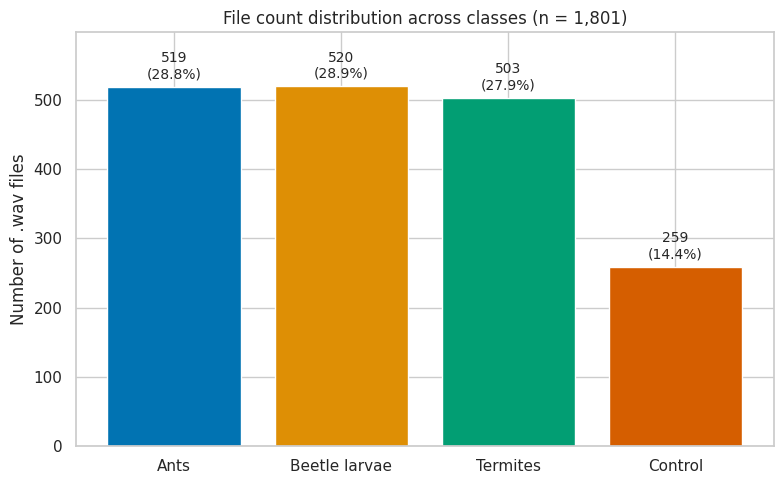


Plot 2: Day × taxon coverage heatmap
  Saved: 02_day_taxon_heatmap.png and 02_day_taxon_heatmap.pdf


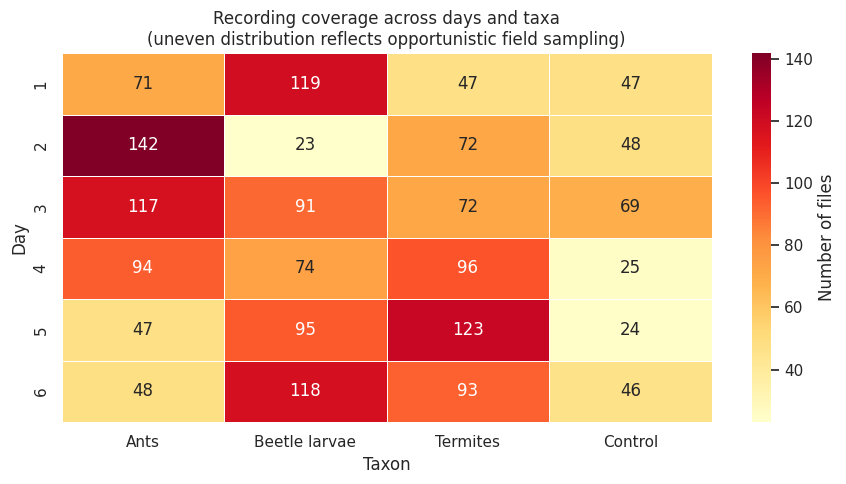


Plot 3: Duration distribution
  Saved: 03_duration_distribution.png and 03_duration_distribution.pdf


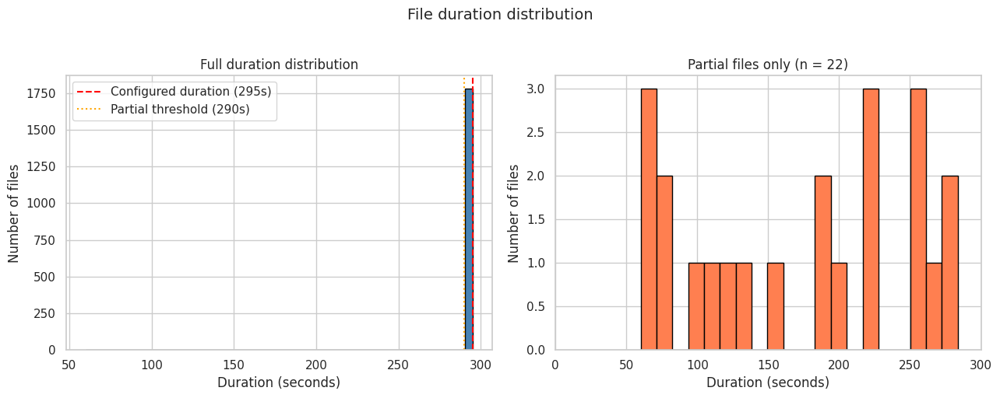


Plot 4: Audio hours by taxon and density
  Saved: 04_audio_hours_by_taxon_density.png and 04_audio_hours_by_taxon_density.pdf


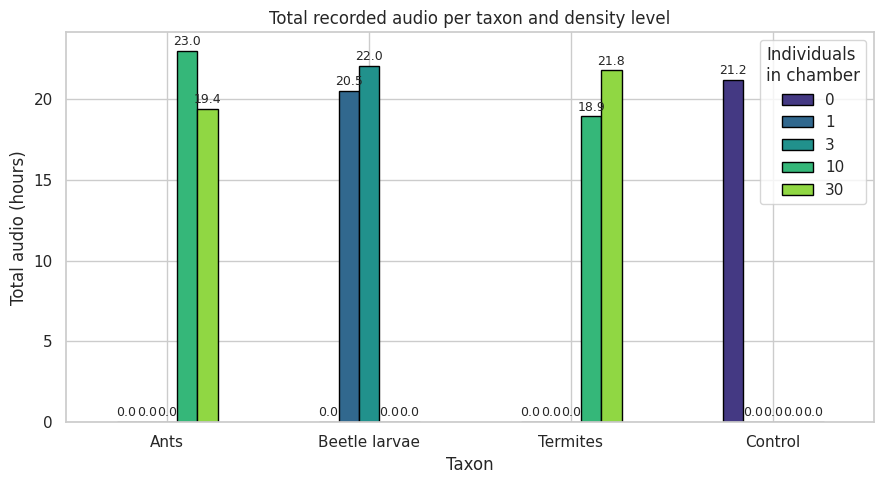


Plot 5: Sessions per taxon × replicate
  Saved: 05_sessions_per_taxon_replicate.png and 05_sessions_per_taxon_replicate.pdf


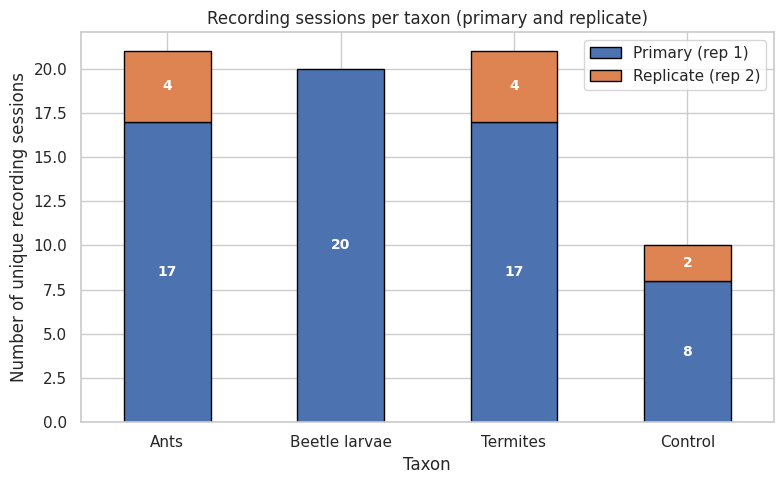


Plot 6: Files per session distribution
  Saved: 06_files_per_session.png and 06_files_per_session.pdf


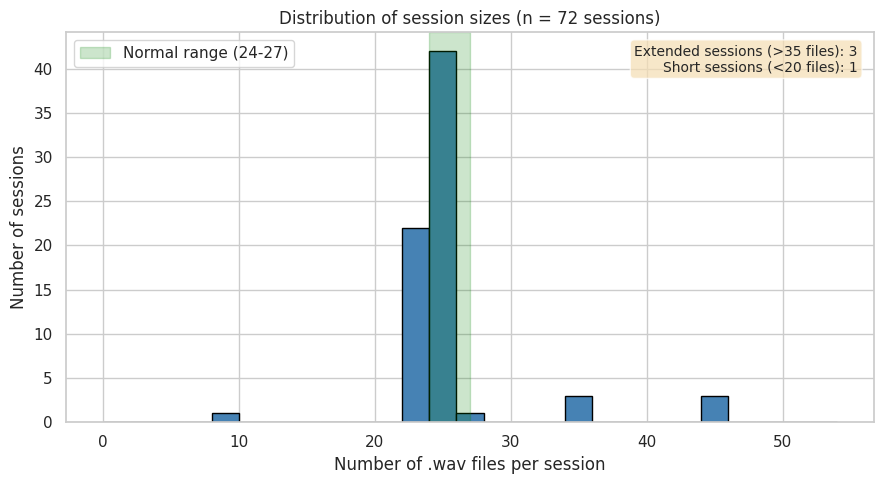


All 6 figures saved to: /content/drive/MyDrive/Invertebrate recordings subset/figures

Files created:
  01_class_distribution.pdf (14.8 KB)
  01_class_distribution.png (112.9 KB)
  02_day_taxon_heatmap.pdf (18.7 KB)
  02_day_taxon_heatmap.png (155.5 KB)
  03_duration_distribution.pdf (15.6 KB)
  03_duration_distribution.png (165.2 KB)
  04_audio_hours_by_taxon_density.pdf (14.9 KB)
  04_audio_hours_by_taxon_density.png (116.5 KB)
  05_sessions_per_taxon_replicate.pdf (17.9 KB)
  05_sessions_per_taxon_replicate.png (128.8 KB)
  06_files_per_session.pdf (15.4 KB)
  06_files_per_session.png (129.8 KB)


In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Create figures directory in Drive
FIGURES_DIR = PROJECT_ROOT / 'figures'
FIGURES_DIR.mkdir(exist_ok=True)
print(f"Figures will be saved to: {FIGURES_DIR}")
print()

# Set consistent style for all plots
sns.set_theme(style='whitegrid', context='notebook', palette='colorblind')
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['savefig.bbox'] = 'tight'
plt.rcParams['font.family'] = 'DejaVu Sans'

# Consistent taxon ordering and colors
TAXON_ORDER = ['ants', 'beetle_larvae', 'termites', 'control']
TAXON_LABELS = {'ants': 'Ants', 'beetle_larvae': 'Beetle larvae',
                'termites': 'Termites', 'control': 'Control'}
TAXON_COLORS = dict(zip(TAXON_ORDER, sns.color_palette('colorblind', n_colors=4)))

def save_figure(fig, name):
    """Save figure as both PNG and PDF."""
    png_path = FIGURES_DIR / f"{name}.png"
    pdf_path = FIGURES_DIR / f"{name}.pdf"
    fig.savefig(png_path)
    fig.savefig(pdf_path)
    print(f"  Saved: {name}.png and {name}.pdf")

# -----------------------------------------------------------------------------
# Plot 1: Class distribution (file counts per taxon)
# -----------------------------------------------------------------------------
print("Plot 1: Class distribution")
fig, ax = plt.subplots(figsize=(8, 5))
counts = inventory_final_df['taxon'].value_counts().reindex(TAXON_ORDER)
bars = ax.bar(range(len(counts)), counts.values,
              color=[TAXON_COLORS[t] for t in TAXON_ORDER])
ax.set_xticks(range(len(counts)))
ax.set_xticklabels([TAXON_LABELS[t] for t in TAXON_ORDER])
ax.set_ylabel('Number of .wav files')
ax.set_title('File count distribution across classes (n = 1,801)')
for i, (taxon, n) in enumerate(counts.items()):
    pct = n / len(inventory_final_df) * 100
    ax.text(i, n + 8, f'{n}\n({pct:.1f}%)', ha='center', va='bottom', fontsize=10)
ax.set_ylim(0, max(counts.values) * 1.15)
plt.tight_layout()
save_figure(fig, '01_class_distribution')
plt.show()
plt.close(fig)
print()

# -----------------------------------------------------------------------------
# Plot 2: Day × taxon coverage heatmap
# -----------------------------------------------------------------------------
print("Plot 2: Day × taxon coverage heatmap")
fig, ax = plt.subplots(figsize=(9, 5))
day_taxon = pd.crosstab(inventory_final_df['day'], inventory_final_df['taxon'])
day_taxon = day_taxon[TAXON_ORDER]
day_taxon.columns = [TAXON_LABELS[c] for c in day_taxon.columns]
sns.heatmap(day_taxon, annot=True, fmt='d', cmap='YlOrRd',
            cbar_kws={'label': 'Number of files'}, ax=ax, linewidths=0.5)
ax.set_xlabel('Taxon')
ax.set_ylabel('Day')
ax.set_title('Recording coverage across days and taxa\n(uneven distribution reflects opportunistic field sampling)')
plt.tight_layout()
save_figure(fig, '02_day_taxon_heatmap')
plt.show()
plt.close(fig)
print()

# -----------------------------------------------------------------------------
# Plot 3: Duration distribution histogram
# -----------------------------------------------------------------------------
print("Plot 3: Duration distribution")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5))

# Full view
ax1.hist(inventory_final_df['duration_s'], bins=50, color='steelblue', edgecolor='black')
ax1.axvline(295, color='red', linestyle='--', label='Configured duration (295s)')
ax1.axvline(290, color='orange', linestyle=':', label='Partial threshold (290s)')
ax1.set_xlabel('Duration (seconds)')
ax1.set_ylabel('Number of files')
ax1.set_title('Full duration distribution')
ax1.legend()

# Zoomed view of the tail (partial files)
partial_files = inventory_final_df[inventory_final_df['is_partial']]
ax2.hist(partial_files['duration_s'], bins=20, color='coral', edgecolor='black')
ax2.set_xlabel('Duration (seconds)')
ax2.set_ylabel('Number of files')
ax2.set_title(f'Partial files only (n = {len(partial_files)})')
ax2.set_xlim(0, 300)

fig.suptitle('File duration distribution', fontsize=14, y=1.02)
plt.tight_layout()
save_figure(fig, '03_duration_distribution')
plt.show()
plt.close(fig)
print()

# -----------------------------------------------------------------------------
# Plot 4: Total audio hours by taxon × density
# -----------------------------------------------------------------------------
print("Plot 4: Audio hours by taxon and density")
fig, ax = plt.subplots(figsize=(9, 5))
hours = inventory_final_df.groupby(['taxon', 'count'])['duration_s'].sum() / 3600
hours = hours.unstack(fill_value=0)
hours = hours.reindex(TAXON_ORDER)
hours.index = [TAXON_LABELS[t] for t in hours.index]

hours.plot(kind='bar', ax=ax, edgecolor='black',
           color=sns.color_palette('viridis', n_colors=len(hours.columns)))
ax.set_ylabel('Total audio (hours)')
ax.set_xlabel('Taxon')
ax.set_title('Total recorded audio per taxon and density level')
ax.legend(title='Individuals\nin chamber', loc='upper right')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
for container in ax.containers:
    ax.bar_label(container, fmt='%.1f', fontsize=9, padding=2)
plt.tight_layout()
save_figure(fig, '04_audio_hours_by_taxon_density')
plt.show()
plt.close(fig)
print()

# -----------------------------------------------------------------------------
# Plot 5: Sessions per taxon × replicate
# -----------------------------------------------------------------------------
print("Plot 5: Sessions per taxon × replicate")
fig, ax = plt.subplots(figsize=(8, 5))
session_keys = ['day', 'batch', 'taxon', 'count', 'replicate_id']
sessions_per_class = (inventory_final_df[session_keys]
                      .drop_duplicates()
                      .groupby(['taxon', 'replicate_id'])
                      .size()
                      .unstack(fill_value=0))
sessions_per_class = sessions_per_class.reindex(TAXON_ORDER)
sessions_per_class.index = [TAXON_LABELS[t] for t in sessions_per_class.index]
sessions_per_class.columns = [f'Primary (rep 1)' if c == 1 else f'Replicate (rep 2)'
                               for c in sessions_per_class.columns]

sessions_per_class.plot(kind='bar', stacked=True, ax=ax, edgecolor='black',
                        color=['#4C72B0', '#DD8452'])
ax.set_ylabel('Number of unique recording sessions')
ax.set_xlabel('Taxon')
ax.set_title('Recording sessions per taxon (primary and replicate)')
ax.set_xticklabels(ax.get_xticklabels(), rotation=0)
ax.legend(loc='upper right')
for container in ax.containers:
    labels = [int(v) if v > 0 else '' for v in container.datavalues]
    ax.bar_label(container, labels=labels, label_type='center', fontsize=10, color='white', weight='bold')
plt.tight_layout()
save_figure(fig, '05_sessions_per_taxon_replicate')
plt.show()
plt.close(fig)
print()

# -----------------------------------------------------------------------------
# Plot 6: Files per session distribution
# -----------------------------------------------------------------------------
print("Plot 6: Files per session distribution")
fig, ax = plt.subplots(figsize=(9, 5))
files_per_session = inventory_final_df.groupby(session_keys).size()

ax.hist(files_per_session.values, bins=range(0, 55, 2), color='steelblue',
        edgecolor='black')
ax.axvspan(24, 27, alpha=0.2, color='green', label='Normal range (24-27)')
ax.set_xlabel('Number of .wav files per session')
ax.set_ylabel('Number of sessions')
ax.set_title(f'Distribution of session sizes (n = {len(files_per_session)} sessions)')
ax.legend()

# Annotate extreme sessions
extended = files_per_session[files_per_session > 35]
short = files_per_session[files_per_session < 20]
annot_text = (f'Extended sessions (>35 files): {len(extended)}\n'
              f'Short sessions (<20 files): {len(short)}')
ax.text(0.98, 0.97, annot_text, transform=ax.transAxes,
        fontsize=10, verticalalignment='top', horizontalalignment='right',
        bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.7))
plt.tight_layout()
save_figure(fig, '06_files_per_session')
plt.show()
plt.close(fig)
print()

print("=" * 70)
print(f"All 6 figures saved to: {FIGURES_DIR}")
print("=" * 70)
print()
print("Files created:")
for f in sorted(FIGURES_DIR.iterdir()):
    print(f"  {f.name} ({f.stat().st_size / 1024:.1f} KB)")

# **PHASE 2: Audio Preprocessing Pipeline Design**

## Block 10: Audio Exploration — Waveforms and Spectrograms

**Purpose:** Develop visual and aural intuition about the recordings before designing the preprocessing pipeline. Every parameter choice in subsequent blocks (frequency ranges, window sizes, normalization) should be informed by what we observe here, not by speech-processing defaults.

**Method:**
1. Sample one representative full-duration recording per (taxon × density) combination, taken from the middle of the recording to avoid setup/handling artifacts (we already dropped first/last files, but mid-file is safest)
2. Load a 30-second segment from the middle of each file
3. Plot the waveform (amplitude over time)
4. Plot the linear-frequency spectrogram (full frequency range, 0-24 kHz given our 48 kHz sample rate)
5. Plot the same data on a log-frequency axis to show low-frequency structure
6. Compute basic statistics (RMS energy, peak amplitude, spectral centroid)

**Why mid-file segments:** Even with first/last file removal, the middle of any given file is least likely to contain transient artifacts from chunk boundaries or background changes.

**What we're looking for:**
- Where in the frequency spectrum is the discriminative signal?
- Are sounds dense (continuous activity) or sparse (occasional events with silence)?
- Are there obvious differences between taxa visible to the eye?
- Are there obvious differences between low and high density (e.g. 10 vs 30 ants)?
- Is there persistent background noise we'll need to handle?

**Note:** This is qualitative exploration. We are not yet making preprocessing decisions — we are gathering observations that will justify those decisions in subsequent blocks.

In [ ]:
import librosa
import librosa.display
import numpy as np

# Sampling parameters
SAMPLE_SEGMENT_DURATION_S = 30  # 30-second window for inspection
RANDOM_SEED = 42  # Reproducible sampling

np.random.seed(RANDOM_SEED)

# Get one representative file per (taxon, count) combination
# Prefer full-duration files, take one randomly per group
full_duration_files = inventory_final_df[~inventory_final_df['is_partial']]

representative_files = (
    full_duration_files
    .groupby(['taxon', 'count'])
    .apply(lambda g: g.sample(n=1, random_state=RANDOM_SEED))
    .reset_index(drop=True)
)

print(f"Sampling {len(representative_files)} representative recordings:")
for _, row in representative_files.iterrows():
    print(f"  {TAXON_LABELS[row['taxon']]:<15} n={row['count']:<2}  Day {row['day']} Batch {row['batch']}  {row['filename']}")
print()

# Load audio segments and build a summary table
audio_samples = {}
stats_rows = []

for _, row in representative_files.iterrows():
    filepath = row['filepath']
    info = sf.info(filepath)

    # Load 30-second segment from the middle of the file
    mid_point_s = info.duration / 2
    start_s = max(0, mid_point_s - SAMPLE_SEGMENT_DURATION_S / 2)

    y, sr = librosa.load(filepath, sr=None, mono=True,
                          offset=start_s, duration=SAMPLE_SEGMENT_DURATION_S)

    key = (row['taxon'], row['count'])
    audio_samples[key] = {
        'audio': y,
        'sr': sr,
        'metadata': row,
        'start_s': start_s,
    }

    # Compute basic statistics
    rms = np.sqrt(np.mean(y**2))
    peak = np.max(np.abs(y))
    spectral_centroid = librosa.feature.spectral_centroid(y=y, sr=sr).mean()
    spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr, roll_percent=0.85).mean()
    zcr = librosa.feature.zero_crossing_rate(y).mean()

    stats_rows.append({
        'taxon': TAXON_LABELS[row['taxon']],
        'count': row['count'],
        'rms_energy': round(rms, 5),
        'peak_amplitude': round(peak, 4),
        'spectral_centroid_hz': round(spectral_centroid, 1),
        'spectral_rolloff_85_hz': round(spectral_rolloff, 1),
        'zero_crossing_rate': round(zcr, 4),
    })

# Print summary statistics
print("=" * 90)
print("BASIC AUDIO STATISTICS (30s segment from middle of each representative file)")
print("=" * 90)
stats_df = pd.DataFrame(stats_rows)
print(stats_df.to_string(index=False))
print()
print("Interpretation guide:")
print("  rms_energy:           overall loudness; higher = more acoustic activity")
print("  peak_amplitude:       loudest moment in 30s (max possible = 1.0)")
print("  spectral_centroid:    frequency 'center of mass'; higher = more high-freq content")
print("  spectral_rolloff_85:  frequency below which 85% of energy lies")
print("  zero_crossing_rate:   how often signal crosses zero; higher = more noise-like/high-freq")

/tmp/ipykernel_501/3409935585.py:18: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.sample(n=1, random_state=RANDOM_SEED))


Sampling 7 representative recordings:
  Ants            n=10  Day 1 Batch 2  20240730_092500.WAV
  Ants            n=30  Day 2 Batch 3  20240801_120000.WAV
  Beetle larvae   n=1   Day 4 Batch 3  20240808_112500.WAV
  Beetle larvae   n=3   Day 1 Batch 3  20240730_113500.WAV
  Control         n=0   Day 2 Batch 4  20240801_135500.WAV
  Termites        n=10  Day 1 Batch 3  20240730_114500.WAV
  Termites        n=30  Day 2 Batch 1  20240801_062500.WAV

BASIC AUDIO STATISTICS (30s segment from middle of each representative file)
        taxon  count  rms_energy  peak_amplitude  spectral_centroid_hz  spectral_rolloff_85_hz  zero_crossing_rate
         Ants     10     0.00133          0.0070               10932.8                 19987.0              0.4075
         Ants     30     0.00670          0.1027                9486.6                 19261.9              0.1717
Beetle larvae      1     0.03708          0.9649                4271.5                 10418.4              0.0553
Beetle larv

## Block 10b: Waveforms and Spectrograms of Representative Recordings

**Purpose:** Visualize the same 7 recordings from Block 10a as waveforms and spectrograms to interpret the surprising numerical patterns observed.

**Three views per recording:**
1. **Waveform** — amplitude over time. Reveals discrete events vs continuous noise, clipping, transients.
2. **Linear-frequency spectrogram (0-24 kHz)** — shows the full Nyquist range. Useful for spotting high-frequency content but compresses the low-frequency region where substrate vibrations typically reside.
3. **Log-frequency spectrogram** — expands the low-frequency region. Critical for invertebrate vibroacoustics because much of the discriminative signal may lie below 2 kHz.

**Visualization choices:**
- All spectrograms use the same dB range (-80 to 0 dB) for cross-sample comparability
- STFT parameters: `n_fft=2048`, `hop_length=512`, `window='hann'` — these are exploration defaults, not final preprocessing parameters. We will revisit and justify spectrogram parameters in Block 13 based on what we observe here.
- Mel-spectrograms are NOT used here. We want to see the raw frequency content first, undistorted by perceptual scaling.

**What to look for:**
- **Event structure:** Are sounds discrete pulses (clicks, chirps) or continuous (hum, hiss)?
- **Frequency bands:** Where does the energy concentrate? Same band across taxa or different?
- **Density effects:** Does going from 10 → 30 individuals add more events, louder events, or different events?
- **Background noise:** Is there a constant hum (microphone self-noise, AC, fan)? At what frequency?
- **Control recording:** What does "no organisms" actually look like? Identifies the noise floor we need to distinguish biological signal from.

Plotting Ants (n=10)...
  Saved: 10_audio_explore_01_ants_n10.png and 10_audio_explore_01_ants_n10.pdf


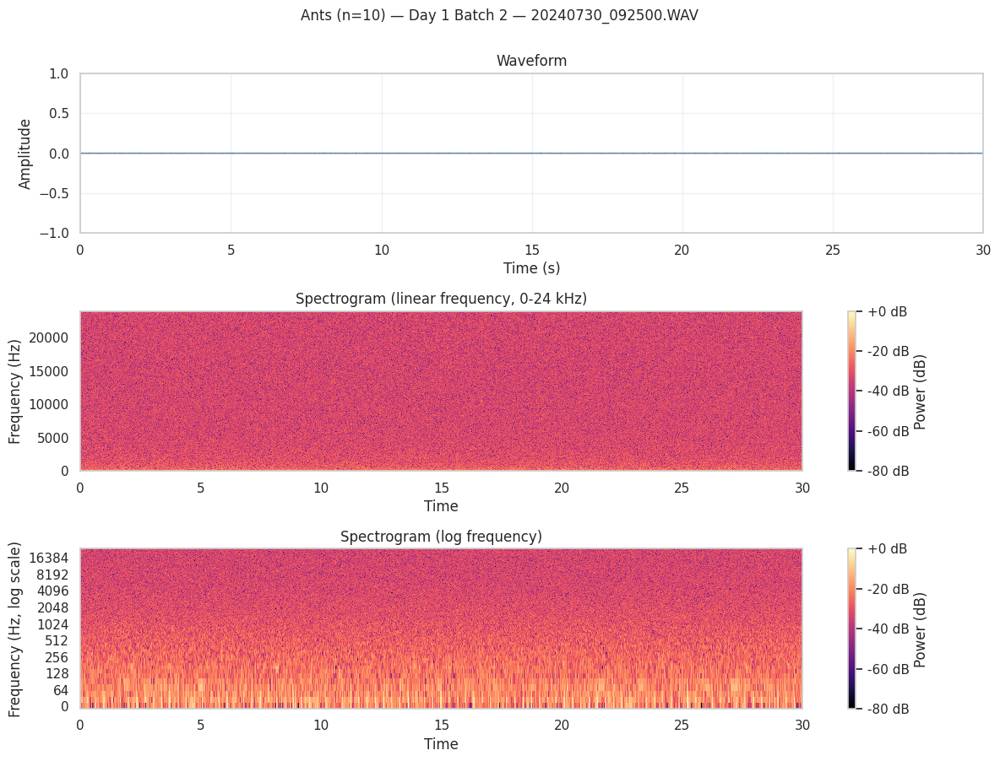

Plotting Ants (n=30)...
  Saved: 10_audio_explore_02_ants_n30.png and 10_audio_explore_02_ants_n30.pdf


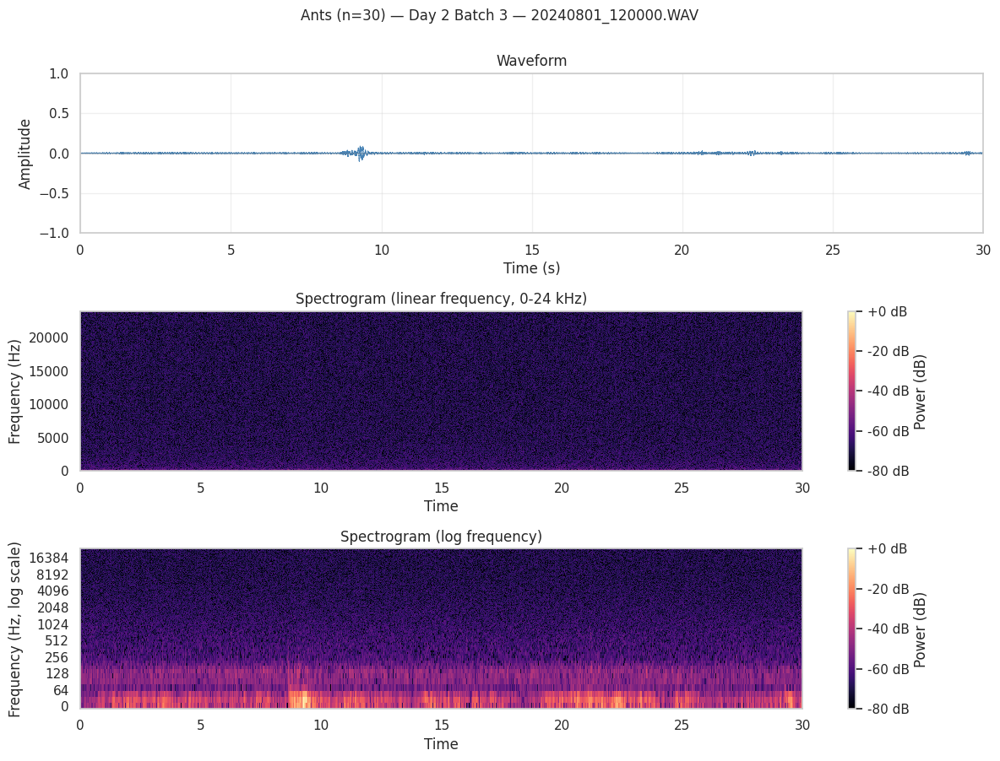

Plotting Beetle larvae (n=1)...
  Saved: 10_audio_explore_03_beetle_larvae_n1.png and 10_audio_explore_03_beetle_larvae_n1.pdf


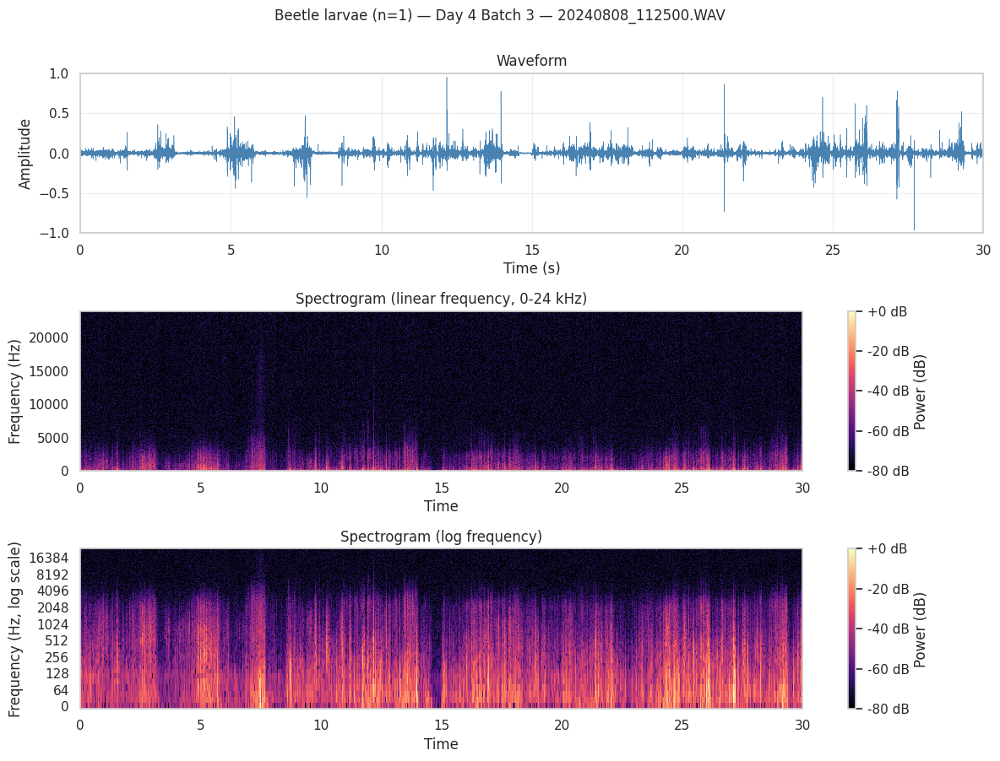

Plotting Beetle larvae (n=3)...
  Saved: 10_audio_explore_04_beetle_larvae_n3.png and 10_audio_explore_04_beetle_larvae_n3.pdf


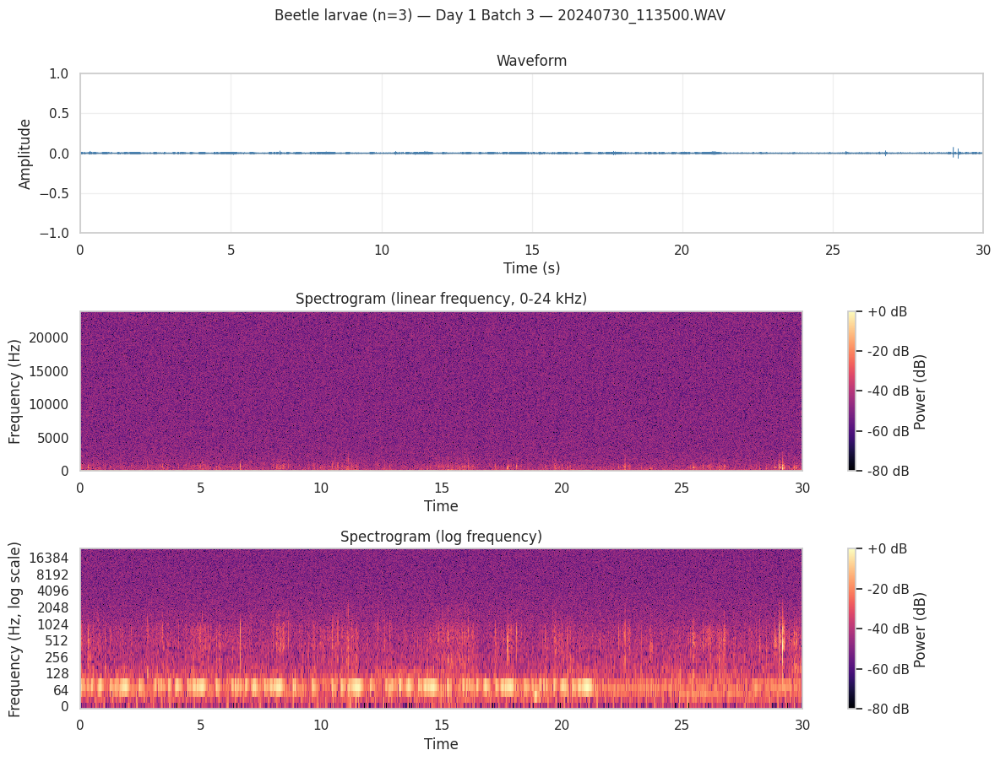

Plotting Termites (n=10)...
  Saved: 10_audio_explore_05_termites_n10.png and 10_audio_explore_05_termites_n10.pdf


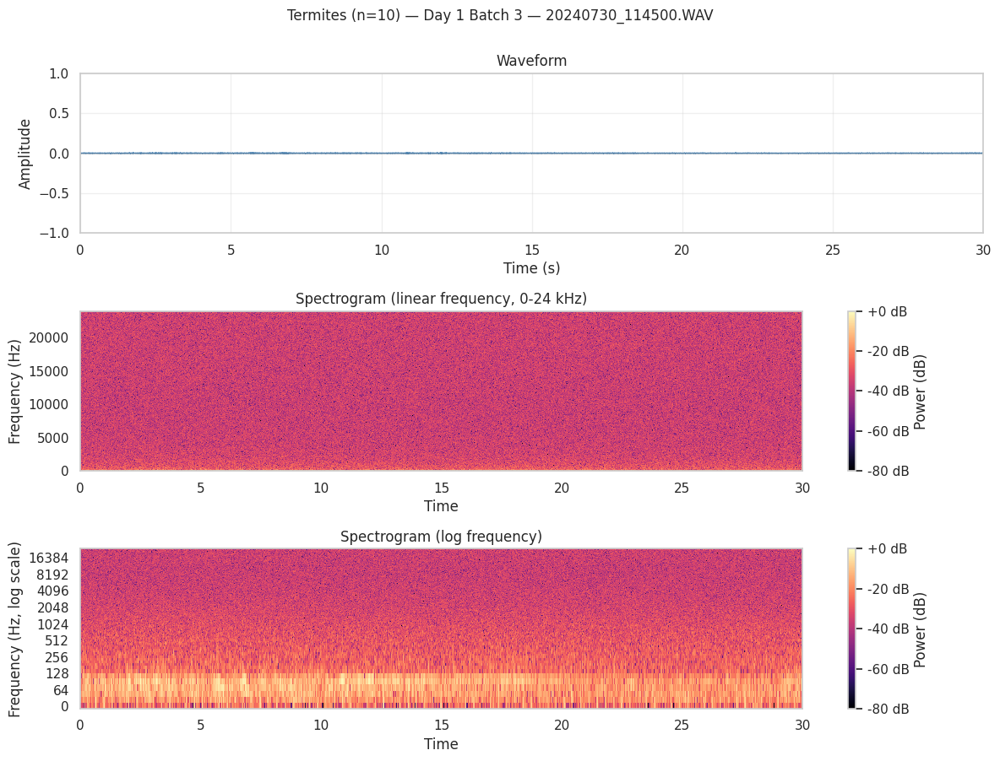

Plotting Termites (n=30)...
  Saved: 10_audio_explore_06_termites_n30.png and 10_audio_explore_06_termites_n30.pdf


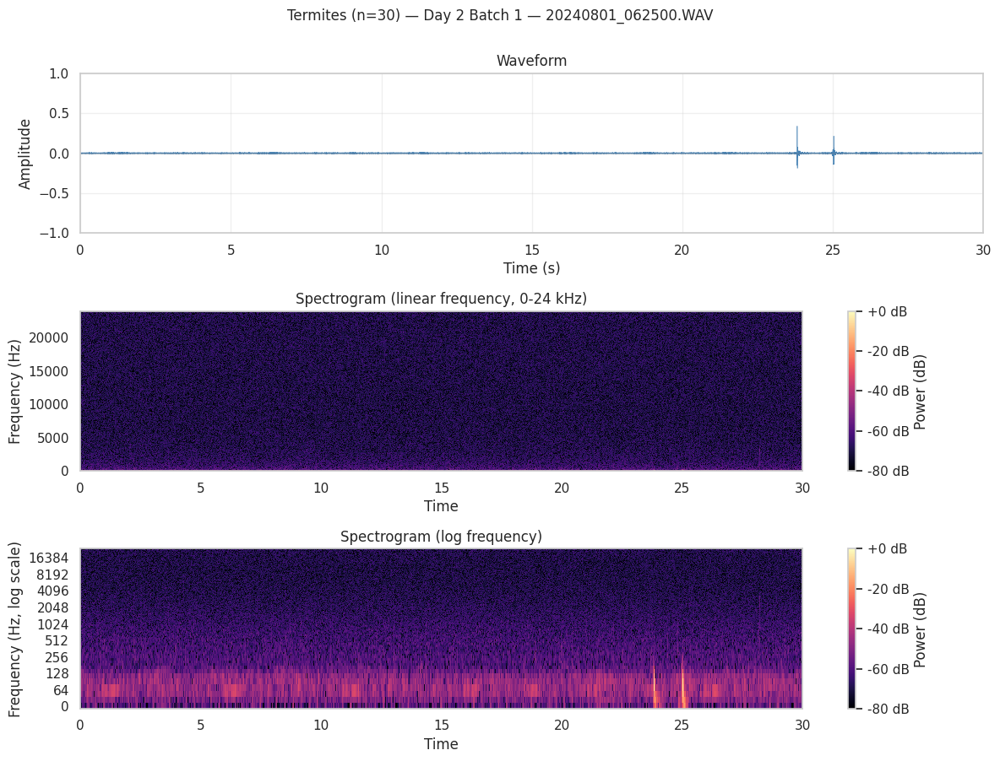

Plotting Control (n=0)...
  Saved: 10_audio_explore_07_control_n0.png and 10_audio_explore_07_control_n0.pdf


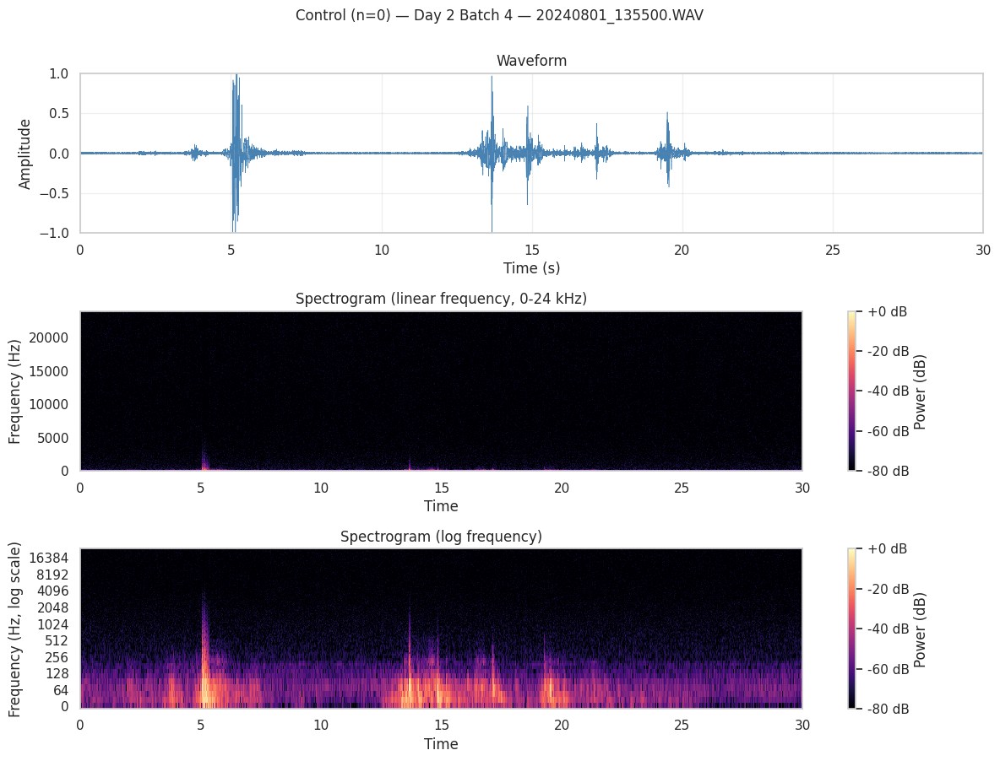


All 7 audio exploration plots saved.


In [ ]:
import librosa.display

# STFT parameters for exploration (NOT final pipeline parameters)
N_FFT = 2048
HOP_LENGTH = 512
WINDOW = 'hann'

# Consistent dB range for cross-sample comparison
DB_MIN, DB_MAX = -80, 0

# Plot order: matches the order in Block 10a output
plot_order = [
    ('ants', 10), ('ants', 30),
    ('beetle_larvae', 1), ('beetle_larvae', 3),
    ('termites', 10), ('termites', 30),
    ('control', 0),
]

def plot_audio_sample(audio_data, key, save_name):
    """Plot waveform + linear spectrogram + log spectrogram for one recording."""
    y = audio_data['audio']
    sr = audio_data['sr']
    meta = audio_data['metadata']

    # Compute STFT once, reuse for both spectrograms
    D = librosa.stft(y, n_fft=N_FFT, hop_length=HOP_LENGTH, window=WINDOW)
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    fig, axes = plt.subplots(3, 1, figsize=(12, 9))

    title_str = (f"{TAXON_LABELS[key[0]]} (n={key[1]}) — "
                 f"Day {meta['day']} Batch {meta['batch']} — "
                 f"{meta['filename']}")

    # Waveform
    times = np.arange(len(y)) / sr
    axes[0].plot(times, y, linewidth=0.4, color='steelblue')
    axes[0].set_xlabel('Time (s)')
    axes[0].set_ylabel('Amplitude')
    axes[0].set_title('Waveform')
    axes[0].set_xlim(0, len(y) / sr)
    axes[0].set_ylim(-1, 1)
    axes[0].axhline(0, color='gray', linewidth=0.3)
    axes[0].grid(True, alpha=0.3)

    # Linear-frequency spectrogram
    img1 = librosa.display.specshow(
        S_db, sr=sr, hop_length=HOP_LENGTH,
        x_axis='time', y_axis='linear',
        ax=axes[1], vmin=DB_MIN, vmax=DB_MAX, cmap='magma'
    )
    axes[1].set_title('Spectrogram (linear frequency, 0-24 kHz)')
    axes[1].set_ylabel('Frequency (Hz)')
    fig.colorbar(img1, ax=axes[1], format='%+2.0f dB', label='Power (dB)')

    # Log-frequency spectrogram
    img2 = librosa.display.specshow(
        S_db, sr=sr, hop_length=HOP_LENGTH,
        x_axis='time', y_axis='log',
        ax=axes[2], vmin=DB_MIN, vmax=DB_MAX, cmap='magma'
    )
    axes[2].set_title('Spectrogram (log frequency)')
    axes[2].set_ylabel('Frequency (Hz, log scale)')
    fig.colorbar(img2, ax=axes[2], format='%+2.0f dB', label='Power (dB)')

    fig.suptitle(title_str, fontsize=12, y=1.00)
    plt.tight_layout()
    save_figure(fig, save_name)
    plt.show()
    plt.close(fig)

# Generate plots for each recording
for i, key in enumerate(plot_order, start=1):
    if key not in audio_samples:
        print(f"Skipping {key} — not in audio_samples (was it sampled?)")
        continue
    save_name = f"10_audio_explore_{i:02d}_{key[0]}_n{key[1]}"
    print(f"Plotting {TAXON_LABELS[key[0]]} (n={key[1]})...")
    plot_audio_sample(audio_samples[key], key, save_name)

print()
print("=" * 70)
print("All 7 audio exploration plots saved.")
print("=" * 70)

## Block 11: Multi-Sample Audio Survey

**Purpose:** Replace single-sample anecdotes from Block 10 with distributions of acoustic properties across multiple samples per class. Provides empirical basis for preprocessing parameter choices.

**Method:**
1. Sample 5 full-duration recordings per (taxon × count) cell — 35 files total
2. Load 30s mid-file segment from each
3. Compute per-segment statistics: RMS, peak amplitude, clipping presence, clipped sample count
4. Compute average Power Spectral Density (PSD) per class using Welch's method
5. Aggregate results into:
   - Distribution tables of energy and clipping metrics per (taxon × count) cell
   - Per-class average PSD plots showing where energy concentrates in frequency
   - Comparison of taxon PSDs against control PSD to identify organism-specific frequency content

**Statistical rationale (Welch's method):** Welch's method estimates PSD by averaging the squared magnitudes of multiple windowed FFT segments. This produces a smoother, more robust estimate than a single FFT — appropriate for our goal of characterizing typical spectral content rather than capturing individual transients.

**What this lets us decide afterwards:**
- Whether to high-pass filter (and at what cutoff)
- Whether clipping is rare or systematic (affects whether we need to handle it)
- What `fmin` and `fmax` to use for mel-spectrograms
- Whether any (taxon × count) cells have characteristics so different from their class that they need special handling

/tmp/ipykernel_501/3357541261.py:21: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.sample(n=min(N_SAMPLES_PER_CELL, len(g)), random_state=RANDOM_SEED))


Survey will analyze 35 recordings across 7 cells

Loading and analyzing samples...
  Processing 5/35: ants n=10
  Processing 10/35: ants n=30
  Processing 15/35: beetle_larvae n=1
  Processing 20/35: beetle_larvae n=3
  Processing 25/35: control n=0
  Processing 30/35: termites n=10
  Processing 35/35: termites n=30

Survey complete. 35 files analyzed.

TABLE A: Per-cell summary statistics (mean ± std across 5 samples per cell)
                     n_samples  rms_mean  rms_std  peak_mean  peak_max  n_clipped_files  total_clipped_samples
taxon         count                                                                                           
ants          10             5   0.00664  0.00813    0.05665   0.21539                0                      0
              30             5   0.00668  0.00567    0.06700   0.10724                0                      0
beetle_larvae 1              5   0.01206  0.01577    0.40541   0.99997                1                      9
             

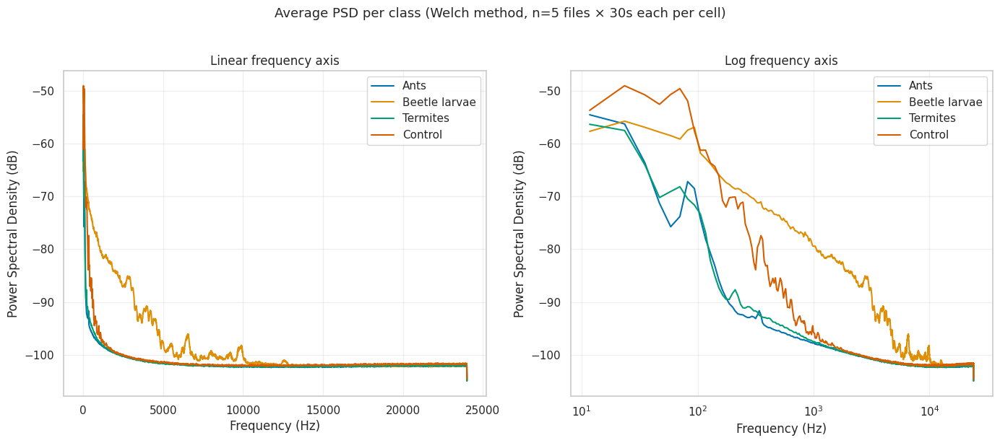

Generating PSD-vs-control plot...
  Saved: 11_psd_diff_from_control.png and 11_psd_diff_from_control.pdf


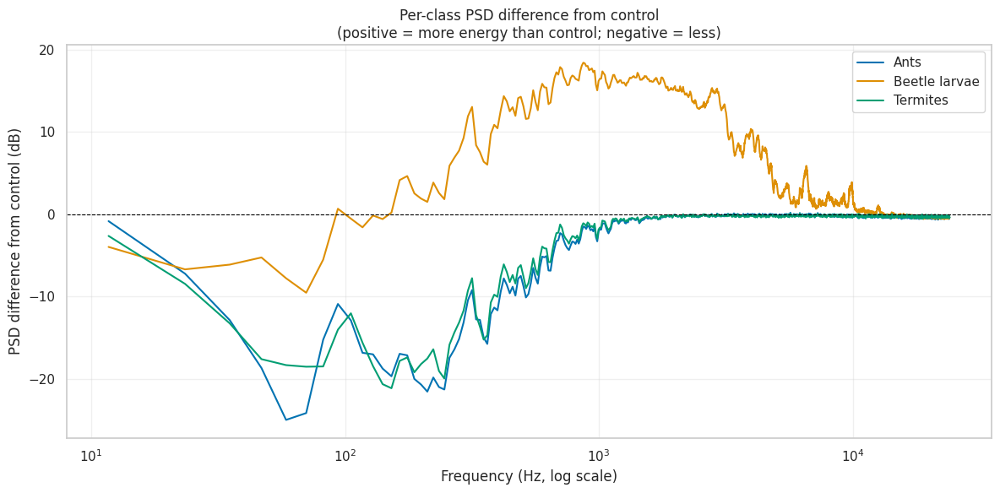


Block 11 complete.


In [ ]:
from scipy.signal import welch

# Survey parameters
N_SAMPLES_PER_CELL = 5
SEGMENT_DURATION_S = 30
CLIPPING_THRESHOLD = 0.99  # |x| >= this counts as clipped
RANDOM_SEED = 42

# Welch PSD parameters
WELCH_NPERSEG = 4096   # FFT window length
WELCH_NOVERLAP = 2048  # 50% overlap

np.random.seed(RANDOM_SEED)

# Sample 5 full-duration files per (taxon, count) cell
full_duration = inventory_final_df[~inventory_final_df['is_partial']]

survey_files = (
    full_duration
    .groupby(['taxon', 'count'], group_keys=False)
    .apply(lambda g: g.sample(n=min(N_SAMPLES_PER_CELL, len(g)), random_state=RANDOM_SEED))
    .reset_index(drop=True)
)

print(f"Survey will analyze {len(survey_files)} recordings across {survey_files.groupby(['taxon', 'count']).ngroups} cells")
print()

# Storage for results
survey_stats = []
psd_storage = {}  # keyed by (taxon, count), each value is list of PSDs

print("Loading and analyzing samples...")
for i, row in enumerate(survey_files.itertuples(), start=1):
    if i % 5 == 0 or i == len(survey_files):
        print(f"  Processing {i}/{len(survey_files)}: {row.taxon} n={row.count}")

    info = sf.info(row.filepath)
    mid_point_s = info.duration / 2
    start_s = max(0, mid_point_s - SEGMENT_DURATION_S / 2)

    y, sr = librosa.load(row.filepath, sr=None, mono=True,
                          offset=start_s, duration=SEGMENT_DURATION_S)

    # Energy stats
    rms = np.sqrt(np.mean(y**2))
    peak = np.max(np.abs(y))

    # Clipping detection
    n_clipped = np.sum(np.abs(y) >= CLIPPING_THRESHOLD)
    is_clipped = n_clipped > 0

    survey_stats.append({
        'taxon': row.taxon,
        'count': row.count,
        'filename': row.filename,
        'day': row.day,
        'batch': row.batch,
        'rms': rms,
        'peak': peak,
        'is_clipped': is_clipped,
        'n_clipped_samples': int(n_clipped),
    })

    # Compute PSD with Welch's method
    freqs, psd = welch(y, fs=sr, nperseg=WELCH_NPERSEG, noverlap=WELCH_NOVERLAP)

    key = (row.taxon, row.count)
    if key not in psd_storage:
        psd_storage[key] = []
    psd_storage[key].append(psd)

survey_df = pd.DataFrame(survey_stats)
print()
print(f"Survey complete. {len(survey_df)} files analyzed.")
print()

# =============================================================================
# Summary table: per-cell statistics
# =============================================================================
print("=" * 90)
print("TABLE A: Per-cell summary statistics (mean ± std across 5 samples per cell)")
print("=" * 90)

agg = survey_df.groupby(['taxon', 'count']).agg(
    n_samples=('rms', 'count'),
    rms_mean=('rms', 'mean'),
    rms_std=('rms', 'std'),
    peak_mean=('peak', 'mean'),
    peak_max=('peak', 'max'),
    n_clipped_files=('is_clipped', 'sum'),
    total_clipped_samples=('n_clipped_samples', 'sum'),
).round(5)

print(agg.to_string())
print()

# =============================================================================
# Clipping summary
# =============================================================================
print("=" * 90)
print("TABLE B: Clipping summary by class")
print("=" * 90)

clip_by_taxon = survey_df.groupby('taxon').agg(
    n_total=('is_clipped', 'count'),
    n_clipped=('is_clipped', 'sum'),
).reset_index()
clip_by_taxon['pct_clipped'] = (clip_by_taxon['n_clipped'] / clip_by_taxon['n_total'] * 100).round(1)
print(clip_by_taxon.to_string(index=False))
print()

# =============================================================================
# Average PSD per class (taxon, ignoring count)
# =============================================================================
print("=" * 90)
print("TABLE C: Frequencies (Hz) containing peak energy per class — top 5 bins")
print("=" * 90)

# Aggregate PSDs by taxon (collapsing across counts)
psd_by_taxon = {}
for (taxon, count), psd_list in psd_storage.items():
    if taxon not in psd_by_taxon:
        psd_by_taxon[taxon] = []
    psd_by_taxon[taxon].extend(psd_list)

# Average and find peak frequencies
for taxon in TAXON_ORDER:
    if taxon not in psd_by_taxon:
        continue
    avg_psd = np.mean(psd_by_taxon[taxon], axis=0)
    top5_idx = np.argsort(avg_psd)[-5:][::-1]
    top5_freqs = freqs[top5_idx]
    top5_power_db = 10 * np.log10(avg_psd[top5_idx] + 1e-12)
    print(f"  {TAXON_LABELS[taxon]:<15}", end='')
    for f, p in zip(top5_freqs, top5_power_db):
        print(f"  {f:>7.1f} Hz ({p:+.1f} dB)", end='')
    print()
print()

# =============================================================================
# Plot: Average PSD per class
# =============================================================================
print("Generating average PSD plot...")
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

for taxon in TAXON_ORDER:
    if taxon not in psd_by_taxon:
        continue
    avg_psd = np.mean(psd_by_taxon[taxon], axis=0)
    psd_db = 10 * np.log10(avg_psd + 1e-12)
    ax1.plot(freqs, psd_db, label=TAXON_LABELS[taxon],
             color=TAXON_COLORS[taxon], linewidth=1.5)
    ax2.semilogx(freqs[1:], psd_db[1:], label=TAXON_LABELS[taxon],
                 color=TAXON_COLORS[taxon], linewidth=1.5)

for ax, title, xscale in [(ax1, 'Linear frequency axis', 'linear'),
                          (ax2, 'Log frequency axis', 'log')]:
    ax.set_xlabel('Frequency (Hz)')
    ax.set_ylabel('Power Spectral Density (dB)')
    ax.set_title(title)
    ax.legend(loc='upper right')
    ax.grid(True, alpha=0.3)

fig.suptitle('Average PSD per class (Welch method, n=5 files × 30s each per cell)',
             fontsize=13, y=1.02)
plt.tight_layout()
save_figure(fig, '11_average_psd_per_class')
plt.show()
plt.close(fig)

# =============================================================================
# Plot: Difference from control (taxon PSD minus control PSD)
# =============================================================================
print("Generating PSD-vs-control plot...")
if 'control' in psd_by_taxon:
    control_avg_psd_db = 10 * np.log10(np.mean(psd_by_taxon['control'], axis=0) + 1e-12)

    fig, ax = plt.subplots(figsize=(12, 6))
    for taxon in ['ants', 'beetle_larvae', 'termites']:
        if taxon not in psd_by_taxon:
            continue
        taxon_psd_db = 10 * np.log10(np.mean(psd_by_taxon[taxon], axis=0) + 1e-12)
        diff = taxon_psd_db - control_avg_psd_db
        ax.semilogx(freqs[1:], diff[1:], label=TAXON_LABELS[taxon],
                    color=TAXON_COLORS[taxon], linewidth=1.5)

    ax.axhline(0, color='black', linewidth=0.8, linestyle='--')
    ax.set_xlabel('Frequency (Hz, log scale)')
    ax.set_ylabel('PSD difference from control (dB)')
    ax.set_title('Per-class PSD difference from control\n'
                 '(positive = more energy than control; negative = less)')
    ax.legend(loc='upper right')
    ax.grid(True, alpha=0.3)
    plt.tight_layout()
    save_figure(fig, '11_psd_diff_from_control')
    plt.show()
    plt.close(fig)

print()
print("=" * 70)
print("Block 11 complete.")
print("=" * 70)

## Block 12: Dataset-Wide Clipping Detection

**Purpose:** Determine the true clipping rate across the entire dataset (all 1,801 files), not just the 35-file survey sample, and identify which files and classes are affected.

**Why this matters:** Block 11 found that ~6% of survey files contained clipping, but with n=5 per cell the estimate is imprecise. Some classes may have higher clipping rates than others; some sessions may have systematic clipping. Knowing the true rate informs whether clipping needs to be a preprocessing concern or just a metadata flag.

**Method:**
1. For every file in the cleaned inventory, load the full audio
2. Count samples where |amplitude| ≥ 0.99 (clipping threshold)
3. Record clipping flag and clipped sample count for each file
4. Aggregate by class, day, batch to identify patterns
5. Merge results into the inventory DataFrame
6. Persist updated inventory to Drive

**Note on runtime:** This requires loading every audio file (not just headers), so will take longer than previous blocks — roughly 15-25 minutes for 1,801 files. We use efficient checking: scan only for the clipping condition, don't load into a larger format than needed.

**Output:**
- Per-class clipping rates
- Per-day and per-batch clipping rates (to identify systematic issues)
- List of files with highest clipped-sample counts (worst offenders)
- Updated inventory CSV including `has_clipping` and `n_clipped_samples` columns

In [ ]:
from tqdm import tqdm

CLIPPING_THRESHOLD = 0.99

print(f"Scanning {len(inventory_final_df)} files for clipping...")
print(f"Clipping threshold: |amplitude| >= {CLIPPING_THRESHOLD}")
print()

clipping_results = []

for idx, row in tqdm(inventory_final_df.iterrows(), total=len(inventory_final_df)):
    try:
        # Load full audio (mono, original sample rate)
        y, sr = librosa.load(row['filepath'], sr=None, mono=True)
        n_clipped = int(np.sum(np.abs(y) >= CLIPPING_THRESHOLD))
        peak = float(np.max(np.abs(y)))
        clipping_results.append({
            'filepath': row['filepath'],
            'has_clipping': n_clipped > 0,
            'n_clipped_samples': n_clipped,
            'peak_amplitude': round(peak, 4),
        })
    except Exception as e:
        clipping_results.append({
            'filepath': row['filepath'],
            'has_clipping': None,
            'n_clipped_samples': None,
            'peak_amplitude': None,
        })

clipping_df = pd.DataFrame(clipping_results)
print()
print(f"Clipping scan complete. Files processed: {len(clipping_df)}")
print()

# Merge into main inventory
inventory_final_df = inventory_final_df.merge(clipping_df, on='filepath', how='left')

# =============================================================================
# Summary statistics
# =============================================================================
print("=" * 70)
print("TABLE A: Overall clipping rate")
print("=" * 70)
n_total = len(inventory_final_df)
n_clipped = inventory_final_df['has_clipping'].sum()
print(f"Total files:            {n_total}")
print(f"Files with clipping:    {n_clipped} ({n_clipped/n_total*100:.1f}%)")
print(f"Files without clipping: {n_total - n_clipped} ({(n_total-n_clipped)/n_total*100:.1f}%)")
print()

print("=" * 70)
print("TABLE B: Clipping rate per taxon class")
print("=" * 70)
clip_per_taxon = inventory_final_df.groupby('taxon').agg(
    n_files=('has_clipping', 'count'),
    n_clipped=('has_clipping', 'sum'),
    total_clipped_samples=('n_clipped_samples', 'sum'),
).reset_index()
clip_per_taxon['pct_clipped'] = (clip_per_taxon['n_clipped'] / clip_per_taxon['n_files'] * 100).round(2)
clip_per_taxon = clip_per_taxon[['taxon', 'n_files', 'n_clipped', 'pct_clipped', 'total_clipped_samples']]
print(clip_per_taxon.to_string(index=False))
print()

print("=" * 70)
print("TABLE C: Clipping rate per (taxon, count) cell")
print("=" * 70)
clip_per_cell = inventory_final_df.groupby(['taxon', 'count']).agg(
    n_files=('has_clipping', 'count'),
    n_clipped=('has_clipping', 'sum'),
).reset_index()
clip_per_cell['pct_clipped'] = (clip_per_cell['n_clipped'] / clip_per_cell['n_files'] * 100).round(2)
print(clip_per_cell.to_string(index=False))
print()

print("=" * 70)
print("TABLE D: Clipping rate per day")
print("=" * 70)
clip_per_day = inventory_final_df.groupby('day').agg(
    n_files=('has_clipping', 'count'),
    n_clipped=('has_clipping', 'sum'),
).reset_index()
clip_per_day['pct_clipped'] = (clip_per_day['n_clipped'] / clip_per_day['n_files'] * 100).round(2)
print(clip_per_day.to_string(index=False))
print()

print("=" * 70)
print("TABLE E: Top 10 most-clipped files")
print("=" * 70)
top_clipped = inventory_final_df.nlargest(10, 'n_clipped_samples')[
    ['day', 'batch', 'taxon', 'count', 'filename', 'n_clipped_samples', 'peak_amplitude']
]
print(top_clipped.to_string(index=False))
print()

# =============================================================================
# Persist updated inventory
# =============================================================================
INVENTORY_SAVE_PATH = PROJECT_ROOT / 'inventory_final.csv'
inventory_final_df.to_csv(INVENTORY_SAVE_PATH, index=False)
print(f"Updated inventory saved to: {INVENTORY_SAVE_PATH}")
print(f"New columns added: has_clipping, n_clipped_samples, peak_amplitude")
print(f"Total columns: {len(inventory_final_df.columns)}")

Scanning 1801 files for clipping...
Clipping threshold: |amplitude| >= 0.99



100%|██████████| 1801/1801 [40:15<00:00,  1.34s/it]



Clipping scan complete. Files processed: 1801

TABLE A: Overall clipping rate
Total files:            1801
Files with clipping:    177 (9.8%)
Files without clipping: 1624 (90.2%)

TABLE B: Clipping rate per taxon class
        taxon  n_files  n_clipped  pct_clipped  total_clipped_samples
         ants      519         24         4.62                 122845
beetle_larvae      520         72        13.85                  74202
      control      259         47        18.15                  81535
     termites      503         34         6.76                 176193

TABLE C: Clipping rate per (taxon, count) cell
        taxon  count  n_files  n_clipped  pct_clipped
         ants     10      282         19         6.74
         ants     30      237          5         2.11
beetle_larvae      1      251         34        13.55
beetle_larvae      3      269         38        14.13
      control      0      259         47        18.15
     termites     10      235         20         8.51
    

## Block 13: Control Class Quality Review

**Purpose:** Inspect control recordings from all sessions to identify the proportion of clean (ambient only) vs contaminated (containing transient non-biological events) controls. Build empirical evidence for the control class treatment discussion with the PhD student.

**Method:**
1. Identify all unique control sessions in the inventory (10 sessions, one per session per day-batch combination where controls were recorded)
2. Sample one representative full-duration file from each session (mid-file 30s segment, same as Block 10b)
3. Generate waveform + log-frequency spectrogram for each
4. Also compute and report quantitative properties (RMS, peak, clipping count) for systematic comparison

**Why one file per session rather than random sampling:** We want full temporal coverage across the experiment rather than oversampling any particular session. If control quality varies across days (which clipping rates suggest), one-per-session reveals that pattern.

**Output interpretation framework:**
- "Clean" control: low amplitude throughout, no transient bursts, broadband spectrogram shows only the persistent low-frequency band (chamber/AudioMoth signature)
- "Contaminated" control: contains visible amplitude spikes, transient events visible as bright vertical streaks in spectrogram, possible clipping

Total control sessions in dataset: 10

Control sessions:
 day  batch   taxon  count  replicate_id
   1      2 control      0             1
   1      4 control      0             1
   2      4 control      0             1
   2      4 control      0             2
   3      3 control      0             1
   3      4 control      0             1
   4      1 control      0             1
   5      2 control      0             1
   6      3 control      0             1
   6      3 control      0             2

Selected 10 control samples (one per session)

Loading 30-second mid-file segments...

Quantitative summary of selected control samples (30s mid-file segments)
 day  batch  rep            filename     rms   peak  n_clipped
   1      2    1 20240730_094500.WAV 0.00158 0.0081          0
   1      4    1 20240730_140500.WAV 0.00374 0.0693          0
   2      4    1 20240801_131500.WAV 0.08469 1.0000       1037
   2      4    2 20240801_131500.WAV 0.01889 0.3058          0
   3      3    1

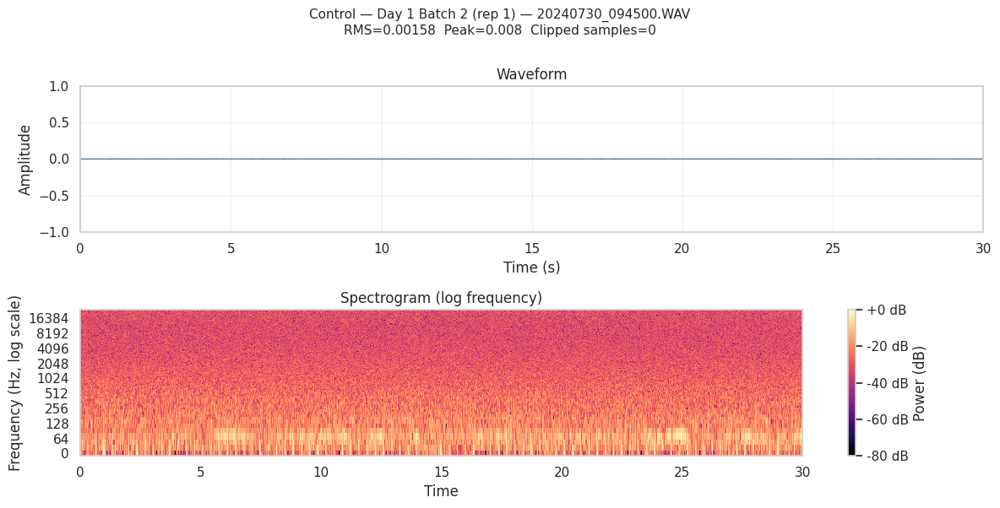

  Saved: 13_control_d1_b4_rep1.png and 13_control_d1_b4_rep1.pdf


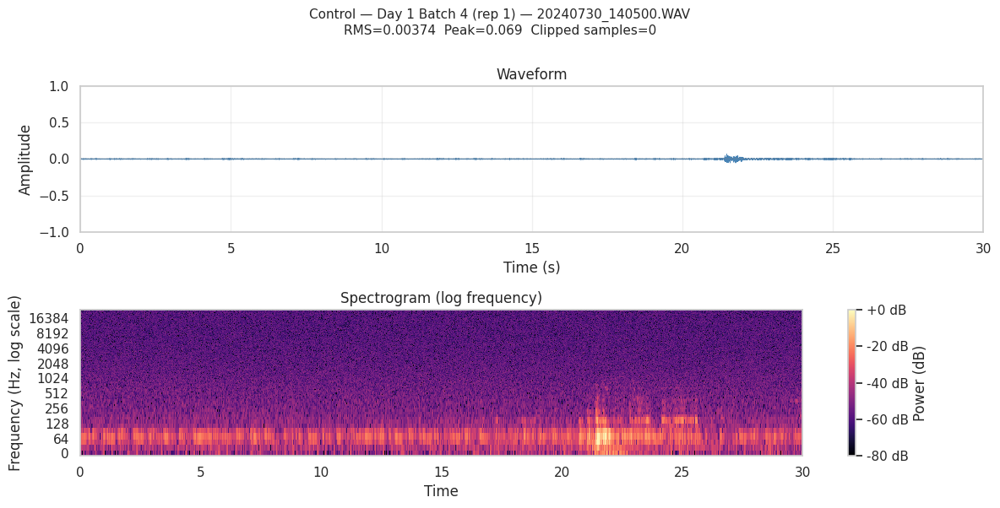

  Saved: 13_control_d2_b4_rep1.png and 13_control_d2_b4_rep1.pdf


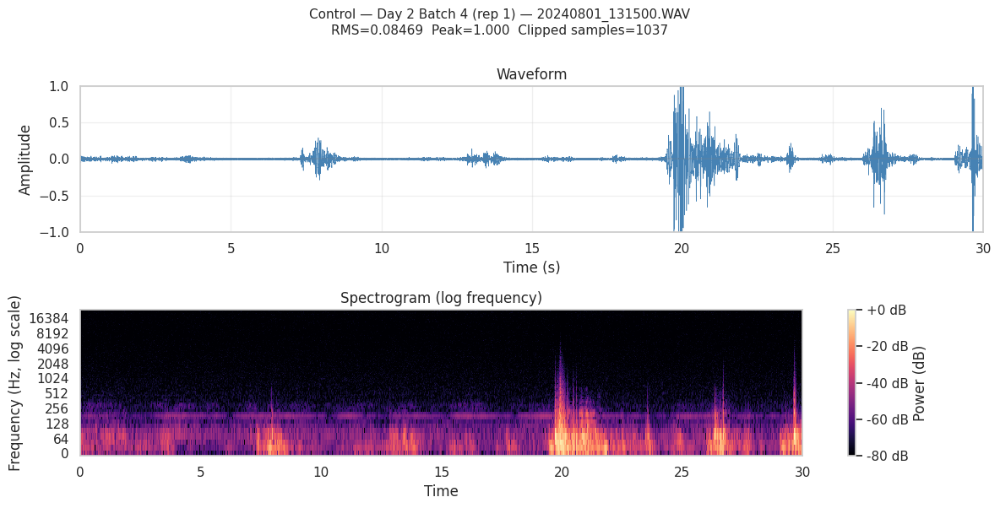

  Saved: 13_control_d2_b4_rep2.png and 13_control_d2_b4_rep2.pdf


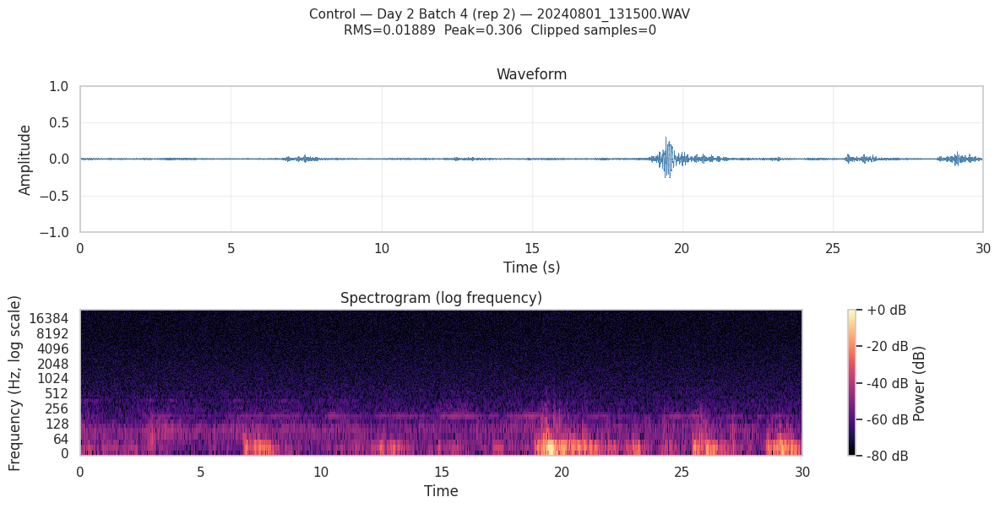

  Saved: 13_control_d3_b3_rep1.png and 13_control_d3_b3_rep1.pdf


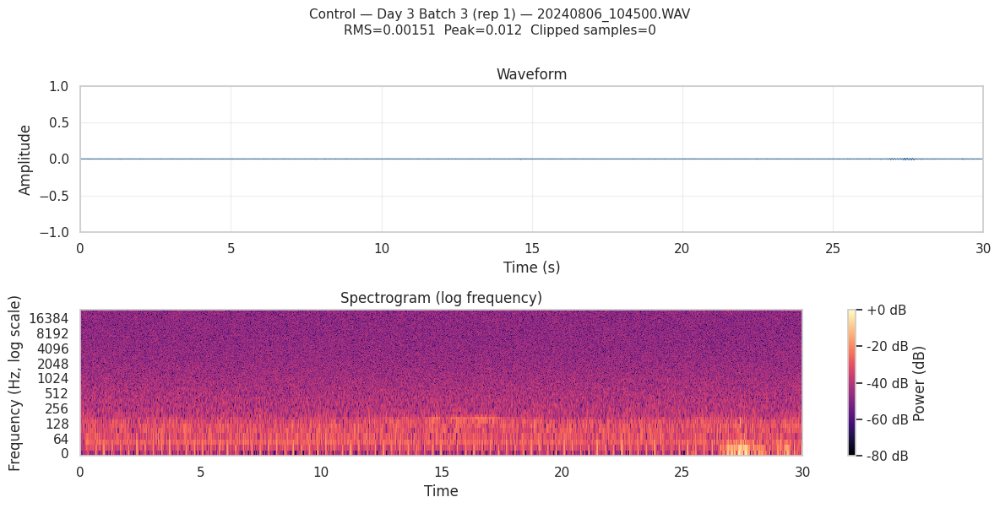

  Saved: 13_control_d3_b4_rep1.png and 13_control_d3_b4_rep1.pdf


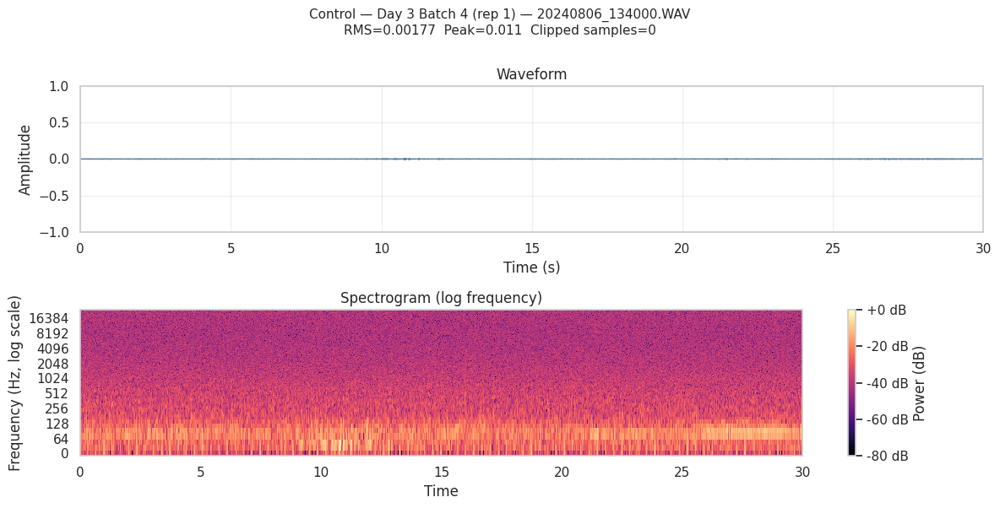

  Saved: 13_control_d4_b1_rep1.png and 13_control_d4_b1_rep1.pdf


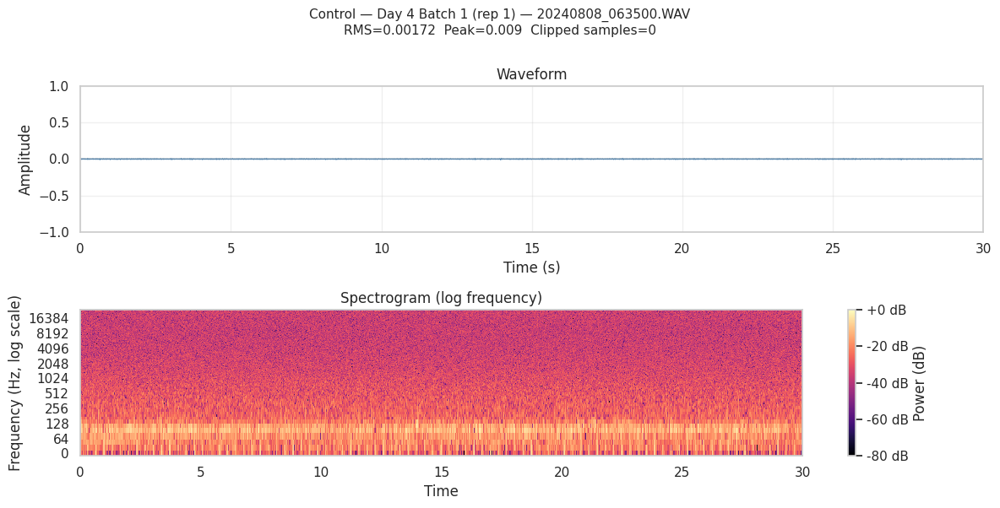

  Saved: 13_control_d5_b2_rep1.png and 13_control_d5_b2_rep1.pdf


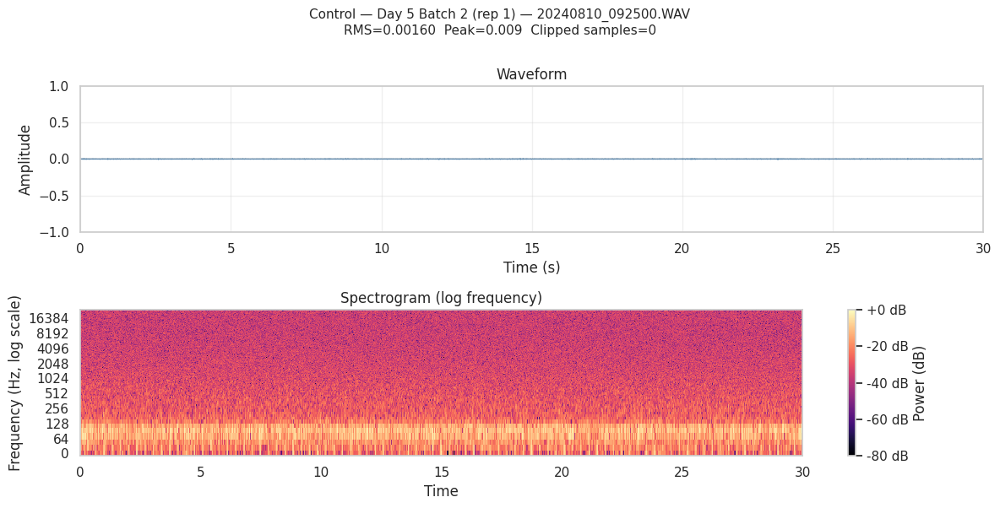

  Saved: 13_control_d6_b3_rep1.png and 13_control_d6_b3_rep1.pdf


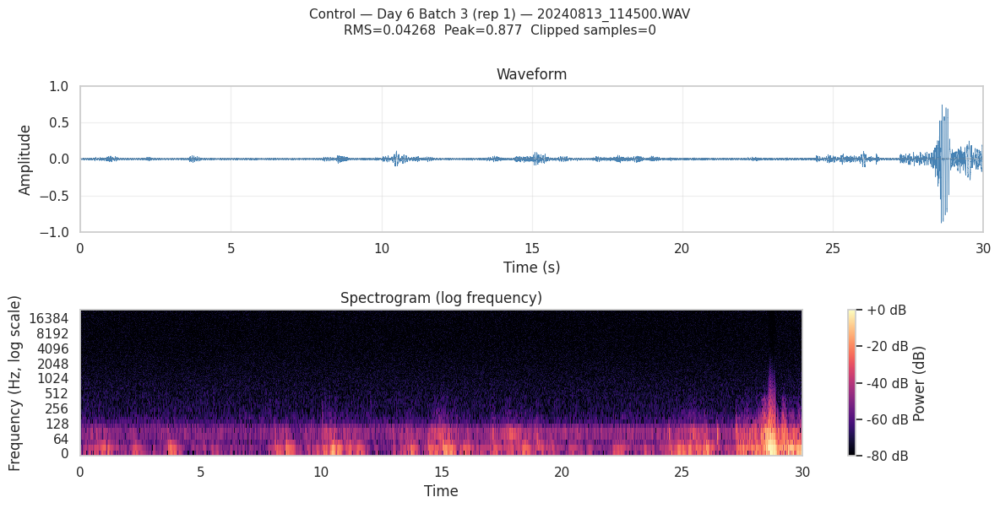

  Saved: 13_control_d6_b3_rep2.png and 13_control_d6_b3_rep2.pdf


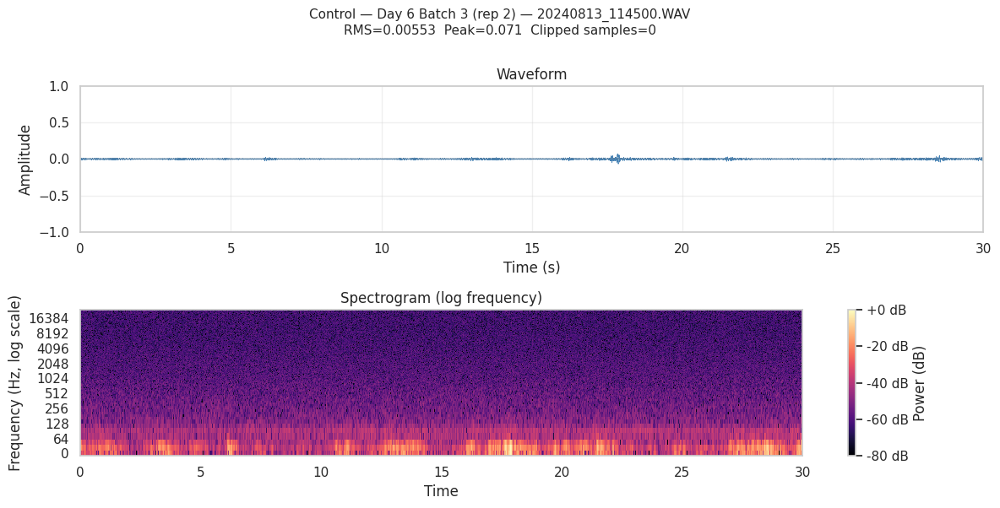


Generated 10 control inspection plots.


In [ ]:
# Identify all unique control sessions
session_keys = ['day', 'batch', 'taxon', 'count', 'replicate_id']
control_sessions = (inventory_final_df[inventory_final_df['taxon'] == 'control']
                    [session_keys]
                    .drop_duplicates()
                    .sort_values(['day', 'batch', 'replicate_id'])
                    .reset_index(drop=True))

print(f"Total control sessions in dataset: {len(control_sessions)}")
print()
print("Control sessions:")
print(control_sessions.to_string(index=False))
print()

# Pick one representative file per session (mid-position by timestamp)
np.random.seed(42)
control_samples = []

for _, sess in control_sessions.iterrows():
    sess_files = inventory_final_df[
        (inventory_final_df['day'] == sess['day']) &
        (inventory_final_df['batch'] == sess['batch']) &
        (inventory_final_df['taxon'] == 'control') &
        (inventory_final_df['replicate_id'] == sess['replicate_id']) &
        (~inventory_final_df['is_partial'])
    ].sort_values('timestamp').reset_index(drop=True)

    if len(sess_files) == 0:
        print(f"⚠️  No full-duration files in Day {sess['day']} Batch {sess['batch']} Control rep {sess['replicate_id']}")
        continue

    # Pick mid-session file
    mid_idx = len(sess_files) // 2
    control_samples.append(sess_files.iloc[mid_idx])

print(f"Selected {len(control_samples)} control samples (one per session)")
print()

# Load audio segments and compute stats
SEGMENT_DURATION_S = 30
control_audio = []

print("Loading 30-second mid-file segments...")
for row in control_samples:
    info = sf.info(row['filepath'])
    mid_point_s = info.duration / 2
    start_s = max(0, mid_point_s - SEGMENT_DURATION_S / 2)

    y, sr = librosa.load(row['filepath'], sr=None, mono=True,
                          offset=start_s, duration=SEGMENT_DURATION_S)

    rms = np.sqrt(np.mean(y**2))
    peak = np.max(np.abs(y))
    n_clipped = int(np.sum(np.abs(y) >= 0.99))

    control_audio.append({
        'metadata': row,
        'audio': y,
        'sr': sr,
        'start_s': start_s,
        'rms': rms,
        'peak': peak,
        'n_clipped': n_clipped,
    })

# Quantitative summary
print()
print("=" * 90)
print("Quantitative summary of selected control samples (30s mid-file segments)")
print("=" * 90)
summary_rows = []
for s in control_audio:
    m = s['metadata']
    summary_rows.append({
        'day': m['day'],
        'batch': m['batch'],
        'rep': m['replicate_id'],
        'filename': m['filename'],
        'rms': round(s['rms'], 5),
        'peak': round(s['peak'], 4),
        'n_clipped': s['n_clipped'],
    })
summary_df = pd.DataFrame(summary_rows)
print(summary_df.to_string(index=False))
print()

# Generate plots
print("Generating control inspection plots...")
print()

for i, s in enumerate(control_audio, start=1):
    m = s['metadata']
    y = s['audio']
    sr = s['sr']

    # STFT for spectrogram
    D = librosa.stft(y, n_fft=2048, hop_length=512, window='hann')
    S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

    fig, axes = plt.subplots(2, 1, figsize=(12, 6))

    title_str = (f"Control — Day {m['day']} Batch {m['batch']} (rep {m['replicate_id']}) — "
                 f"{m['filename']}\n"
                 f"RMS={s['rms']:.5f}  Peak={s['peak']:.3f}  Clipped samples={s['n_clipped']}")

    # Waveform
    times = np.arange(len(y)) / sr
    axes[0].plot(times, y, linewidth=0.4, color='steelblue')
    axes[0].set_xlabel('Time (s)')
    axes[0].set_ylabel('Amplitude')
    axes[0].set_title('Waveform')
    axes[0].set_xlim(0, len(y) / sr)
    axes[0].set_ylim(-1, 1)
    axes[0].axhline(0, color='gray', linewidth=0.3)
    axes[0].grid(True, alpha=0.3)

    # Log-frequency spectrogram
    img = librosa.display.specshow(
        S_db, sr=sr, hop_length=512,
        x_axis='time', y_axis='log',
        ax=axes[1], vmin=-80, vmax=0, cmap='magma'
    )
    axes[1].set_title('Spectrogram (log frequency)')
    axes[1].set_ylabel('Frequency (Hz, log scale)')
    fig.colorbar(img, ax=axes[1], format='%+2.0f dB', label='Power (dB)')

    fig.suptitle(title_str, fontsize=11, y=1.00)
    plt.tight_layout()
    save_name = f"13_control_d{m['day']}_b{m['batch']}_rep{m['replicate_id']}"
    save_figure(fig, save_name)
    plt.show()
    plt.close(fig)

print()
print("=" * 70)
print(f"Generated {len(control_audio)} control inspection plots.")
print("=" * 70)

## Block 14: Preprocessing Pipeline — Build and Validate

**Purpose:** Implement the audio-to-features pipeline that will be used for all model training and evaluation. Validate the pipeline on a small sample before applying to the full dataset.

**Pipeline architecture (each step justified):**

1. **Load audio** — read .wav file at native 48 kHz sample rate. No resampling (verified uniform in Block 7).
2. **Bandpass filter** — Butterworth 4th-order, 200 Hz to 12 kHz, applied forward-and-backward (zero-phase). Removes chamber resonance and noise floor identified in Block 11 PSD analysis.
3. **Chunk into windows** — 5-second windows with configurable overlap. 50% overlap for training data, 0% for evaluation.
4. **Per-window clipping flag** — count clipped samples within the window, flag if any present.
5. **Compute mel-spectrogram** — n_fft=2048, hop=512, n_mels=128, fmin=200, fmax=12000. Mel scale is standard for bioacoustic ML; parameters chosen for time-frequency resolution appropriate to invertebrate signals.
6. **Convert to log-power dB** — librosa.power_to_db with reference to maximum. Compresses dynamic range so models don't need to learn it.
7. **Per-window normalization** — subtract mean, divide by std (z-score). Standard for CNN input.

**Parameter justifications:**

| Parameter | Value | Justification |
|---|---|---|
| Sample rate | 48000 Hz | Native AudioMoth setting; verified uniform (Block 7) |
| Bandpass low | 200 Hz | Below this, chamber resonance dominates (Block 11 PSD) |
| Bandpass high | 12000 Hz | Above this, AudioMoth noise floor dominates (Block 11 PSD) |
| Filter order | 4 | Standard Butterworth order: sharp transition without excessive ringing |
| Window length | 5.0 s | Standard bioacoustic ML choice (Kahl et al. 2021 BirdNET uses 3s; we use 5s for sparse event capture) |
| Training overlap | 50% | Standard for training set augmentation; doubles training samples |
| Evaluation overlap | 0% | Independent samples for honest evaluation metrics |
| n_fft | 2048 | ~43 ms window at 48 kHz; balances time and frequency resolution |
| hop_length | 512 | 75% overlap between FFT frames; ~11 ms hop |
| n_mels | 128 | Standard for CNN bioacoustic input; sufficient frequency resolution |
| fmin (mel) | 200 Hz | Matches bandpass low |
| fmax (mel) | 12000 Hz | Matches bandpass high |

**Validation approach:**
1. Apply pipeline to 6 sample files (2 beetle larvae, 2 ants, 2 termites, 1 control — 7 total)
2. Visualize the mel-spectrograms produced
3. Sanity-check: do beetle larvae spectrograms show the events we know exist? Are the spectrograms in the expected dB range?
4. Time the pipeline on a single file to estimate full-dataset runtime

**Note:** This block does NOT yet apply preprocessing to the full dataset. That happens in Block 15. Here we validate the pipeline works correctly first.

Pipeline validation — running on representative sample files
Validation set: 7 files
  Ants            n=30  20240813_134000.WAV
  Ants            n=30  20240801_062000.WAV
  Beetle larvae   n=1   20240810_064500.WAV
  Beetle larvae   n=1   20240810_074000.WAV
  Termites        n=10  20240730_114500.WAV
  Termites        n=30  20240730_113500.WAV
  Control         n=0   20240730_135000.WAV

Timing single-file preprocessing...
  Time per file (50% overlap): 6.09 s
  Windows produced from one ~295s file: 117
  Spectrogram shape per window: (128, 469)
  Estimated full-dataset time (1801 files): 182.9 minutes

Processing all validation files...
Processed 7 files.

Generating validation spectrograms...
  Saved: 14_pipeline_validation_spectrograms.png and 14_pipeline_validation_spectrograms.pdf


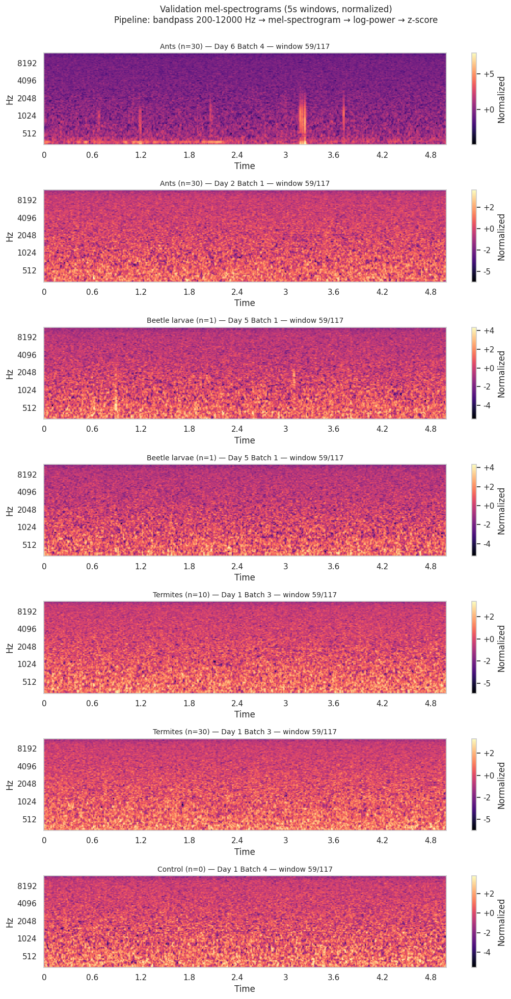


PIPELINE VALIDATION SUMMARY
All validation files processed without errors.
Output: 5.0s windows, mel-spec shape (128, ~469) per window.
Single-file processing time: 6.09s
Estimated full dataset time at 50% overlap: 182.9 minutes

Sanity checks:
  ✓ Spectrogram shapes uniform: {(128, 469)}
  ✓ Clipped windows: 0/819 (0.0%)
  ✓ Per-window means after normalization (should be ~0): min=-0.000, max=0.000


In [ ]:
from scipy.signal import butter, sosfiltfilt
import time

# =============================================================================
# Pipeline parameters (locked in based on Phase 2 analysis)
# =============================================================================
SAMPLE_RATE = 48000          # Native AudioMoth rate; uniform across dataset
BANDPASS_LOW_HZ = 200        # From Block 11 PSD analysis
BANDPASS_HIGH_HZ = 12000     # From Block 11 PSD analysis
FILTER_ORDER = 4             # Butterworth standard

WINDOW_LENGTH_S = 5.0        # 5-second analysis windows
WINDOW_LENGTH_SAMPLES = int(WINDOW_LENGTH_S * SAMPLE_RATE)

N_FFT = 2048                 # ~43 ms FFT window
HOP_LENGTH = 512             # ~11 ms hop
N_MELS = 128                 # Mel bins
FMIN_MEL = 200               # Matches bandpass low
FMAX_MEL = 12000             # Matches bandpass high

CLIPPING_THRESHOLD = 0.99

# Pre-compute the bandpass filter (reused for every file)
def make_bandpass_filter(low_hz, high_hz, sr, order):
    """Design a Butterworth bandpass filter as second-order sections."""
    nyquist = sr / 2
    sos = butter(order, [low_hz / nyquist, high_hz / nyquist],
                 btype='bandpass', output='sos')
    return sos

BANDPASS_SOS = make_bandpass_filter(BANDPASS_LOW_HZ, BANDPASS_HIGH_HZ,
                                      SAMPLE_RATE, FILTER_ORDER)

# =============================================================================
# Pipeline functions
# =============================================================================
def load_audio(filepath):
    """Load mono audio at native sample rate."""
    y, sr = librosa.load(filepath, sr=None, mono=True)
    if sr != SAMPLE_RATE:
        raise ValueError(f"Expected sample rate {SAMPLE_RATE}, got {sr}")
    return y

def bandpass_filter(y):
    """Apply zero-phase Butterworth bandpass filter."""
    return sosfiltfilt(BANDPASS_SOS, y)

def chunk_windows(y, window_samples, hop_samples):
    """Split audio into fixed-length windows.

    Returns a list of (window_audio, start_sample) tuples.
    Partial trailing windows (shorter than window_samples) are dropped.
    """
    windows = []
    n = len(y)
    start = 0
    while start + window_samples <= n:
        windows.append((y[start:start + window_samples], start))
        start += hop_samples
    return windows

def detect_clipping(window_audio):
    """Return (has_clipping, n_clipped_samples) for a window."""
    n_clipped = int(np.sum(np.abs(window_audio) >= CLIPPING_THRESHOLD))
    return (n_clipped > 0, n_clipped)

def compute_mel_spectrogram(window_audio):
    """Compute log-power mel-spectrogram from a window.

    Returns mel-spectrogram in dB, shape (n_mels, n_frames).
    """
    mel = librosa.feature.melspectrogram(
        y=window_audio, sr=SAMPLE_RATE,
        n_fft=N_FFT, hop_length=HOP_LENGTH,
        n_mels=N_MELS, fmin=FMIN_MEL, fmax=FMAX_MEL,
        power=2.0,
    )
    mel_db = librosa.power_to_db(mel, ref=np.max)
    return mel_db

def normalize_spectrogram(mel_db):
    """Z-score normalize: subtract mean, divide by std."""
    mean = mel_db.mean()
    std = mel_db.std()
    if std < 1e-8:  # Avoid division by zero on silent windows
        return mel_db - mean
    return (mel_db - mean) / std

def preprocess_file(filepath, overlap_fraction=0.5):
    """Full pipeline: file → list of (features, metadata) per window.

    Returns list of dicts, each containing:
      - 'features': normalized mel-spectrogram (n_mels, n_frames)
      - 'start_sample': start sample within the original file
      - 'start_s': start time in seconds
      - 'has_clipping': bool
      - 'n_clipped_samples': int
    """
    y = load_audio(filepath)
    y_filtered = bandpass_filter(y)

    hop_samples = int(WINDOW_LENGTH_SAMPLES * (1 - overlap_fraction))
    if hop_samples == 0:
        hop_samples = WINDOW_LENGTH_SAMPLES  # 100% non-overlapping fallback

    windows = chunk_windows(y_filtered, WINDOW_LENGTH_SAMPLES, hop_samples)

    results = []
    for window_audio, start_sample in windows:
        has_clip, n_clip = detect_clipping(window_audio)
        mel_db = compute_mel_spectrogram(window_audio)
        mel_normalized = normalize_spectrogram(mel_db)
        results.append({
            'features': mel_normalized,
            'start_sample': start_sample,
            'start_s': start_sample / SAMPLE_RATE,
            'has_clipping': has_clip,
            'n_clipped_samples': n_clip,
        })

    return results

# =============================================================================
# Validation: run pipeline on a small sample
# =============================================================================
print("=" * 70)
print("Pipeline validation — running on representative sample files")
print("=" * 70)

# Pick 1-2 representative full-duration files per taxon
np.random.seed(42)
validation_files = []

for taxon in ['ants', 'beetle_larvae', 'termites', 'control']:
    n_pick = 1 if taxon == 'control' else 2
    candidates = inventory_final_df[
        (inventory_final_df['taxon'] == taxon) &
        (~inventory_final_df['is_partial']) &
        (~inventory_final_df['has_clipping'])
    ]
    picked = candidates.sample(n=n_pick, random_state=42)
    validation_files.extend(picked.to_dict('records'))

print(f"Validation set: {len(validation_files)} files")
for f in validation_files:
    print(f"  {TAXON_LABELS[f['taxon']]:<15} n={f['count']:<2}  {f['filename']}")
print()

# Time the pipeline on one file
print("Timing single-file preprocessing...")
test_file = validation_files[0]
t0 = time.time()
test_result = preprocess_file(test_file['filepath'], overlap_fraction=0.5)
t1 = time.time()
single_file_time_s = t1 - t0
print(f"  Time per file (50% overlap): {single_file_time_s:.2f} s")
print(f"  Windows produced from one ~295s file: {len(test_result)}")
print(f"  Spectrogram shape per window: {test_result[0]['features'].shape}")
print(f"  Estimated full-dataset time (1801 files): {1801 * single_file_time_s / 60:.1f} minutes")
print()

# Process all validation files
print("Processing all validation files...")
validation_results = []
for f in validation_files:
    windows = preprocess_file(f['filepath'], overlap_fraction=0.5)
    validation_results.append({
        'metadata': f,
        'windows': windows,
    })
print(f"Processed {len(validation_results)} files.")
print()

# =============================================================================
# Visualize: one mel-spectrogram per validation file (middle window of each)
# =============================================================================
print("Generating validation spectrograms...")
fig, axes = plt.subplots(len(validation_results), 1,
                          figsize=(11, 2.8 * len(validation_results)))
if len(validation_results) == 1:
    axes = [axes]

for ax, vr in zip(axes, validation_results):
    m = vr['metadata']
    n_windows = len(vr['windows'])
    mid_idx = n_windows // 2
    mel_db = vr['windows'][mid_idx]['features']

    img = librosa.display.specshow(
        mel_db, sr=SAMPLE_RATE, hop_length=HOP_LENGTH,
        x_axis='time', y_axis='mel', fmin=FMIN_MEL, fmax=FMAX_MEL,
        ax=ax, cmap='magma'
    )
    title = (f"{TAXON_LABELS[m['taxon']]} (n={m['count']}) — "
             f"Day {m['day']} Batch {m['batch']} — window {mid_idx + 1}/{n_windows}")
    ax.set_title(title, fontsize=10)
    fig.colorbar(img, ax=ax, format='%+2.0f', label='Normalized')

fig.suptitle('Validation mel-spectrograms (5s windows, normalized)\n'
             'Pipeline: bandpass 200-12000 Hz → mel-spectrogram → log-power → z-score',
             fontsize=12, y=1.00)
plt.tight_layout()
save_figure(fig, '14_pipeline_validation_spectrograms')
plt.show()
plt.close(fig)

print()
print("=" * 70)
print("PIPELINE VALIDATION SUMMARY")
print("=" * 70)
print(f"All validation files processed without errors.")
print(f"Output: {WINDOW_LENGTH_S}s windows, mel-spec shape ({N_MELS}, "
      f"~{int(WINDOW_LENGTH_S * SAMPLE_RATE / HOP_LENGTH) + 1}) per window.")
print(f"Single-file processing time: {single_file_time_s:.2f}s")
print(f"Estimated full dataset time at 50% overlap: "
      f"{1801 * single_file_time_s / 60:.1f} minutes")
print()
print("Sanity checks:")
all_shapes = set(w['features'].shape for vr in validation_results for w in vr['windows'])
print(f"  ✓ Spectrogram shapes uniform: {all_shapes}")
n_clip_windows = sum(1 for vr in validation_results for w in vr['windows'] if w['has_clipping'])
total_windows = sum(len(vr['windows']) for vr in validation_results)
print(f"  ✓ Clipped windows: {n_clip_windows}/{total_windows} "
      f"({100*n_clip_windows/total_windows:.1f}%)")
mean_range = [vr['windows'][0]['features'].mean() for vr in validation_results]
print(f"  ✓ Per-window means after normalization (should be ~0): "
      f"min={min(mean_range):.3f}, max={max(mean_range):.3f}")

## Block 14b: Pipeline Revision — Global Normalization and Reduced Time Resolution

**Purpose:** Apply two refinements to the preprocessing pipeline based on Block 14 findings, then re-validate on the same 7 files to confirm improvements.

**Changes:**

1. **Global normalization instead of per-window z-score.**
   - First, sample 10% of inventory files (stratified by taxon) and compute mel-spectrogram statistics across all windows from that sample.
   - Store global `(mean, std)` as preprocessing constants.
   - Apply the same normalization to every window in the dataset.
   - This preserves relative amplitude information (silent windows stay visibly silent).

2. **Hop_length increased from 512 to 1024.**
   - Time frames per 5s window: 469 → ~235.
   - Halves storage and compute per spectrogram.
   - Time resolution: ~21 ms per frame (still well-resolved for invertebrate events).

**Validation:**
- Same 7 files as Block 14
- Same plot layout for direct comparison
- Expected difference: silent windows (controls, low-density ants/termites) should look visibly darker/quieter than event-containing windows (beetle larvae, dense ant bursts)

/tmp/ipykernel_501/1036180238.py:24: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda g: g.sample(frac=GLOBAL_STATS_SAMPLE_FRACTION, random_state=42))


Updated parameters:
  HOP_LENGTH: 1024 (was 512)
  Expected time frames per 5s window: ~235

Step 1: Compute global normalization statistics
Stats sample size: 179 files (10% of full-duration files, stratified by taxon)
  By taxon:
taxon
ants             52
beetle_larvae    52
termites         49
control          26

Processing sample to compute global statistics...


Stats sample: 100%|██████████| 179/179 [08:45<00:00,  2.93s/it]



Global statistics (computed on stratified 10% sample):
  Total values sampled: 629,965,440
  Global mean (dB): -20.6764
  Global std (dB):  8.9152

Step 3: Re-validating pipeline on the same 7 files
Re-validation set: 7 files

Timing comparison:
  Block 14 (hop=512, per-window norm): ~6.09 s per file
  Block 14b (hop=1024, global norm):   2.02 s per file
  Windows per file: 117
  New spectrogram shape: (128, 235)
  Estimated full-dataset time: 60.5 minutes

Processing all validation files with new pipeline...
Processed 7 files.

Generating revised validation spectrograms...
Shared color range (1st-99th percentile across all validation windows): vmin=-2.60, vmax=1.67

  Saved: 14b_pipeline_v2_validation_spectrograms.png and 14b_pipeline_v2_validation_spectrograms.pdf


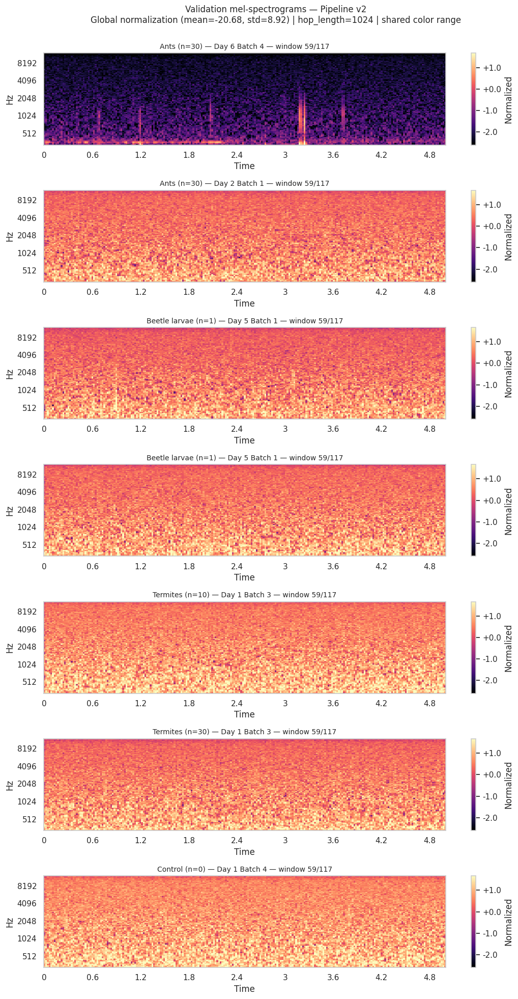


PIPELINE V2 VALIDATION SUMMARY
  Spectrogram shape: (128, 235)
  Storage per window: 235.00 KB (float64)
  Single-file processing time: 2.02s
  Estimated full-dataset time: 60.5 minutes

Per-class value distributions (should differ — silent classes lower values):
  Ants n=30               mean=-1.968  std=0.542  min=-4.65  max=+2.32
  Ants n=30               mean=+0.459  std=0.412  min=-2.09  max=+2.32
  Beetle larvae n=1       mean=+0.415  std=0.438  min=-1.97  max=+2.32
  Beetle larvae n=1       mean=+0.529  std=0.430  min=-1.75  max=+2.32
  Termites n=10           mean=+0.672  std=0.427  min=-1.33  max=+2.32
  Termites n=30           mean=+0.533  std=0.433  min=-1.40  max=+2.32
  Control n=0             mean=+0.758  std=0.412  min=-1.11  max=+2.32


In [ ]:
# =============================================================================
# Updated pipeline parameters
# =============================================================================
HOP_LENGTH = 1024  # changed from 512

print(f"Updated parameters:")
print(f"  HOP_LENGTH: {HOP_LENGTH} (was 512)")
print(f"  Expected time frames per 5s window: ~{int(WINDOW_LENGTH_SAMPLES / HOP_LENGTH) + 1}")
print()

# =============================================================================
# Step 1: Compute global mel-spectrogram statistics on stratified sample
# =============================================================================
print("=" * 70)
print("Step 1: Compute global normalization statistics")
print("=" * 70)

GLOBAL_STATS_SAMPLE_FRACTION = 0.10  # 10% of files for statistics estimation

np.random.seed(42)
stats_sample = (
    inventory_final_df[~inventory_final_df['is_partial']]
    .groupby('taxon', group_keys=False)
    .apply(lambda g: g.sample(frac=GLOBAL_STATS_SAMPLE_FRACTION, random_state=42))
    .reset_index(drop=True)
)
print(f"Stats sample size: {len(stats_sample)} files "
      f"({GLOBAL_STATS_SAMPLE_FRACTION*100:.0f}% of full-duration files, stratified by taxon)")
print(f"  By taxon:")
print(stats_sample['taxon'].value_counts().to_string())
print()

# Process sample to collect mel-spectrogram values
# We use running sum / sum-of-squares to compute mean/std without holding all data in RAM
print("Processing sample to compute global statistics...")
running_sum = 0.0
running_sum_sq = 0.0
running_n = 0

def mel_spectrogram_db_only(window_audio):
    """Compute log-power mel-spectrogram WITHOUT normalization."""
    mel = librosa.feature.melspectrogram(
        y=window_audio, sr=SAMPLE_RATE,
        n_fft=N_FFT, hop_length=HOP_LENGTH,
        n_mels=N_MELS, fmin=FMIN_MEL, fmax=FMAX_MEL,
        power=2.0,
    )
    return librosa.power_to_db(mel, ref=np.max)

for i, row in tqdm(stats_sample.iterrows(), total=len(stats_sample),
                    desc="Stats sample"):
    try:
        y = load_audio(row['filepath'])
        y_filtered = bandpass_filter(y)

        hop_samples = int(WINDOW_LENGTH_SAMPLES * 0.5)  # 50% overlap matches training
        windows = chunk_windows(y_filtered, WINDOW_LENGTH_SAMPLES, hop_samples)

        for window_audio, _ in windows:
            mel_db = mel_spectrogram_db_only(window_audio)
            running_sum += mel_db.sum()
            running_sum_sq += (mel_db ** 2).sum()
            running_n += mel_db.size
    except Exception as e:
        print(f"Error on {row['filepath']}: {e}")
        continue

GLOBAL_MEAN = running_sum / running_n
GLOBAL_VARIANCE = (running_sum_sq / running_n) - GLOBAL_MEAN ** 2
GLOBAL_STD = np.sqrt(GLOBAL_VARIANCE)

print()
print("Global statistics (computed on stratified 10% sample):")
print(f"  Total values sampled: {running_n:,}")
print(f"  Global mean (dB): {GLOBAL_MEAN:.4f}")
print(f"  Global std (dB):  {GLOBAL_STD:.4f}")
print()

# =============================================================================
# Step 2: Updated preprocessing function with global normalization
# =============================================================================
def normalize_global(mel_db, mean=GLOBAL_MEAN, std=GLOBAL_STD):
    """Global z-score normalization using precomputed statistics."""
    return (mel_db - mean) / std

def preprocess_file_v2(filepath, overlap_fraction=0.5):
    """Updated pipeline with global normalization and new hop_length.

    Returns list of dicts, each containing:
      - 'features': globally-normalized mel-spectrogram (n_mels, n_frames)
      - 'start_sample': start sample within the original file
      - 'start_s': start time in seconds
      - 'has_clipping': bool
      - 'n_clipped_samples': int
    """
    y = load_audio(filepath)
    y_filtered = bandpass_filter(y)

    hop_samples = int(WINDOW_LENGTH_SAMPLES * (1 - overlap_fraction))
    if hop_samples == 0:
        hop_samples = WINDOW_LENGTH_SAMPLES

    windows = chunk_windows(y_filtered, WINDOW_LENGTH_SAMPLES, hop_samples)

    results = []
    for window_audio, start_sample in windows:
        has_clip, n_clip = detect_clipping(window_audio)
        mel_db = mel_spectrogram_db_only(window_audio)
        mel_normalized = normalize_global(mel_db)
        results.append({
            'features': mel_normalized,
            'start_sample': start_sample,
            'start_s': start_sample / SAMPLE_RATE,
            'has_clipping': has_clip,
            'n_clipped_samples': n_clip,
        })

    return results

# =============================================================================
# Step 3: Re-validate on the same 7 files
# =============================================================================
print("=" * 70)
print("Step 3: Re-validating pipeline on the same 7 files")
print("=" * 70)

# Reuse the same validation files from Block 14
print(f"Re-validation set: {len(validation_files)} files")
print()

# Time single-file preprocessing
test_file = validation_files[0]
t0 = time.time()
test_result = preprocess_file_v2(test_file['filepath'], overlap_fraction=0.5)
t1 = time.time()
single_file_time_s = t1 - t0

print(f"Timing comparison:")
print(f"  Block 14 (hop=512, per-window norm): ~6.09 s per file")
print(f"  Block 14b (hop=1024, global norm):   {single_file_time_s:.2f} s per file")
print(f"  Windows per file: {len(test_result)}")
print(f"  New spectrogram shape: {test_result[0]['features'].shape}")
print(f"  Estimated full-dataset time: {1801 * single_file_time_s / 60:.1f} minutes")
print()

# Process all validation files
print("Processing all validation files with new pipeline...")
validation_results_v2 = []
for f in validation_files:
    windows = preprocess_file_v2(f['filepath'], overlap_fraction=0.5)
    validation_results_v2.append({
        'metadata': f,
        'windows': windows,
    })
print(f"Processed {len(validation_results_v2)} files.")
print()

# =============================================================================
# Step 4: Visualize comparison
# =============================================================================
print("Generating revised validation spectrograms...")
fig, axes = plt.subplots(len(validation_results_v2), 1,
                          figsize=(11, 2.8 * len(validation_results_v2)))
if len(validation_results_v2) == 1:
    axes = [axes]

# Use a shared color range across all panels to make comparison meaningful
# Find the actual min/max across all validation spectrograms
all_features = np.concatenate([
    vr['windows'][len(vr['windows']) // 2]['features'].flatten()
    for vr in validation_results_v2
])
vmin, vmax = np.percentile(all_features, [1, 99])
print(f"Shared color range (1st-99th percentile across all validation windows): "
      f"vmin={vmin:.2f}, vmax={vmax:.2f}")
print()

for ax, vr in zip(axes, validation_results_v2):
    m = vr['metadata']
    n_windows = len(vr['windows'])
    mid_idx = n_windows // 2
    mel_db = vr['windows'][mid_idx]['features']

    img = librosa.display.specshow(
        mel_db, sr=SAMPLE_RATE, hop_length=HOP_LENGTH,
        x_axis='time', y_axis='mel', fmin=FMIN_MEL, fmax=FMAX_MEL,
        ax=ax, cmap='magma', vmin=vmin, vmax=vmax,
    )
    title = (f"{TAXON_LABELS[m['taxon']]} (n={m['count']}) — "
             f"Day {m['day']} Batch {m['batch']} — window {mid_idx + 1}/{n_windows}")
    ax.set_title(title, fontsize=10)
    fig.colorbar(img, ax=ax, format='%+2.1f', label='Normalized')

fig.suptitle(f'Validation mel-spectrograms — Pipeline v2\n'
             f'Global normalization (mean={GLOBAL_MEAN:.2f}, std={GLOBAL_STD:.2f}) | '
             f'hop_length={HOP_LENGTH} | shared color range',
             fontsize=12, y=1.00)
plt.tight_layout()
save_figure(fig, '14b_pipeline_v2_validation_spectrograms')
plt.show()
plt.close(fig)

# =============================================================================
# Summary
# =============================================================================
print()
print("=" * 70)
print("PIPELINE V2 VALIDATION SUMMARY")
print("=" * 70)
print(f"  Spectrogram shape: {test_result[0]['features'].shape}")
print(f"  Storage per window: {test_result[0]['features'].nbytes / 1024:.2f} KB (float64)")
print(f"  Single-file processing time: {single_file_time_s:.2f}s")
print(f"  Estimated full-dataset time: {1801 * single_file_time_s / 60:.1f} minutes")

# Check value distribution per-class to confirm global norm preserves amplitude info
print()
print("Per-class value distributions (should differ — silent classes lower values):")
for vr in validation_results_v2:
    m = vr['metadata']
    mid_feat = vr['windows'][len(vr['windows']) // 2]['features']
    label = f"{TAXON_LABELS[m['taxon']]} n={m['count']}"
    print(f"  {label:<22}  mean={mid_feat.mean():+.3f}  std={mid_feat.std():.3f}  "
          f"min={mid_feat.min():+.2f}  max={mid_feat.max():+.2f}")

## Block 14c: Pipeline Revision v3 — Absolute dB Reference

**Purpose:** Replace per-window peak reference (`ref=np.max`) with absolute reference (`ref=1.0`) so that global normalization meaningfully compares loudness across windows. Recompute global statistics with the new dB scale and re-validate.

**Change:**
- `librosa.power_to_db(mel, ref=np.max)` → `librosa.power_to_db(mel, ref=1.0)`

**Expected outcomes:**
- Global mean (dB) will be considerably lower than -20.68 (probably -80 to -120 range) because absolute mel-power values are small
- Global std (dB) will be larger because the absolute scale spans a wider range
- Per-class value distributions after normalization should better reflect true acoustic loudness: beetle larvae > ants ≈ termites > control, with sparse-event windows visibly quieter

**Validation criteria for proceeding to Block 15:**
- Per-class mean values should not all converge to similar numbers (would indicate normalization is still washing out signal)
- The Ants n=30 window with visible bursts (panel 1) should now have similar or higher mean than the Ants n=30 window without bursts (panel 2), not lower
- Spectrograms should show visible differences between event-rich and event-sparse windows

**If validation fails:** We pause and revisit fundamentals rather than iterating again.

Step 1: Recompute global statistics with absolute dB reference
Using same 10% stratified sample: 179 files

Recomputing global statistics with ref=1.0...


Stats sample v3: 100%|██████████| 179/179 [06:51<00:00,  2.30s/it]



Comparison of global statistics:
  v2 (ref=np.max):  mean=-20.6764 dB, std=8.9152 dB
  v3 (ref=1.0):     mean=-41.3738 dB, std=4.5084 dB

v3 raw dB value range across sample windows:
  Minimum: -80.78 dB
  Maximum: +25.46 dB

Step 3: Re-validating pipeline v3 on the same 7 files
Timing:
  v3 single-file: 1.90 s
  Estimated full-dataset: 57.0 minutes

Processing validation files...
Processed 7 files.

Generating v3 validation spectrograms...
Shared color range (1st-99th percentile): vmin=-1.91, vmax=2.34

  Saved: 14c_pipeline_v3_validation_spectrograms.png and 14c_pipeline_v3_validation_spectrograms.pdf


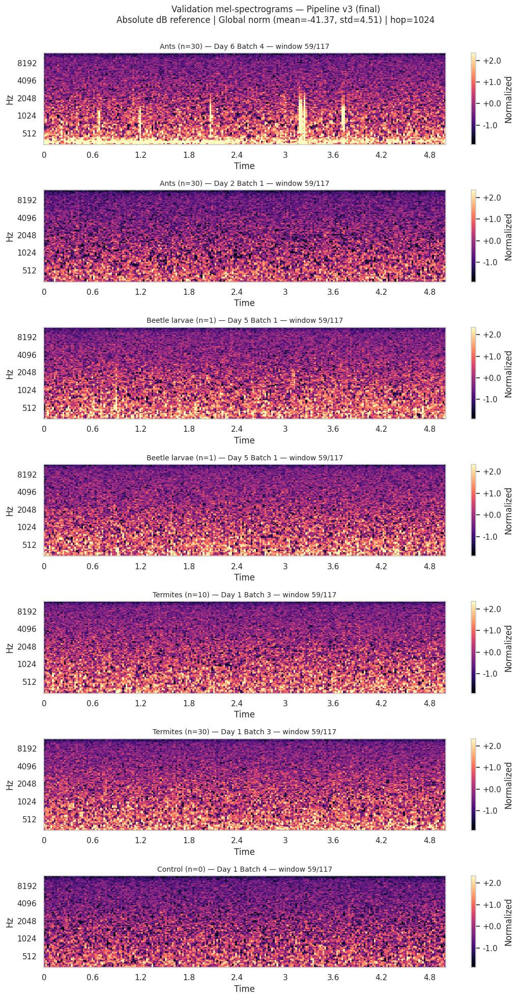


PIPELINE V3 — Per-class value distributions (mid-window from each validation file)
Class                      mean      std      min      max  ← max should NOT be constant
----------------------------------------------------------------------
  Ants n=30              +0.103    1.071    -5.20    +8.58
  Ants n=30              -0.276    0.815    -5.32    +3.40
  Beetle larvae n=1      +0.040    0.866    -4.68    +3.81
  Beetle larvae n=1      +0.013    0.850    -4.49    +3.55
  Termites n=10          +0.008    0.845    -3.95    +3.26
  Termites n=30          +0.035    0.856    -3.79    +3.57
  Control n=0            -0.277    0.814    -3.97    +2.81

Validation pass criteria:
  1. Max values should NOT all be identical (would indicate ref=np.max artifact)
  2. Class means should reflect acoustic loudness (e.g., active windows > quiet windows)
  3. Spectrograms should show visible differences between event-rich and event-sparse windows

FINAL PIPELINE PARAMETERS (v3) — saving to Drive
Sa

In [ ]:
# =============================================================================
# Updated mel-spectrogram function with absolute dB reference
# =============================================================================
def mel_spectrogram_db_abs(window_audio):
    """Compute log-power mel-spectrogram with ABSOLUTE dB reference (no per-window scaling)."""
    mel = librosa.feature.melspectrogram(
        y=window_audio, sr=SAMPLE_RATE,
        n_fft=N_FFT, hop_length=HOP_LENGTH,
        n_mels=N_MELS, fmin=FMIN_MEL, fmax=FMAX_MEL,
        power=2.0,
    )
    # Use ref=1.0 instead of ref=np.max
    # Add small epsilon to avoid log(0) on perfectly silent windows
    return librosa.power_to_db(mel + 1e-10, ref=1.0)

# =============================================================================
# Step 1: Recompute global statistics with new dB reference
# =============================================================================
print("=" * 70)
print("Step 1: Recompute global statistics with absolute dB reference")
print("=" * 70)

# Reuse the same stats_sample from Block 14b for direct comparability
print(f"Using same 10% stratified sample: {len(stats_sample)} files")
print()

running_sum_v3 = 0.0
running_sum_sq_v3 = 0.0
running_n_v3 = 0
mins, maxes = [], []  # track range to sanity-check

print("Recomputing global statistics with ref=1.0...")
for i, row in tqdm(stats_sample.iterrows(), total=len(stats_sample),
                    desc="Stats sample v3"):
    try:
        y = load_audio(row['filepath'])
        y_filtered = bandpass_filter(y)

        hop_samples = int(WINDOW_LENGTH_SAMPLES * 0.5)
        windows = chunk_windows(y_filtered, WINDOW_LENGTH_SAMPLES, hop_samples)

        for window_audio, _ in windows:
            mel_db = mel_spectrogram_db_abs(window_audio)
            running_sum_v3 += mel_db.sum()
            running_sum_sq_v3 += (mel_db ** 2).sum()
            running_n_v3 += mel_db.size
            mins.append(mel_db.min())
            maxes.append(mel_db.max())
    except Exception as e:
        print(f"Error on {row['filepath']}: {e}")
        continue

GLOBAL_MEAN_V3 = running_sum_v3 / running_n_v3
GLOBAL_VARIANCE_V3 = (running_sum_sq_v3 / running_n_v3) - GLOBAL_MEAN_V3 ** 2
GLOBAL_STD_V3 = np.sqrt(GLOBAL_VARIANCE_V3)

print()
print("Comparison of global statistics:")
print(f"  v2 (ref=np.max):  mean={GLOBAL_MEAN:+.4f} dB, std={GLOBAL_STD:.4f} dB")
print(f"  v3 (ref=1.0):     mean={GLOBAL_MEAN_V3:+.4f} dB, std={GLOBAL_STD_V3:.4f} dB")
print()
print(f"v3 raw dB value range across sample windows:")
print(f"  Minimum: {min(mins):+.2f} dB")
print(f"  Maximum: {max(maxes):+.2f} dB")
print()

# =============================================================================
# Step 2: Updated preprocessing function
# =============================================================================
def normalize_global_v3(mel_db):
    """Global z-score normalization with v3 statistics."""
    return (mel_db - GLOBAL_MEAN_V3) / GLOBAL_STD_V3

def preprocess_file_v3(filepath, overlap_fraction=0.5):
    """Final pipeline: absolute dB + global normalization."""
    y = load_audio(filepath)
    y_filtered = bandpass_filter(y)

    hop_samples = int(WINDOW_LENGTH_SAMPLES * (1 - overlap_fraction))
    if hop_samples == 0:
        hop_samples = WINDOW_LENGTH_SAMPLES

    windows = chunk_windows(y_filtered, WINDOW_LENGTH_SAMPLES, hop_samples)

    results = []
    for window_audio, start_sample in windows:
        has_clip, n_clip = detect_clipping(window_audio)
        mel_db = mel_spectrogram_db_abs(window_audio)
        mel_normalized = normalize_global_v3(mel_db)
        results.append({
            'features': mel_normalized,
            'start_sample': start_sample,
            'start_s': start_sample / SAMPLE_RATE,
            'has_clipping': has_clip,
            'n_clipped_samples': n_clip,
        })

    return results

# =============================================================================
# Step 3: Re-validate on the same 7 files
# =============================================================================
print("=" * 70)
print("Step 3: Re-validating pipeline v3 on the same 7 files")
print("=" * 70)

# Time single-file
test_file = validation_files[0]
t0 = time.time()
test_result = preprocess_file_v3(test_file['filepath'], overlap_fraction=0.5)
t1 = time.time()
single_file_time_s = t1 - t0

print(f"Timing:")
print(f"  v3 single-file: {single_file_time_s:.2f} s")
print(f"  Estimated full-dataset: {1801 * single_file_time_s / 60:.1f} minutes")
print()

# Process all validation files
print("Processing validation files...")
validation_results_v3 = []
for f in validation_files:
    windows = preprocess_file_v3(f['filepath'], overlap_fraction=0.5)
    validation_results_v3.append({
        'metadata': f,
        'windows': windows,
    })
print(f"Processed {len(validation_results_v3)} files.")
print()

# =============================================================================
# Step 4: Visualize and compare
# =============================================================================
print("Generating v3 validation spectrograms...")
fig, axes = plt.subplots(len(validation_results_v3), 1,
                          figsize=(11, 2.8 * len(validation_results_v3)))
if len(validation_results_v3) == 1:
    axes = [axes]

all_features = np.concatenate([
    vr['windows'][len(vr['windows']) // 2]['features'].flatten()
    for vr in validation_results_v3
])
vmin, vmax = np.percentile(all_features, [1, 99])
print(f"Shared color range (1st-99th percentile): vmin={vmin:.2f}, vmax={vmax:.2f}")
print()

for ax, vr in zip(axes, validation_results_v3):
    m = vr['metadata']
    n_windows = len(vr['windows'])
    mid_idx = n_windows // 2
    mel_db = vr['windows'][mid_idx]['features']

    img = librosa.display.specshow(
        mel_db, sr=SAMPLE_RATE, hop_length=HOP_LENGTH,
        x_axis='time', y_axis='mel', fmin=FMIN_MEL, fmax=FMAX_MEL,
        ax=ax, cmap='magma', vmin=vmin, vmax=vmax,
    )
    title = (f"{TAXON_LABELS[m['taxon']]} (n={m['count']}) — "
             f"Day {m['day']} Batch {m['batch']} — window {mid_idx + 1}/{n_windows}")
    ax.set_title(title, fontsize=10)
    fig.colorbar(img, ax=ax, format='%+2.1f', label='Normalized')

fig.suptitle(f'Validation mel-spectrograms — Pipeline v3 (final)\n'
             f'Absolute dB reference | Global norm (mean={GLOBAL_MEAN_V3:.2f}, '
             f'std={GLOBAL_STD_V3:.2f}) | hop=1024',
             fontsize=12, y=1.00)
plt.tight_layout()
save_figure(fig, '14c_pipeline_v3_validation_spectrograms')
plt.show()
plt.close(fig)

# =============================================================================
# Per-class value distribution table (the key validation check)
# =============================================================================
print()
print("=" * 90)
print("PIPELINE V3 — Per-class value distributions (mid-window from each validation file)")
print("=" * 90)
print(f"{'Class':<22} {'mean':>8} {'std':>8} {'min':>8} {'max':>8}  ← max should NOT be constant")
print("-" * 70)
for vr in validation_results_v3:
    m = vr['metadata']
    mid_feat = vr['windows'][len(vr['windows']) // 2]['features']
    label = f"{TAXON_LABELS[m['taxon']]} n={m['count']}"
    print(f"  {label:<20} {mid_feat.mean():>+8.3f} {mid_feat.std():>8.3f} "
          f"{mid_feat.min():>+8.2f} {mid_feat.max():>+8.2f}")

print()
print("Validation pass criteria:")
print("  1. Max values should NOT all be identical (would indicate ref=np.max artifact)")
print("  2. Class means should reflect acoustic loudness (e.g., active windows > quiet windows)")
print("  3. Spectrograms should show visible differences between event-rich and event-sparse windows")
print()

# =============================================================================
# Save the final pipeline parameters for reproducibility
# =============================================================================
print("=" * 70)
print("FINAL PIPELINE PARAMETERS (v3) — saving to Drive")
print("=" * 70)

pipeline_params = {
    'sample_rate': SAMPLE_RATE,
    'bandpass_low_hz': BANDPASS_LOW_HZ,
    'bandpass_high_hz': BANDPASS_HIGH_HZ,
    'filter_order': FILTER_ORDER,
    'window_length_s': WINDOW_LENGTH_S,
    'window_length_samples': WINDOW_LENGTH_SAMPLES,
    'training_overlap_fraction': 0.5,
    'evaluation_overlap_fraction': 0.0,
    'n_fft': N_FFT,
    'hop_length': HOP_LENGTH,
    'n_mels': N_MELS,
    'fmin_mel': FMIN_MEL,
    'fmax_mel': FMAX_MEL,
    'db_reference': 1.0,
    'global_mean': float(GLOBAL_MEAN_V3),
    'global_std': float(GLOBAL_STD_V3),
    'global_stats_sample_size': len(stats_sample),
    'global_stats_total_values': int(running_n_v3),
    'clipping_threshold': CLIPPING_THRESHOLD,
}

import json
params_path = PROJECT_ROOT / 'pipeline_params_v3.json'
with open(params_path, 'w') as f:
    json.dump(pipeline_params, f, indent=2)

print(f"Saved to: {params_path}")
print()
print("Pipeline parameters:")
for k, v in pipeline_params.items():
    if isinstance(v, float):
        print(f"  {k}: {v:.4f}")
    else:
        print(f"  {k}: {v}")

## Block 15: Full Dataset Preprocessing — Apply Pipeline to All Files

**Purpose:** Apply the validated v3 preprocessing pipeline to every file in the cleaned inventory and save the resulting mel-spectrogram features to Drive for use in modeling.

**Architecture:**
1. Create `features/` subdirectory in Drive for output storage
2. Load a manifest CSV tracking which files have been processed (empty on first run)
3. For each file in inventory:
   - Skip if already in manifest (resumption support)
   - Apply v3 pipeline with 50% training overlap
   - Save windows as a single .npz file: `{day}_{batch}_{taxon}_{count}_{replicate}_{filename}.npz`
   - Each .npz contains: features array, per-window clipping flags, per-window start times
   - Append entry to manifest after successful save
4. Progress bar shows real-time status

**Output structure per .npz file:**
- `features`: shape (n_windows, 128, 235), dtype float32
- `start_samples`: shape (n_windows,), int64 — start sample of each window in original file
- `has_clipping`: shape (n_windows,), bool — whether each window contained any clipped samples
- `n_clipped_samples`: shape (n_windows,), int32

**Resumption:** If the cell is interrupted (Colab disconnect, manual stop), simply re-run it. Already-processed files are skipped via manifest check.

**Storage estimate:** ~25 GB total at float32 precision across ~1,801 .npz files.

**Runtime estimate:** ~60 minutes for full dataset based on Block 14c timing.

In [ ]:
import json
from datetime import datetime

# =============================================================================
# Setup: paths and constants
# =============================================================================
FEATURES_DIR = PROJECT_ROOT / 'features'
FEATURES_DIR.mkdir(exist_ok=True)

MANIFEST_PATH = PROJECT_ROOT / 'features_manifest.csv'

# Load pipeline parameters from JSON (for traceability)
with open(PROJECT_ROOT / 'pipeline_params_v3.json') as f:
    saved_params = json.load(f)

print(f"Features directory: {FEATURES_DIR}")
print(f"Manifest path: {MANIFEST_PATH}")
print(f"Pipeline parameters loaded from JSON: {len(saved_params)} fields")
print()

# =============================================================================
# Helper: build output filename from metadata
# =============================================================================
def make_feature_filename(row):
    """Build a unique, descriptive .npz filename from inventory row metadata."""
    # Strip the .WAV extension and convert to consistent format
    base = row['filename'].replace('.WAV', '').replace('.wav', '')
    return (f"d{row['day']}_b{row['batch']}_"
            f"{row['taxon']}_n{row['count']}_rep{row['replicate_id']}_"
            f"{base}.npz")

# =============================================================================
# Load existing manifest for resumption
# =============================================================================
if MANIFEST_PATH.exists():
    manifest_df = pd.read_csv(MANIFEST_PATH)
    processed_filepaths = set(manifest_df['source_filepath'].tolist())
    print(f"Existing manifest found: {len(processed_filepaths)} files already processed")
    print(f"Resuming from previous run.")
else:
    manifest_df = pd.DataFrame(columns=[
        'source_filepath', 'feature_filename', 'n_windows',
        'n_clipped_windows', 'processed_at', 'taxon', 'count',
        'day', 'batch', 'replicate_id', 'is_partial'
    ])
    processed_filepaths = set()
    print(f"No existing manifest. Starting fresh.")

# Determine files still to process
files_to_process = inventory_final_df[
    ~inventory_final_df['filepath'].isin(processed_filepaths)
].reset_index(drop=True)

print()
print(f"Total files in inventory: {len(inventory_final_df)}")
print(f"Already processed: {len(processed_filepaths)}")
print(f"To process this run: {len(files_to_process)}")
print()

# =============================================================================
# Main processing loop
# =============================================================================
if len(files_to_process) == 0:
    print("All files already processed. Nothing to do.")
else:
    print(f"Starting preprocessing of {len(files_to_process)} files...")
    print(f"Estimated time: ~{len(files_to_process) * 2 / 60:.1f} minutes")
    print()

    # Process in append mode so manifest stays current even if interrupted
    new_manifest_rows = []
    failed_files = []
    save_every_n = 50  # Save manifest every N files to limit data loss on disconnect

    for i, row in tqdm(files_to_process.iterrows(),
                        total=len(files_to_process),
                        desc="Processing"):
        try:
            # Run pipeline
            windows = preprocess_file_v3(row['filepath'], overlap_fraction=0.5)

            if len(windows) == 0:
                # File was too short to produce even one window
                failed_files.append({
                    'filepath': row['filepath'],
                    'error': 'No windows produced (file too short)',
                })
                continue

            # Stack windows into arrays for efficient storage
            features = np.stack([w['features'].astype(np.float32)
                                  for w in windows])  # (n_windows, 128, 235)
            start_samples = np.array([w['start_sample'] for w in windows],
                                       dtype=np.int64)
            has_clipping = np.array([w['has_clipping'] for w in windows],
                                      dtype=bool)
            n_clipped_samples = np.array([w['n_clipped_samples'] for w in windows],
                                           dtype=np.int32)

            # Save as compressed .npz
            feature_filename = make_feature_filename(row)
            feature_path = FEATURES_DIR / feature_filename

            np.savez_compressed(
                feature_path,
                features=features,
                start_samples=start_samples,
                has_clipping=has_clipping,
                n_clipped_samples=n_clipped_samples,
            )

            # Append to manifest
            new_manifest_rows.append({
                'source_filepath': row['filepath'],
                'feature_filename': feature_filename,
                'n_windows': len(windows),
                'n_clipped_windows': int(has_clipping.sum()),
                'processed_at': datetime.now().isoformat(timespec='seconds'),
                'taxon': row['taxon'],
                'count': int(row['count']),
                'day': int(row['day']),
                'batch': int(row['batch']),
                'replicate_id': int(row['replicate_id']),
                'is_partial': bool(row['is_partial']),
            })

            # Periodic manifest save (protects against disconnect)
            if len(new_manifest_rows) >= save_every_n:
                batch_df = pd.DataFrame(new_manifest_rows)
                manifest_df = pd.concat([manifest_df, batch_df], ignore_index=True)
                manifest_df.to_csv(MANIFEST_PATH, index=False)
                new_manifest_rows = []

        except Exception as e:
            failed_files.append({
                'filepath': row['filepath'],
                'error': str(e),
            })
            continue

    # Final manifest save
    if new_manifest_rows:
        batch_df = pd.DataFrame(new_manifest_rows)
        manifest_df = pd.concat([manifest_df, batch_df], ignore_index=True)
        manifest_df.to_csv(MANIFEST_PATH, index=False)

    # =============================================================================
    # Report results
    # =============================================================================
    print()
    print("=" * 70)
    print("PREPROCESSING COMPLETE")
    print("=" * 70)
    print(f"Files processed this run: {len(files_to_process) - len(failed_files)}")
    print(f"Files failed:             {len(failed_files)}")
    print(f"Total files in manifest:  {len(manifest_df)}")
    print()

    if failed_files:
        print("Failed files:")
        for f in failed_files[:10]:
            print(f"  - {Path(f['filepath']).name}: {f['error']}")
        if len(failed_files) > 10:
            print(f"  ... and {len(failed_files) - 10} more")
        print()

# =============================================================================
# Verify: storage and summary
# =============================================================================
print("=" * 70)
print("FEATURE STORAGE SUMMARY")
print("=" * 70)

feature_files = sorted(FEATURES_DIR.glob('*.npz'))
total_size_mb = sum(f.stat().st_size for f in feature_files) / (1024 * 1024)
print(f"Total .npz files saved: {len(feature_files)}")
print(f"Total size: {total_size_mb:.1f} MB ({total_size_mb / 1024:.2f} GB)")
print()

if len(manifest_df) > 0:
    print("Manifest summary:")
    print(f"  Total windows produced: {manifest_df['n_windows'].sum():,}")
    print(f"  Total clipped windows:  {manifest_df['n_clipped_windows'].sum():,} "
          f"({manifest_df['n_clipped_windows'].sum() / max(manifest_df['n_windows'].sum(), 1) * 100:.2f}%)")
    print()
    print("  Windows per class:")
    per_class = manifest_df.groupby('taxon')['n_windows'].agg(['sum', 'count'])
    per_class.columns = ['total_windows', 'n_files']
    print(per_class.to_string())
print()

# Verify the manifest by loading and inspecting one feature file
if len(feature_files) > 0:
    sample_file = feature_files[0]
    sample_data = np.load(sample_file)
    print(f"Sanity check on one feature file:")
    print(f"  File: {sample_file.name}")
    print(f"  Keys: {list(sample_data.keys())}")
    print(f"  features shape: {sample_data['features'].shape}")
    print(f"  features dtype: {sample_data['features'].dtype}")
    print(f"  has_clipping example: {sample_data['has_clipping'][:5]}")
    print(f"  start_samples example: {sample_data['start_samples'][:5]}")

Features directory: /content/drive/MyDrive/Invertebrate recordings subset/features
Manifest path: /content/drive/MyDrive/Invertebrate recordings subset/features_manifest.csv
Pipeline parameters loaded from JSON: 19 fields

No existing manifest. Starting fresh.

Total files in inventory: 1801
Already processed: 0
To process this run: 1801

Starting preprocessing of 1801 files...
Estimated time: ~60.0 minutes



Processing: 100%|██████████| 1801/1801 [2:26:13<00:00,  4.87s/it]



PREPROCESSING COMPLETE
Files processed this run: 1801
Files failed:             0
Total files in manifest:  1801

FEATURE STORAGE SUMMARY
Total .npz files saved: 1801
Total size: 22095.6 MB (21.58 GB)

Manifest summary:
  Total windows produced: 209,638
  Total clipped windows:  104 (0.05%)

  Windows per class:
              total_windows  n_files
taxon                               
ants                  60522      519
beetle_larvae         60732      520
control               30258      259
termites              58126      503

Sanity check on one feature file:
  File: d1_b1_ants_n10_rep1_20240730_063500.npz
  Keys: ['features', 'start_samples', 'has_clipping', 'n_clipped_samples']
  features shape: (117, 128, 235)
  features dtype: float32
  has_clipping example: [False False False False False]
  start_samples example: [     0 120000 240000 360000 480000]


# **PHASE 3: Modeling and Evaluation**

## Block 16: Train/Validation/Test Splitting Strategy

**Purpose:** Define session-level train/validation/test splits and persist them to disk for use in all subsequent modeling blocks.

**Strategy summary (per Decisions 3.1-3.5):**
- Session-level splits (no window from a test session ever appears in train/validation)
- 70/15/15 ratio targeting ~50/11/11 sessions
- Stratified by taxon and density to preserve class balance
- "(2)" replicate sessions paired with their primary sessions in the same split
- Fixed random seed (42) for reproducibility
- Two label schemes prepared: 3-class (taxon only) and 4-class (taxon + control)

**Approach:**
1. Reload state from disk (`inventory_final.csv`, `features_manifest.csv`) — independent of in-memory state
2. Build session-level DataFrame combining inventory + feature manifest
3. Pair "(2)" replicates with primary sessions to form indivisible "split units"
4. Use stratified random split on the units to assign each to train/val/test
5. Expand back to file-level and window-level assignments
6. Save splits to `splits_3class.csv` and `splits_4class.csv` in the project root
7. Print summary statistics to verify class balance is preserved

**Output files:**
- `splits_3class.csv`: rows for the 3-class task (excludes control sessions)
- `splits_4class.csv`: rows for the 4-class task (includes control)
- Each row identifies one session with its split assignment

In [ ]:
# =============================================================================
# RESUME SETUP: Reload all state needed for Block 18
# =============================================================================
import numpy as np
import pandas as pd
from pathlib import Path
import json
import time
from tqdm import tqdm
import matplotlib.pyplot as plt

# Create figures directory in Drive
FIGURES_DIR = PROJECT_ROOT / 'figures'
FIGURES_DIR.mkdir(exist_ok=True)
print(f"Figures will be saved to: {FIGURES_DIR}")
print()

def save_figure(fig, name):
    """Save figure as both PNG and PDF."""
    png_path = FIGURES_DIR / f"{name}.png"
    pdf_path = FIGURES_DIR / f"{name}.pdf"
    fig.savefig(png_path)
    fig.savefig(pdf_path)
    print(f"  Saved: {name}.png and {name}.pdf")

# =============================================================================
# Step 1: Reload state from disk (independent of in-memory variables)
# =============================================================================
print("=" * 70)
print("Step 1: Reload state from disk")
print("=" * 70)

inventory_final_df = pd.read_csv(PROJECT_ROOT / 'inventory_final.csv')
inventory_final_df['timestamp'] = pd.to_datetime(inventory_final_df['timestamp'])
print(f"Loaded inventory: {len(inventory_final_df)} rows")

manifest_df = pd.read_csv(PROJECT_ROOT / 'features_manifest.csv')
print(f"Loaded manifest: {len(manifest_df)} rows")

# Sanity check: manifest and inventory should align
assert len(manifest_df) == len(inventory_final_df), \
    f"Manifest ({len(manifest_df)}) and inventory ({len(inventory_final_df)}) row counts differ"
print("Manifest and inventory row counts match ✓")
print()

# =============================================================================
# Step 2: Build session-level DataFrame
# =============================================================================
print("=" * 70)
print("Step 2: Build session-level DataFrame")
print("=" * 70)

session_keys = ['day', 'batch', 'taxon', 'count', 'replicate_id']

# Aggregate from manifest (which has the feature info)
sessions_df = (manifest_df
               .groupby(session_keys)
               .agg(n_files=('feature_filename', 'count'),
                    n_windows=('n_windows', 'sum'),
                    n_clipped_windows=('n_clipped_windows', 'sum'))
               .reset_index())

print(f"Total sessions: {len(sessions_df)}")
print()
print("Sessions by class:")
print(sessions_df.groupby('taxon').size().to_string())
print()

# =============================================================================
# Step 3: Pair primary sessions with their (2) replicates
# =============================================================================
print("=" * 70)
print("Step 3: Pair primary sessions with replicates into split units")
print("=" * 70)

# A "split unit" is identified by (day, batch, taxon, count) — replicates share these
unit_keys = ['day', 'batch', 'taxon', 'count']

split_units_df = (sessions_df
                  .groupby(unit_keys)
                  .agg(replicate_ids=('replicate_id', list),
                       n_files_total=('n_files', 'sum'),
                       n_windows_total=('n_windows', 'sum'))
                  .reset_index())
split_units_df['n_replicates'] = split_units_df['replicate_ids'].apply(len)

print(f"Total split units: {len(split_units_df)}")
print(f"Units with 1 session:  {(split_units_df['n_replicates'] == 1).sum()}")
print(f"Units with 2 sessions: {(split_units_df['n_replicates'] == 2).sum()}")
print()
print("Split units by class:")
print(split_units_df.groupby('taxon').size().to_string())
print()

# =============================================================================
# Step 4: Stratified random split of units → train/val/test
# =============================================================================
print("=" * 70)
print("Step 4: Stratified random split of units (70/15/15)")
print("=" * 70)

from sklearn.model_selection import train_test_split

RANDOM_SEED = 42
TEST_FRAC = 0.15
VAL_FRAC = 0.15  # fraction of total; computed from remaining after test split

# Stratify on taxon × count to preserve both class and density balance
split_units_df['stratify_key'] = (split_units_df['taxon'] + '_n' +
                                    split_units_df['count'].astype(str))

# First split: separate test set
train_val_units, test_units = train_test_split(
    split_units_df,
    test_size=TEST_FRAC,
    stratify=split_units_df['stratify_key'],
    random_state=RANDOM_SEED,
)

# Second split: separate val from train
# val fraction relative to train_val pool = VAL_FRAC / (1 - TEST_FRAC)
relative_val_frac = VAL_FRAC / (1 - TEST_FRAC)
train_units, val_units = train_test_split(
    train_val_units,
    test_size=relative_val_frac,
    stratify=train_val_units['stratify_key'],
    random_state=RANDOM_SEED,
)

# Assign split labels
train_units = train_units.assign(split='train')
val_units = val_units.assign(split='val')
test_units = test_units.assign(split='test')
all_units = pd.concat([train_units, val_units, test_units], ignore_index=True)

print(f"Split unit counts:")
print(f"  Train: {len(train_units)} units")
print(f"  Val:   {len(val_units)} units")
print(f"  Test:  {len(test_units)} units")
print(f"  Total: {len(all_units)} units")
print()

# =============================================================================
# Step 5: Verify class balance in splits
# =============================================================================
print("=" * 70)
print("Step 5: Class balance verification")
print("=" * 70)

print("Units per (taxon, count, split):")
balance_check = all_units.groupby(['taxon', 'count', 'split']).size().unstack(fill_value=0)
# Reorder columns
balance_check = balance_check.reindex(columns=['train', 'val', 'test'])
print(balance_check)
print()

# Verify all (taxon, count) cells appear in train (must — model needs to see them)
missing_in_train = balance_check[balance_check['train'] == 0]
if len(missing_in_train) > 0:
    print("⚠️  WARNING: Some cells missing from train set:")
    print(missing_in_train)
else:
    print("✓ All (taxon, count) cells present in training set")
print()

# =============================================================================
# Step 6: Expand units → sessions → save splits
# =============================================================================
print("=" * 70)
print("Step 6: Build session-level split assignments and save")
print("=" * 70)

# Merge split assignment back to session level
unit_split_lookup = all_units[unit_keys + ['split']].copy()
sessions_with_split = sessions_df.merge(unit_split_lookup, on=unit_keys, how='left')

# Verify no missing split assignments
assert sessions_with_split['split'].isna().sum() == 0, "Some sessions lack split assignment"
print(f"Sessions with split assignments: {len(sessions_with_split)}")
print()

# Build 4-class splits (all sessions)
splits_4class = sessions_with_split.copy()
splits_4class['label_4class'] = splits_4class['taxon']

# Build 3-class splits (taxon sessions only, exclude control)
splits_3class = sessions_with_split[sessions_with_split['taxon'] != 'control'].copy()
splits_3class['label_3class'] = splits_3class['taxon']

# Save
splits_4class_path = PROJECT_ROOT / 'splits_4class.csv'
splits_3class_path = PROJECT_ROOT / 'splits_3class.csv'

splits_4class.to_csv(splits_4class_path, index=False)
splits_3class.to_csv(splits_3class_path, index=False)

print(f"Saved 4-class splits: {splits_4class_path}")
print(f"  Sessions: {len(splits_4class)}")
print(f"Saved 3-class splits: {splits_3class_path}")
print(f"  Sessions: {len(splits_3class)}")
print()

# =============================================================================
# Step 7: Window-count summary by split
# =============================================================================
print("=" * 70)
print("Step 7: Window-count summary per split")
print("=" * 70)

print("\n3-class task (ants/beetle_larvae/termites):")
summary_3class = (splits_3class
                   .groupby(['split', 'taxon'])
                   .agg(n_sessions=('replicate_id', 'count'),
                        n_windows=('n_windows', 'sum'))
                   .reset_index())
print(summary_3class.to_string(index=False))
print()
total_windows_3class = summary_3class.groupby('split')['n_windows'].sum()
print(f"Total windows per split (3-class):")
for split_name, n in total_windows_3class.items():
    pct = n / total_windows_3class.sum() * 100
    print(f"  {split_name:<6} {n:>7,} windows ({pct:.1f}%)")

print("\n4-class task (with control):")
summary_4class = (splits_4class
                   .groupby(['split', 'taxon'])
                   .agg(n_sessions=('replicate_id', 'count'),
                        n_windows=('n_windows', 'sum'))
                   .reset_index())
print(summary_4class.to_string(index=False))
print()
total_windows_4class = summary_4class.groupby('split')['n_windows'].sum()
print(f"Total windows per split (4-class):")
for split_name, n in total_windows_4class.items():
    pct = n / total_windows_4class.sum() * 100
    print(f"  {split_name:<6} {n:>7,} windows ({pct:.1f}%)")

Figures will be saved to: /content/drive/MyDrive/Invertebrate recordings subset/figures

Step 1: Reload state from disk
Loaded inventory: 1801 rows
Loaded manifest: 1801 rows
Manifest and inventory row counts match ✓

Step 2: Build session-level DataFrame
Total sessions: 72

Sessions by class:
taxon
ants             21
beetle_larvae    20
control          10
termites         21

Step 3: Pair primary sessions with replicates into split units
Total split units: 62
Units with 1 session:  52
Units with 2 sessions: 10

Split units by class:
taxon
ants             17
beetle_larvae    20
control           8
termites         17

Step 4: Stratified random split of units (70/15/15)
Split unit counts:
  Train: 42 units
  Val:   10 units
  Test:  10 units
  Total: 62 units

Step 5: Class balance verification
Units per (taxon, count, split):
split                train  val  test
taxon         count                  
ants          10         6    1     2
              30         6    1     1
beetle_

## Block 17: Baseline Classifiers — Logistic Regression on Summary Features

**Purpose:** Establish a performance floor that any more complex model must beat. Train and evaluate the simplest sensible classifiers for both the 3-class (taxon only) and 4-class (taxon + control) tasks.

**Methodology:**

1. For each window, reduce its (128, 235) mel-spectrogram to a 384-dimensional feature vector by computing per-mel-bin temporal statistics:
   - 128 features: mean across time per mel band (average energy distribution)
   - 128 features: std across time per mel band (temporal variability)
   - 128 features: max across time per mel band (peak energy per band)

2. Train standardized logistic regression (StandardScaler + LogisticRegression) on training data.

3. Evaluate on validation data only. Test set is held in reserve until final model evaluation.

4. Report:
   - Overall accuracy (single number, weighted by class size)
   - Macro-F1 score (averages per-class F1 equally — fair when classes are unbalanced)
   - Per-class precision, recall, F1
   - Confusion matrix

**Why this is a defensible baseline:**

- Summary statistics + linear classifier is the simplest model that uses real spectral information
- Logistic regression is well-understood, theoretically motivated, and has no hyperparameters to tune for our purposes
- Performance gives us a floor: any CNN we build must substantially beat this
- If logistic regression already achieves high accuracy, the task is "easy" and complex models may be unnecessary
- Reference: Logistic regression baselines are standard in bioacoustic ML papers (e.g. Stowell et al. 2019, Salamon & Bello 2017 acoustic scene classification benchmarks).

**What this block does NOT do:**
- Touch the test set (preserved for final evaluation only)
- Try to optimize hyperparameters (defeats the purpose of a baseline)
- Train deep models (that's Block 18)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, f1_score, precision_recall_fscore_support,
    confusion_matrix, classification_report
)
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='sklearn')

# =============================================================================
# Step 1: Reload splits (independent of in-memory state)
# =============================================================================
print("=" * 70)
print("Step 1: Reload splits")
print("=" * 70)

splits_3class = pd.read_csv(PROJECT_ROOT / 'splits_3class.csv')
splits_4class = pd.read_csv(PROJECT_ROOT / 'splits_4class.csv')
manifest_df = pd.read_csv(PROJECT_ROOT / 'features_manifest.csv')
FEATURES_DIR = PROJECT_ROOT / 'features'

print(f"3-class splits: {len(splits_3class)} sessions")
print(f"4-class splits: {len(splits_4class)} sessions")
print(f"Manifest: {len(manifest_df)} files")
print()

Step 1: Reload splits
3-class splits: 62 sessions
4-class splits: 72 sessions
Manifest: 1801 files



In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import (
    accuracy_score, f1_score, precision_recall_fscore_support,
    confusion_matrix, classification_report
)
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='sklearn')

# =============================================================================
# Step 1: Reload splits (independent of in-memory state)
# =============================================================================
print("=" * 70)
print("Step 1: Reload splits")
print("=" * 70)

splits_3class = pd.read_csv(PROJECT_ROOT / 'splits_3class.csv')
splits_4class = pd.read_csv(PROJECT_ROOT / 'splits_4class.csv')
manifest_df = pd.read_csv(PROJECT_ROOT / 'features_manifest.csv')
FEATURES_DIR = PROJECT_ROOT / 'features'

print(f"3-class splits: {len(splits_3class)} sessions")
print(f"4-class splits: {len(splits_4class)} sessions")
print(f"Manifest: {len(manifest_df)} files")
print()

# =============================================================================
# Step 2: Feature extraction function
# =============================================================================
def extract_summary_features(spec):
    """Reduce (n_mels, n_frames) spectrogram to fixed-length feature vector.

    Returns 384 features:
    - 128 mean across time per mel band
    - 128 std across time per mel band
    - 128 max across time per mel band
    """
    return np.concatenate([
        spec.mean(axis=1),  # 128
        spec.std(axis=1),   # 128
        spec.max(axis=1),   # 128
    ])  # → 384

# =============================================================================
# Step 3: Load and process features for a given task and split
# =============================================================================
def load_split_features(task_splits_df, manifest_df, split_name, task_label_col):
    """Load all windows for sessions in the given split, compute summary features.

    Returns (X, y, session_ids) where:
        X: (n_windows, 384) feature matrix
        y: (n_windows,) class labels
        session_ids: (n_windows,) session identifier for each window
    """
    session_keys = ['day', 'batch', 'taxon', 'count', 'replicate_id']

    # Select sessions in this split
    split_sessions = task_splits_df[task_splits_df['split'] == split_name]

    # Join with manifest to get .npz filenames
    split_files = manifest_df.merge(
        split_sessions[session_keys],
        on=session_keys,
        how='inner'
    )

    X_list = []
    y_list = []
    session_id_list = []

    for _, row in tqdm(split_files.iterrows(), total=len(split_files),
                        desc=f"  Loading {split_name}", leave=False):
        npz_path = FEATURES_DIR / row['feature_filename']
        data = np.load(npz_path)
        features = data['features']  # (n_windows, 128, 235)

        # Compute summary features for each window
        summary = np.stack([extract_summary_features(w) for w in features])
        X_list.append(summary)

        # Labels and session IDs
        label = row['taxon']
        session_id = (f"d{row['day']}_b{row['batch']}_"
                       f"{row['taxon']}_n{row['count']}_rep{row['replicate_id']}")
        n_w = len(features)
        y_list.append([label] * n_w)
        session_id_list.append([session_id] * n_w)

    X = np.concatenate(X_list, axis=0)
    y = np.array(sum(y_list, []))
    session_ids = np.array(sum(session_id_list, []))
    return X, y, session_ids

# =============================================================================
# Step 4: Evaluation helper
# =============================================================================
def evaluate_model(model, X, y, class_names, label_col_name='taxon'):
    """Compute and return a dict of metrics."""
    y_pred = model.predict(X)

    acc = accuracy_score(y, y_pred)
    macro_f1 = f1_score(y, y_pred, average='macro')
    weighted_f1 = f1_score(y, y_pred, average='weighted')

    # Per-class metrics
    precision, recall, f1, support = precision_recall_fscore_support(
        y, y_pred, labels=class_names, zero_division=0
    )

    per_class = pd.DataFrame({
        'class': class_names,
        'precision': precision,
        'recall': recall,
        'f1': f1,
        'support': support,
    })

    cm = confusion_matrix(y, y_pred, labels=class_names)
    cm_df = pd.DataFrame(cm, index=class_names, columns=class_names)
    cm_df.index.name = 'True'
    cm_df.columns.name = 'Predicted'

    return {
        'accuracy': acc,
        'macro_f1': macro_f1,
        'weighted_f1': weighted_f1,
        'per_class': per_class,
        'confusion_matrix': cm_df,
        'y_true': y,
        'y_pred': y_pred,
    }

# =============================================================================
# Step 5: Run baseline for 3-class task
# =============================================================================
print("=" * 70)
print("Step 5: 3-class baseline (ants / beetle_larvae / termites)")
print("=" * 70)

print("Loading 3-class training features...")
X_train_3, y_train_3, sid_train_3 = load_split_features(
    splits_3class, manifest_df, 'train', 'taxon')
print(f"  Training features: {X_train_3.shape}, classes: {sorted(set(y_train_3))}")

print("Loading 3-class validation features...")
X_val_3, y_val_3, sid_val_3 = load_split_features(
    splits_3class, manifest_df, 'val', 'taxon')
print(f"  Validation features: {X_val_3.shape}")
print()

print("Training logistic regression (3-class)...")
classes_3 = ['ants', 'beetle_larvae', 'termites']
model_3class = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', LogisticRegression(max_iter=2000, multi_class='multinomial',
                                random_state=42, n_jobs=-1)),
])
t0 = time.time()
model_3class.fit(X_train_3, y_train_3)
t1 = time.time()
print(f"  Training time: {t1 - t0:.1f}s")
print()

print("Evaluating on training data...")
train_results_3 = evaluate_model(model_3class, X_train_3, y_train_3, classes_3)
print(f"  Training accuracy: {train_results_3['accuracy']:.4f}")
print(f"  Training macro-F1: {train_results_3['macro_f1']:.4f}")

print("Evaluating on validation data...")
val_results_3 = evaluate_model(model_3class, X_val_3, y_val_3, classes_3)
print(f"  Validation accuracy: {val_results_3['accuracy']:.4f}")
print(f"  Validation macro-F1: {val_results_3['macro_f1']:.4f}")
print()

print("Per-class validation metrics (3-class):")
print(val_results_3['per_class'].to_string(index=False))
print()

print("Validation confusion matrix (3-class):")
print(val_results_3['confusion_matrix'])
print()

# =============================================================================
# Step 6: Run baseline for 4-class task
# =============================================================================
print("=" * 70)
print("Step 6: 4-class baseline (with control)")
print("=" * 70)

print("Loading 4-class training features...")
X_train_4, y_train_4, sid_train_4 = load_split_features(
    splits_4class, manifest_df, 'train', 'taxon')
print(f"  Training features: {X_train_4.shape}, classes: {sorted(set(y_train_4))}")

print("Loading 4-class validation features...")
X_val_4, y_val_4, sid_val_4 = load_split_features(
    splits_4class, manifest_df, 'val', 'taxon')
print(f"  Validation features: {X_val_4.shape}")
print()

print("Training logistic regression (4-class)...")
classes_4 = ['ants', 'beetle_larvae', 'control', 'termites']
model_4class = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', LogisticRegression(max_iter=2000, multi_class='multinomial',
                                random_state=42, n_jobs=-1)),
])
t0 = time.time()
model_4class.fit(X_train_4, y_train_4)
t1 = time.time()
print(f"  Training time: {t1 - t0:.1f}s")
print()

print("Evaluating on training data...")
train_results_4 = evaluate_model(model_4class, X_train_4, y_train_4, classes_4)
print(f"  Training accuracy: {train_results_4['accuracy']:.4f}")
print(f"  Training macro-F1: {train_results_4['macro_f1']:.4f}")

print("Evaluating on validation data...")
val_results_4 = evaluate_model(model_4class, X_val_4, y_val_4, classes_4)
print(f"  Validation accuracy: {val_results_4['accuracy']:.4f}")
print(f"  Validation macro-F1: {val_results_4['macro_f1']:.4f}")
print()

print("Per-class validation metrics (4-class):")
print(val_results_4['per_class'].to_string(index=False))
print()

print("Validation confusion matrix (4-class):")
print(val_results_4['confusion_matrix'])
print()

# =============================================================================
# Step 7: Side-by-side comparison
# =============================================================================
print("=" * 70)
print("Step 7: Baseline comparison summary")
print("=" * 70)

comparison = pd.DataFrame({
    'metric': ['Train accuracy', 'Train macro-F1',
                'Val accuracy', 'Val macro-F1'],
    '3-class': [train_results_3['accuracy'], train_results_3['macro_f1'],
                val_results_3['accuracy'], val_results_3['macro_f1']],
    '4-class': [train_results_4['accuracy'], train_results_4['macro_f1'],
                val_results_4['accuracy'], val_results_4['macro_f1']],
})
print(comparison.to_string(index=False))
print()

# Train/val gap as overfitting indicator
print("Generalization gaps (train - val):")
print(f"  3-class accuracy gap: "
      f"{train_results_3['accuracy'] - val_results_3['accuracy']:+.4f}")
print(f"  3-class macro-F1 gap: "
      f"{train_results_3['macro_f1'] - val_results_3['macro_f1']:+.4f}")
print(f"  4-class accuracy gap: "
      f"{train_results_4['accuracy'] - val_results_4['accuracy']:+.4f}")
print(f"  4-class macro-F1 gap: "
      f"{train_results_4['macro_f1'] - val_results_4['macro_f1']:+.4f}")
print()

# =============================================================================
# Step 8: Save baseline results
# =============================================================================
baseline_results = {
    '3class': {
        'train_accuracy': float(train_results_3['accuracy']),
        'train_macro_f1': float(train_results_3['macro_f1']),
        'val_accuracy': float(val_results_3['accuracy']),
        'val_macro_f1': float(val_results_3['macro_f1']),
        'val_per_class': val_results_3['per_class'].to_dict(orient='records'),
        'val_confusion_matrix': val_results_3['confusion_matrix'].values.tolist(),
        'classes': classes_3,
    },
    '4class': {
        'train_accuracy': float(train_results_4['accuracy']),
        'train_macro_f1': float(train_results_4['macro_f1']),
        'val_accuracy': float(val_results_4['accuracy']),
        'val_macro_f1': float(val_results_4['macro_f1']),
        'val_per_class': val_results_4['per_class'].to_dict(orient='records'),
        'val_confusion_matrix': val_results_4['confusion_matrix'].values.tolist(),
        'classes': classes_4,
    },
    'model_description': 'Logistic regression on 384-dim summary features (mean/std/max per mel band)',
    'feature_dim': 384,
}

baseline_path = PROJECT_ROOT / 'baseline_results.json'
with open(baseline_path, 'w') as f:
    json.dump(baseline_results, f, indent=2)
print(f"Saved baseline results to: {baseline_path}")

Step 1: Reload splits
3-class splits: 62 sessions
4-class splits: 72 sessions
Manifest: 1801 files

Step 5: 3-class baseline (ants / beetle_larvae / termites)
Loading 3-class training features...


  Training features: (118042, 384), classes: [np.str_('ants'), np.str_('beetle_larvae'), np.str_('termites')]
Loading 3-class validation features...


  Validation features: (27953, 384)

Training logistic regression (3-class)...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


  Training time: 55.7s

Evaluating on training data...
  Training accuracy: 0.5799
  Training macro-F1: 0.5830
Evaluating on validation data...
  Validation accuracy: 0.5750
  Validation macro-F1: 0.5528

Per-class validation metrics (3-class):
        class  precision   recall       f1  support
         ants   0.482663 0.503896 0.493051     7956
beetle_larvae   0.807083 0.777073 0.791794    11349
     termites   0.372133 0.375231 0.373676     8648

Validation confusion matrix (3-class):
Predicted      ants  beetle_larvae  termites
True                                        
ants           4009            472      3475
beetle_larvae   530           8819      2000
termites       3767           1636      3245

Step 6: 4-class baseline (with control)
Loading 4-class training features...


  Training features: (142569, 384), classes: [np.str_('ants'), np.str_('beetle_larvae'), np.str_('control'), np.str_('termites')]
Loading 4-class validation features...


  Validation features: (30761, 384)

Training logistic regression (4-class)...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1247: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. From then on, it will always use 'multinomial'. Leave it to its default value to avoid this warning.
  warnings.warn(


  Training time: 71.0s

Evaluating on training data...
  Training accuracy: 0.5059
  Training macro-F1: 0.4954
Evaluating on validation data...
  Validation accuracy: 0.4882
  Validation macro-F1: 0.3918

Per-class validation metrics (4-class):
        class  precision   recall       f1  support
         ants   0.337375 0.381222 0.357961     7956
beetle_larvae   0.815647 0.767997 0.791105    11349
      control   0.053524 0.050570 0.052005     2808
     termites   0.370731 0.361471 0.366042     8648

Validation confusion matrix (4-class):
Predicted      ants  beetle_larvae  control  termites
True                                                 
ants           3033            290     1637      2996
beetle_larvae   437           8716      314      1882
control        2231              7      142       428
termites       3289           1673      560      3126

Step 7: Baseline comparison summary
        metric  3-class  4-class
Train accuracy 0.579878 0.505909
Train macro-F1 0.582950 0.49

## Block 18: Custom CNN from Scratch — 3-class Taxon Classification

**Purpose:** Train a VGG-style convolutional neural network on mel-spectrogram windows to classify ants, beetle larvae, and termites. This is the primary modeling result the PhD student will likely report.

**Architecture (VGG-style):**
- Input: (1, 128, 235) — single-channel mel-spectrogram window
- 4 convolutional blocks: each consists of 2× [Conv2D 3×3 → BatchNorm → ReLU] → MaxPool 2×2
- Channels: 32 → 64 → 128 → 256
- Global Average Pooling → 256-dim feature vector
- Dropout (0.5)
- Linear → 3 outputs

**Training setup:**
- Loss: Cross-entropy (with inverse-frequency class weights for mild robustness)
- Optimizer: Adam, learning rate 1e-3
- Scheduler: ReduceLROnPlateau (halve LR if val macro-F1 plateaus for 4 epochs)
- Batch size: 64
- Max epochs: 50
- Early stopping: patience 8 epochs on val macro-F1

**Data loading:**
- Custom PyTorch Dataset with lazy .npz loading
- LRU cache for recently-accessed files (100-file capacity, ~1.2 GB)
- Windows pre-shuffled at the start of each epoch

**What gets saved:**
- Best model weights (by val macro-F1) → `cnn_3class_best.pt`
- Training history (per-epoch losses and metrics) → `cnn_3class_history.json`

**Reference:** Architecture follows the VGG-style pattern used by Salamon & Bello (2017) for environmental sound classification. Hyperparameters are standard defaults rather than tuned (tuning would require an additional methodological discussion).

## Block 18b: CNN Training with RAM-Preloaded Data

**Purpose:** Retry Block 18 training with all feature data preloaded into RAM, eliminating Drive I/O as the bottleneck during training.

**Why this is needed:** The original Block 18 took 8 hours for 3 epochs on T4 GPU. Most of this time was spent reading .npz files from Google Drive during the training loop, not GPU computation. Drive I/O for many small files is roughly 10-50x slower than local disk or RAM access.

**Approach:**
1. Preload all training and validation features into two NumPy arrays in RAM (~17 GB total)
2. Rewrite Dataset to read from these arrays instead of from disk
3. Re-run training with same architecture and hyperparameters
4. Expected speedup: 5-10x per epoch

**Memory budget:**
- Training: 118,042 windows × (128, 235) × float32 = ~14.1 GB
- Validation: 27,953 windows × (128, 235) × float32 = ~3.4 GB
- Labels and overhead: ~1 GB
- Total: ~18.5 GB (Colab Pro typically has 51 GB available)

**Recovery from prior partial training:**
- The Block 18 best-so-far model is saved at `cnn_3class_best.pt`
- We can optionally resume from that checkpoint, but typically a fresh start is cleaner since the prior training only ran 3 epochs (still very early)
- This block does a fresh start with the new data pipeline

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torch.optim.lr_scheduler import ReduceLROnPlateau
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import (accuracy_score, f1_score,
                              precision_recall_fscore_support, confusion_matrix)

# =============================================================================
# Step 1: Verify GPU
# =============================================================================
if torch.cuda.is_available():
    device = torch.device('cuda')
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU memory total: {torch.cuda.get_device_properties(0).total_memory / 1e9:.1f} GB")
else:
    device = torch.device('cpu')
    print("⚠️  No GPU detected")
print()

# Check available RAM
import psutil
ram_gb = psutil.virtual_memory().total / 1e9
print(f"System RAM total: {ram_gb:.1f} GB")
print(f"System RAM available: {psutil.virtual_memory().available / 1e9:.1f} GB")
print()

# =============================================================================
# Step 2: Class mapping
# =============================================================================
CLASSES_3 = ['ants', 'beetle_larvae', 'termites']
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASSES_3)}
IDX_TO_CLASS = {i: c for c, i in CLASS_TO_IDX.items()}

# =============================================================================
# Step 3: Preload all features into RAM
# =============================================================================
def preload_split(split_df, manifest_df, features_dir, class_to_idx, split_name):
    """Load all windows for a split into a single preallocated array."""
    session_keys = ['day', 'batch', 'taxon', 'count', 'replicate_id']
    split_files = manifest_df.merge(
        split_df[session_keys + ['split']],
        on=session_keys, how='inner'
    )
    split_files = split_files[split_files['split'] == split_name]

    total_windows = int(split_files['n_windows'].sum())
    print(f"  {split_name}: {len(split_files)} files, {total_windows:,} windows")

    # Preallocate arrays
    # Shape (n_windows, 128, 235) float32 — exact size known in advance
    X = np.empty((total_windows, 128, 235), dtype=np.float32)
    y = np.empty(total_windows, dtype=np.int64)

    # Fill arrays
    idx = 0
    for _, row in tqdm(split_files.iterrows(), total=len(split_files),
                        desc=f"    Loading {split_name}"):
        npz_path = features_dir / row['feature_filename']
        data = np.load(npz_path)
        features = data['features']  # (n_windows, 128, 235) float32
        n = features.shape[0]

        X[idx:idx+n] = features
        y[idx:idx+n] = class_to_idx[row['taxon']]
        idx += n

    assert idx == total_windows, f"Window count mismatch: {idx} vs {total_windows}"

    size_gb = X.nbytes / 1e9
    print(f"    {split_name} preloaded: X shape {X.shape}, size {size_gb:.2f} GB")
    return X, y

print("=" * 70)
print("Step 3: Preload training and validation features into RAM")
print("=" * 70)

# Use local disk paths if features were copied locally; otherwise Drive
# (this block assumes you have NOT copied to local; if you have, swap FEATURES_DIR)
print("Loading training features...")
X_train, y_train = preload_split(splits_3class, manifest_df, FEATURES_DIR,
                                   CLASS_TO_IDX, 'train')

print("\nLoading validation features...")
X_val, y_val = preload_split(splits_3class, manifest_df, FEATURES_DIR,
                              CLASS_TO_IDX, 'val')

print()
print("RAM usage after preload:")
print(f"  Train: {X_train.nbytes / 1e9:.2f} GB")
print(f"  Val:   {X_val.nbytes / 1e9:.2f} GB")
print(f"  Total: {(X_train.nbytes + X_val.nbytes) / 1e9:.2f} GB")
print(f"  RAM available now: {psutil.virtual_memory().available / 1e9:.1f} GB")

GPU: Tesla T4
GPU memory total: 15.6 GB

System RAM total: 54.8 GB
System RAM available: 52.1 GB

Step 3: Preload training and validation features into RAM
Loading training features...
  train: 1016 files, 118,042 windows


    Loading train: 100%|██████████| 1016/1016 [18:00<00:00,  1.06s/it]


    train preloaded: X shape (118042, 128, 235), size 14.20 GB

Loading validation features...
  val: 239 files, 27,953 windows


    Loading val: 100%|██████████| 239/239 [04:12<00:00,  1.05s/it]

    val preloaded: X shape (27953, 128, 235), size 3.36 GB

RAM usage after preload:
  Train: 14.20 GB
  Val:   3.36 GB
  Total: 17.57 GB
  RAM available now: 35.1 GB


In [ ]:
# =============================================================================
# Step 4: In-memory Dataset (no disk I/O during training)
# =============================================================================
class InMemoryWindowDataset(Dataset):
    """Dataset backed by NumPy arrays in RAM. No disk I/O during iteration."""

    def __init__(self, X, y):
        self.X = X
        self.y = y

    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        window = self.X[idx][np.newaxis, :, :]  # add channel: (1, 128, 235)
        return torch.from_numpy(window), int(self.y[idx])

train_dataset = InMemoryWindowDataset(X_train, y_train)
val_dataset = InMemoryWindowDataset(X_val, y_val)

BATCH_SIZE = 64
# More workers OK now since data is in RAM (workers just copy slices)
NUM_WORKERS = 4

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE,
                          shuffle=True, num_workers=NUM_WORKERS,
                          pin_memory=True, drop_last=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE,
                        shuffle=False, num_workers=NUM_WORKERS,
                        pin_memory=True)

print(f"Train batches per epoch: {len(train_loader)}")
print(f"Val batches per epoch:   {len(val_loader)}")
print()

# =============================================================================
# Step 5: Class weights
# =============================================================================
class_weights = compute_class_weight(
    'balanced',
    classes=np.arange(len(CLASSES_3)),
    y=y_train
)
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32).to(device)
print(f"Class weights: {dict(zip(CLASSES_3, class_weights.round(4)))}")
print()

# =============================================================================
# Step 6: Model (same as Block 18)
# =============================================================================
class SpectrogramCNN(nn.Module):
    """VGG-style CNN for mel-spectrogram classification."""

    def __init__(self, n_classes=3, dropout=0.5):
        super().__init__()

        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, kernel_size=3, padding=1),
                nn.BatchNorm2d(out_ch),
                nn.ReLU(inplace=True),
                nn.MaxPool2d(2),
            )

        self.block1 = conv_block(1, 32)
        self.block2 = conv_block(32, 64)
        self.block3 = conv_block(64, 128)
        self.block4 = conv_block(128, 256)
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(256, n_classes)

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.global_pool(x).squeeze(-1).squeeze(-1)
        x = self.dropout(x)
        return self.fc(x)

model = SpectrogramCNN(n_classes=3).to(device)
n_params = sum(p.numel() for p in model.parameters())
print(f"Model parameters: {n_params:,}")
print()

# =============================================================================
# Step 7: Training and evaluation loops
# =============================================================================
def train_one_epoch(model, loader, criterion, optimizer, device):
    model.train()
    total_loss = 0
    all_preds, all_labels = [], []
    for inputs, labels in tqdm(loader, desc='Train', leave=False):
        inputs, labels = inputs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        total_loss += loss.item()
        all_preds.extend(outputs.argmax(dim=1).cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
    return (total_loss / len(loader),
            accuracy_score(all_labels, all_preds),
            f1_score(all_labels, all_preds, average='macro'))

@torch.no_grad()
def evaluate(model, loader, criterion, device):
    model.eval()
    total_loss = 0
    all_preds, all_labels = [], []
    for inputs, labels in tqdm(loader, desc='Val', leave=False):
        inputs, labels = inputs.to(device, non_blocking=True), labels.to(device, non_blocking=True)
        outputs = model(inputs)
        total_loss += criterion(outputs, labels).item()
        all_preds.extend(outputs.argmax(dim=1).cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
    return (total_loss / len(loader),
            accuracy_score(all_labels, all_preds),
            f1_score(all_labels, all_preds, average='macro'),
            all_preds, all_labels)

# =============================================================================
# Step 8: Training loop
# =============================================================================
LEARNING_RATE = 1e-3
MAX_EPOCHS = 50
EARLY_STOPPING_PATIENCE = 8
LR_SCHEDULER_PATIENCE = 4

criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)
scheduler = ReduceLROnPlateau(optimizer, mode='max', factor=0.5,
                                patience=LR_SCHEDULER_PATIENCE)

MODEL_SAVE_PATH = PROJECT_ROOT / 'cnn_3class_best.pt'
HISTORY_SAVE_PATH = PROJECT_ROOT / 'cnn_3class_history.json'

best_val_f1 = -1
epochs_without_improvement = 0
history = []

print("=" * 70)
print("Training")
print("=" * 70)
print(f"Max epochs: {MAX_EPOCHS}, batch size: {BATCH_SIZE}")
print(f"Early stopping patience: {EARLY_STOPPING_PATIENCE}")
print()

train_start = time.time()
for epoch in range(1, MAX_EPOCHS + 1):
    epoch_start = time.time()

    train_loss, train_acc, train_f1 = train_one_epoch(
        model, train_loader, criterion, optimizer, device)
    val_loss, val_acc, val_f1, _, _ = evaluate(
        model, val_loader, criterion, device)

    current_lr = optimizer.param_groups[0]['lr']
    epoch_time = time.time() - epoch_start

    history.append({
        'epoch': epoch, 'train_loss': train_loss, 'train_acc': train_acc,
        'train_f1': train_f1, 'val_loss': val_loss, 'val_acc': val_acc,
        'val_f1': val_f1, 'lr': current_lr, 'time_s': epoch_time,
    })

    print(f"Epoch {epoch:3d}  "
          f"train_loss={train_loss:.4f} train_f1={train_f1:.4f}  "
          f"val_loss={val_loss:.4f} val_f1={val_f1:.4f}  "
          f"lr={current_lr:.1e}  ({epoch_time:.0f}s)")

    scheduler.step(val_f1)

    if val_f1 > best_val_f1:
        best_val_f1 = val_f1
        epochs_without_improvement = 0
        torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'val_f1': val_f1,
            'val_acc': val_acc,
        }, MODEL_SAVE_PATH)
        print(f"           → saved best model (val_f1={val_f1:.4f})")
    else:
        epochs_without_improvement += 1

    with open(HISTORY_SAVE_PATH, 'w') as f:
        json.dump(history, f, indent=2)

    if epochs_without_improvement >= EARLY_STOPPING_PATIENCE:
        print(f"\nEarly stopping triggered.")
        break

total_time = time.time() - train_start
print(f"\nTotal training time: {total_time/60:.1f} minutes")
print(f"Best validation macro-F1: {best_val_f1:.4f}")

Train batches per epoch: 1844
Val batches per epoch:   437

Class weights: {'ants': np.float64(1.0175), 'beetle_larvae': np.float64(1.068), 'termites': np.float64(0.9252)}

Model parameters: 1,174,371

Training
Max epochs: 50, batch size: 64
Early stopping patience: 8



Epoch   1  train_loss=0.8921 train_f1=0.5570  val_loss=0.9722 val_f1=0.4644  lr=1.0e-03  (430s)
           → saved best model (val_f1=0.4644)


Epoch   2  train_loss=0.7804 train_f1=0.6268  val_loss=0.9849 val_f1=0.5797  lr=1.0e-03  (434s)
           → saved best model (val_f1=0.5797)


Epoch   3  train_loss=0.7259 train_f1=0.6606  val_loss=0.9626 val_f1=0.5733  lr=1.0e-03  (433s)


Epoch   4  train_loss=0.6949 train_f1=0.6759  val_loss=1.1335 val_f1=0.5979  lr=1.0e-03  (434s)
           → saved best model (val_f1=0.5979)


Epoch   5  train_loss=0.6698 train_f1=0.6886  val_loss=1.0618 val_f1=0.5918  lr=1.0e-03  (434s)


Epoch   6  train_loss=0.6545 train_f1=0.6980  val_loss=0.9980 val_f1=0.5614  lr=1.0e-03  (433s)


Epoch   7  train_loss=0.6379 train_f1=0.7051  val_loss=1.0835 val_f1=0.6058  lr=1.0e-03  (433s)
           → saved best model (val_f1=0.6058)


Epoch   8  train_loss=0.6223 train_f1=0.7127  val_loss=1.1243 val_f1=0.5835  lr=1.0e-03  (433s)


Epoch   9  train_loss=0.6104 train_f1=0.7193  val_loss=1.0187 val_f1=0.5716  lr=1.0e-03  (434s)


Epoch  10  train_loss=0.5981 train_f1=0.7261  val_loss=0.9791 val_f1=0.6259  lr=1.0e-03  (433s)
           → saved best model (val_f1=0.6259)


Epoch  11  train_loss=0.5845 train_f1=0.7333  val_loss=0.9556 val_f1=0.6091  lr=1.0e-03  (433s)


Epoch  12  train_loss=0.5700 train_f1=0.7408  val_loss=1.0821 val_f1=0.5534  lr=1.0e-03  (434s)


Epoch  13  train_loss=0.5602 train_f1=0.7456  val_loss=1.0822 val_f1=0.5648  lr=1.0e-03  (433s)


Epoch  14  train_loss=0.5413 train_f1=0.7560  val_loss=1.3734 val_f1=0.5263  lr=1.0e-03  (434s)


Epoch  15  train_loss=0.5286 train_f1=0.7623  val_loss=1.1361 val_f1=0.5822  lr=1.0e-03  (433s)


Epoch  16  train_loss=0.4791 train_f1=0.7893  val_loss=1.2555 val_f1=0.5557  lr=5.0e-04  (434s)


Epoch  17  train_loss=0.4567 train_f1=0.7990  val_loss=1.3384 val_f1=0.5569  lr=5.0e-04  (434s)


Epoch  18  train_loss=0.4353 train_f1=0.8104  val_loss=1.2232 val_f1=0.5926  lr=5.0e-04  (434s)

Early stopping triggered.

Total training time: 130.1 minutes
Best validation macro-F1: 0.6259


Step 9: Final validation evaluation with best model
Loaded best model from epoch 10
  Best val macro-F1: 0.6259



Final validation metrics:
  Accuracy: 0.6311
  Macro-F1: 0.6259

Per-class validation metrics:
        class  precision   recall       f1  support
         ants   0.630519 0.637255 0.633869     7956
beetle_larvae   0.812150 0.703234 0.753778    11349
     termites   0.455032 0.530643 0.489938     8648

Validation confusion matrix:
Predicted      ants  beetle_larvae  termites
True                                        
ants           5070            296      2590
beetle_larvae   462           7981      2906
termites       2509           1550      4589

Comparison: CNN vs Baseline (3-class, validation)
Metric                 Baseline        CNN          Δ
-------------------------------------------------------
Accuracy                 0.5750     0.6311    +0.0561
Macro-F1                 0.5528     0.6259    +0.0730

  Saved: 18b_cnn_3class_training_history.png and 18b_cnn_3class_training_history.pdf


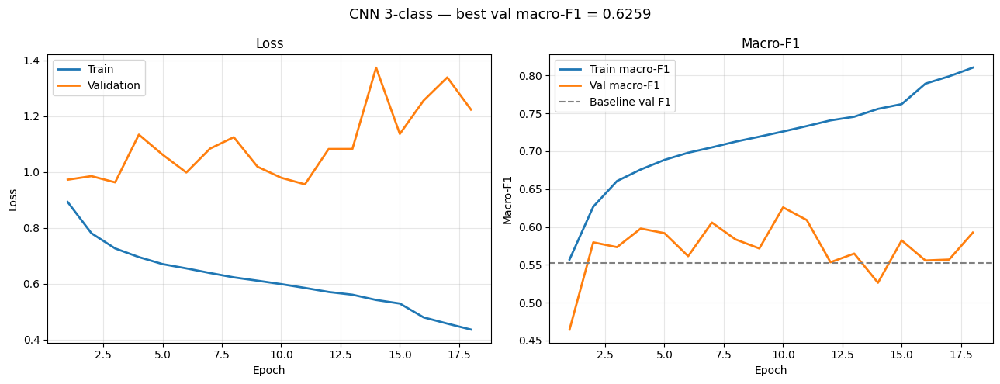


Saved results to: /content/drive/MyDrive/Invertebrate recordings subset/cnn_3class_results.json


In [ ]:
# =============================================================================
# Step 9: Load best model and produce final report
# =============================================================================
print("=" * 70)
print("Step 9: Final validation evaluation with best model")
print("=" * 70)

checkpoint = torch.load(MODEL_SAVE_PATH, map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
print(f"Loaded best model from epoch {checkpoint['epoch']}")
print(f"  Best val macro-F1: {checkpoint['val_f1']:.4f}")
print()

val_loss, val_acc, val_f1, val_preds, val_labels = evaluate(
    model, val_loader, criterion, device)

print(f"Final validation metrics:")
print(f"  Accuracy: {val_acc:.4f}")
print(f"  Macro-F1: {val_f1:.4f}")
print()

precision, recall, f1, support = precision_recall_fscore_support(
    val_labels, val_preds, labels=list(range(len(CLASSES_3))), zero_division=0)
per_class_df = pd.DataFrame({
    'class': CLASSES_3, 'precision': precision, 'recall': recall,
    'f1': f1, 'support': support,
})
print("Per-class validation metrics:")
print(per_class_df.to_string(index=False))
print()

cm = confusion_matrix(val_labels, val_preds, labels=list(range(len(CLASSES_3))))
cm_df = pd.DataFrame(cm, index=CLASSES_3, columns=CLASSES_3)
cm_df.index.name = 'True'
cm_df.columns.name = 'Predicted'
print("Validation confusion matrix:")
print(cm_df)
print()

# Comparison to baseline
with open(PROJECT_ROOT / 'baseline_results.json') as f:
    baseline_data = json.load(f)
b_acc = baseline_data['3class']['val_accuracy']
b_f1 = baseline_data['3class']['val_macro_f1']

print("=" * 70)
print("Comparison: CNN vs Baseline (3-class, validation)")
print("=" * 70)
print(f"{'Metric':<20} {'Baseline':>10} {'CNN':>10} {'Δ':>10}")
print("-" * 55)
print(f"{'Accuracy':<20} {b_acc:>10.4f} {val_acc:>10.4f} {val_acc - b_acc:>+10.4f}")
print(f"{'Macro-F1':<20} {b_f1:>10.4f} {val_f1:>10.4f} {val_f1 - b_f1:>+10.4f}")
print()

# Training plots
hist_df = pd.DataFrame(history)
fig, axes = plt.subplots(1, 2, figsize=(13, 5))
axes[0].plot(hist_df['epoch'], hist_df['train_loss'], label='Train', linewidth=2)
axes[0].plot(hist_df['epoch'], hist_df['val_loss'], label='Validation', linewidth=2)
axes[0].set_xlabel('Epoch'); axes[0].set_ylabel('Loss')
axes[0].set_title('Loss'); axes[0].legend(); axes[0].grid(True, alpha=0.3)

axes[1].plot(hist_df['epoch'], hist_df['train_f1'], label='Train macro-F1', linewidth=2)
axes[1].plot(hist_df['epoch'], hist_df['val_f1'], label='Val macro-F1', linewidth=2)
axes[1].axhline(b_f1, color='gray', linestyle='--', label='Baseline val F1')
axes[1].set_xlabel('Epoch'); axes[1].set_ylabel('Macro-F1')
axes[1].set_title('Macro-F1'); axes[1].legend(); axes[1].grid(True, alpha=0.3)

fig.suptitle(f'CNN 3-class — best val macro-F1 = {best_val_f1:.4f}', fontsize=13)
plt.tight_layout()
save_figure(fig, '18b_cnn_3class_training_history')
plt.show()
plt.close(fig)

# Save results
cnn_3class_results = {
    'best_val_accuracy': float(val_acc),
    'best_val_macro_f1': float(val_f1),
    'best_epoch': int(checkpoint['epoch']),
    'per_class': per_class_df.to_dict(orient='records'),
    'confusion_matrix': cm_df.values.tolist(),
    'classes': CLASSES_3,
    'baseline_val_macro_f1': b_f1,
    'improvement_over_baseline': float(val_f1 - b_f1),
    'total_training_time_minutes': float(total_time / 60),
    'epochs_run': len(history),
}
with open(PROJECT_ROOT / 'cnn_3class_results.json', 'w') as f:
    json.dump(cnn_3class_results, f, indent=2)
print(f"\nSaved results to: {PROJECT_ROOT / 'cnn_3class_results.json'}")

## Block 19: Recording-Level and Session-Level Aggregation

**Purpose:** Aggregate the trained CNN's window-level predictions to recording-level and session-level classifications, matching the project's actual goal of identifying which invertebrate is present in a recording.

**Method:**
1. Load the best CNN model (from Block 18b)
2. Run inference on all validation windows, recording per-window predicted probabilities
3. Group windows by source recording (.wav file) and aggregate:
   - **Majority vote:** most common predicted class across the recording's windows
   - **Mean probability:** average class probabilities, then argmax
4. Group windows by session and aggregate the same two ways
5. Compare accuracy at three levels: window → recording → session

**Why this matters:** The PhD goal is recording-level identification. Window-level metrics (62% accuracy) understate true performance because aggregating many windows averages out random per-window errors. This block measures the metric that actually matters for the deliverable.

**Outputs:**
- Accuracy and macro-F1 at window, recording, and session levels
- Confusion matrices at recording and session levels
- Comparison showing how accuracy improves with aggregation

In [ ]:
from collections import Counter
from scipy.stats import mode as scipy_mode

# =============================================================================
# Step 1: Load best CNN and set up inference
# =============================================================================
print("=" * 70)
print("Step 1: Load best CNN model")
print("=" * 70)

# Rebuild model architecture and load weights
model = SpectrogramCNN(n_classes=3).to(device)
checkpoint = torch.load(PROJECT_ROOT / 'cnn_3class_best.pt', map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()
print(f"Loaded best model from epoch {checkpoint['epoch']}, val_f1={checkpoint['val_f1']:.4f}")
print()

# =============================================================================
# Step 2: Run inference on validation windows, tracking source recording
# =============================================================================
print("=" * 70)
print("Step 2: Run inference on validation windows with source tracking")
print("=" * 70)

# We need per-window predictions AND which recording/session each window came from.
# Rebuild the validation file list with metadata.
session_keys = ['day', 'batch', 'taxon', 'count', 'replicate_id']
val_sessions = splits_3class[splits_3class['split'] == 'val']
val_files = manifest_df.merge(val_sessions[session_keys], on=session_keys, how='inner')

print(f"Validation files: {len(val_files)}")

# Storage for per-window results with provenance
records = []  # one row per window

with torch.no_grad():
    for _, row in tqdm(val_files.iterrows(), total=len(val_files), desc="Inference"):
        npz_path = FEATURES_DIR / row['feature_filename']
        data = np.load(npz_path)
        features = data['features']  # (n_windows, 128, 235)

        # Batch through the model
        X = torch.from_numpy(features[:, np.newaxis, :, :].astype(np.float32)).to(device)
        logits = model(X)
        probs = torch.softmax(logits, dim=1).cpu().numpy()  # (n_windows, 3)
        preds = probs.argmax(axis=1)

        true_label_idx = CLASS_TO_IDX[row['taxon']]
        recording_id = row['feature_filename']
        session_id = (f"d{row['day']}_b{row['batch']}_"
                      f"{row['taxon']}_n{row['count']}_rep{row['replicate_id']}")

        for w in range(len(features)):
            records.append({
                'recording_id': recording_id,
                'session_id': session_id,
                'true_label': true_label_idx,
                'pred_label': int(preds[w]),
                'prob_ants': probs[w, 0],
                'prob_beetle_larvae': probs[w, 1],
                'prob_termites': probs[w, 2],
            })

window_df = pd.DataFrame(records)
print(f"Total validation windows: {len(window_df)}")
print()

# =============================================================================
# Step 3: Window-level metrics (baseline for comparison)
# =============================================================================
print("=" * 70)
print("Step 3: Window-level metrics")
print("=" * 70)

window_acc = accuracy_score(window_df['true_label'], window_df['pred_label'])
window_f1 = f1_score(window_df['true_label'], window_df['pred_label'], average='macro')
print(f"Window-level accuracy: {window_acc:.4f}")
print(f"Window-level macro-F1: {window_f1:.4f}")
print()

# =============================================================================
# Step 4: Aggregation helper
# =============================================================================
def aggregate_predictions(window_df, group_col):
    """Aggregate window predictions to group level via majority vote and mean-prob.

    Returns DataFrame with one row per group, columns:
        true_label, pred_majority, pred_meanprob
    """
    prob_cols = ['prob_ants', 'prob_beetle_larvae', 'prob_termites']
    rows = []
    for group_id, g in window_df.groupby(group_col):
        true_label = g['true_label'].iloc[0]  # all windows in group share true label

        # Majority vote
        majority = Counter(g['pred_label']).most_common(1)[0][0]

        # Mean probability
        mean_probs = g[prob_cols].mean().values
        meanprob = int(np.argmax(mean_probs))

        rows.append({
            group_col: group_id,
            'true_label': true_label,
            'pred_majority': majority,
            'pred_meanprob': meanprob,
            'n_windows': len(g),
        })
    return pd.DataFrame(rows)

# =============================================================================
# Step 5: Recording-level aggregation
# =============================================================================
print("=" * 70)
print("Step 5: Recording-level aggregation (per .wav file)")
print("=" * 70)

rec_agg = aggregate_predictions(window_df, 'recording_id')
print(f"Number of recordings: {len(rec_agg)}")
print()

for method, col in [('Majority vote', 'pred_majority'),
                    ('Mean probability', 'pred_meanprob')]:
    acc = accuracy_score(rec_agg['true_label'], rec_agg[col])
    f1 = f1_score(rec_agg['true_label'], rec_agg[col], average='macro')
    print(f"  {method}: accuracy={acc:.4f}, macro-F1={f1:.4f}")
print()

# Recording-level confusion matrix (mean-prob)
rec_cm = confusion_matrix(rec_agg['true_label'], rec_agg['pred_meanprob'],
                          labels=list(range(len(CLASSES_3))))
rec_cm_df = pd.DataFrame(rec_cm, index=CLASSES_3, columns=CLASSES_3)
rec_cm_df.index.name = 'True'; rec_cm_df.columns.name = 'Predicted'
print("Recording-level confusion matrix (mean probability):")
print(rec_cm_df)
print()

# =============================================================================
# Step 6: Session-level aggregation
# =============================================================================
print("=" * 70)
print("Step 6: Session-level aggregation (all files in a session)")
print("=" * 70)

sess_agg = aggregate_predictions(window_df, 'session_id')
print(f"Number of sessions: {len(sess_agg)}")
print()

for method, col in [('Majority vote', 'pred_majority'),
                    ('Mean probability', 'pred_meanprob')]:
    acc = accuracy_score(sess_agg['true_label'], sess_agg[col])
    f1 = f1_score(sess_agg['true_label'], sess_agg[col], average='macro')
    print(f"  {method}: accuracy={acc:.4f}, macro-F1={f1:.4f}")
print()

sess_cm = confusion_matrix(sess_agg['true_label'], sess_agg['pred_meanprob'],
                           labels=list(range(len(CLASSES_3))))
sess_cm_df = pd.DataFrame(sess_cm, index=CLASSES_3, columns=CLASSES_3)
sess_cm_df.index.name = 'True'; sess_cm_df.columns.name = 'Predicted'
print("Session-level confusion matrix (mean probability):")
print(sess_cm_df)
print()

# =============================================================================
# Step 7: Summary — accuracy climbing with aggregation
# =============================================================================
print("=" * 70)
print("Step 7: Accuracy across aggregation levels (validation)")
print("=" * 70)

summary = pd.DataFrame({
    'level': ['Window', 'Recording (majority)', 'Recording (mean-prob)',
              'Session (majority)', 'Session (mean-prob)'],
    'accuracy': [
        window_acc,
        accuracy_score(rec_agg['true_label'], rec_agg['pred_majority']),
        accuracy_score(rec_agg['true_label'], rec_agg['pred_meanprob']),
        accuracy_score(sess_agg['true_label'], sess_agg['pred_majority']),
        accuracy_score(sess_agg['true_label'], sess_agg['pred_meanprob']),
    ],
    'macro_f1': [
        window_f1,
        f1_score(rec_agg['true_label'], rec_agg['pred_majority'], average='macro'),
        f1_score(rec_agg['true_label'], rec_agg['pred_meanprob'], average='macro'),
        f1_score(sess_agg['true_label'], sess_agg['pred_majority'], average='macro'),
        f1_score(sess_agg['true_label'], sess_agg['pred_meanprob'], average='macro'),
    ],
})
print(summary.to_string(index=False))
print()

# Save aggregation results
agg_results = {
    'window_accuracy': float(window_acc),
    'window_macro_f1': float(window_f1),
    'recording_majority_accuracy': float(accuracy_score(rec_agg['true_label'], rec_agg['pred_majority'])),
    'recording_meanprob_accuracy': float(accuracy_score(rec_agg['true_label'], rec_agg['pred_meanprob'])),
    'recording_meanprob_macro_f1': float(f1_score(rec_agg['true_label'], rec_agg['pred_meanprob'], average='macro')),
    'session_meanprob_accuracy': float(accuracy_score(sess_agg['true_label'], sess_agg['pred_meanprob'])),
    'session_meanprob_macro_f1': float(f1_score(sess_agg['true_label'], sess_agg['pred_meanprob'], average='macro')),
    'n_recordings': len(rec_agg),
    'n_sessions': len(sess_agg),
}
with open(PROJECT_ROOT / 'cnn_3class_aggregation.json', 'w') as f:
    json.dump(agg_results, f, indent=2)
print(f"Saved aggregation results to: {PROJECT_ROOT / 'cnn_3class_aggregation.json'}")

Step 1: Load best CNN model
Loaded best model from epoch 10, val_f1=0.6259

Step 2: Run inference on validation windows with source tracking
Validation files: 239


Inference: 100%|██████████| 239/239 [00:59<00:00,  4.01it/s]


Total validation windows: 27953

Step 3: Window-level metrics
Window-level accuracy: 0.6311
Window-level macro-F1: 0.6259

Step 5: Recording-level aggregation (per .wav file)
Number of recordings: 239

  Majority vote: accuracy=0.7741, macro-F1=0.7726
  Mean probability: accuracy=0.7531, macro-F1=0.7490

Recording-level confusion matrix (mean probability):
Predicted      ants  beetle_larvae  termites
True                                        
ants             53              0        15
beetle_larvae     0             78        19
termites         15             10        49

Step 6: Session-level aggregation (all files in a session)
Number of sessions: 9

  Majority vote: accuracy=0.7778, macro-F1=0.7746
  Mean probability: accuracy=0.8889, macro-F1=0.8667

Session-level confusion matrix (mean probability):
Predicted      ants  beetle_larvae  termites
True                                        
ants              2              0         0
beetle_larvae     0              4         

## Block 20: Error Analysis — Understanding the Ant↔Termite Confusion

**Purpose:** Diagnose whether the systematic ant↔termite confusion is uniform or concentrated in identifiable conditions (density, day, recording energy). Findings will guide interpretation of subsequent pretrained-model experiments and inform the thesis narrative.

**Analyses (all on validation set, recording-level):**
1. **Confusion by density** — are n=10 recordings more confused than n=30?
2. **Confusion by day** — do specific days drive the errors (suggesting recording-condition confounds)?
3. **Confusion vs recording energy** — do quiet/low-activity recordings fail more?
4. **Error directionality and confidence** — is ant→termite worse than termite→ant, and how confident are the errors?
5. **Ranked worst-misclassified recordings** — to set up potential visual inspection.

**Method:**
- Regenerate validation window predictions with the best CNN (self-contained, ~1 minute)
- Aggregate to recording level (mean probability)
- Join recording predictions with inventory metadata (day, batch, count, peak amplitude)
- Slice misclassification rates across the dimensions above

**Why validation, not test:** Test set remains sealed for final evaluation. All diagnostic work uses validation predictions.

In [ ]:
# =============================================================================
# Step 1: Regenerate validation predictions (self-contained)
# =============================================================================
print("=" * 70)
print("Step 1: Regenerate validation predictions with best CNN")
print("=" * 70)

# Ensure model architecture exists and load best weights
model = SpectrogramCNN(n_classes=3).to(device)
checkpoint = torch.load(PROJECT_ROOT / 'cnn_3class_best.pt', map_location=device)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()
print(f"Loaded best model: epoch {checkpoint['epoch']}, val_f1={checkpoint['val_f1']:.4f}")

session_keys = ['day', 'batch', 'taxon', 'count', 'replicate_id']
val_sessions = splits_3class[splits_3class['split'] == 'val']
val_files = manifest_df.merge(val_sessions[session_keys], on=session_keys, how='inner')

records = []
with torch.no_grad():
    for _, row in tqdm(val_files.iterrows(), total=len(val_files), desc="Inference"):
        data = np.load(FEATURES_DIR / row['feature_filename'])
        features = data['features']
        X = torch.from_numpy(features[:, np.newaxis, :, :].astype(np.float32)).to(device)
        probs = torch.softmax(model(X), dim=1).cpu().numpy()
        preds = probs.argmax(axis=1)

        for w in range(len(features)):
            records.append({
                'recording_id': row['feature_filename'],
                'true_label': CLASS_TO_IDX[row['taxon']],
                'pred_label': int(preds[w]),
                'prob_ants': probs[w, 0],
                'prob_beetle_larvae': probs[w, 1],
                'prob_termites': probs[w, 2],
            })

window_df = pd.DataFrame(records)
print(f"Validation windows: {len(window_df)}")
print()

# =============================================================================
# Step 2: Aggregate to recording level with mean probability
# =============================================================================
prob_cols = ['prob_ants', 'prob_beetle_larvae', 'prob_termites']

rec_rows = []
for rec_id, g in window_df.groupby('recording_id'):
    mean_probs = g[prob_cols].mean().values
    rec_rows.append({
        'feature_filename': rec_id,
        'true_label': g['true_label'].iloc[0],
        'pred_label': int(np.argmax(mean_probs)),
        'prob_ants': mean_probs[0],
        'prob_beetle_larvae': mean_probs[1],
        'prob_termites': mean_probs[2],
        'max_prob': float(np.max(mean_probs)),
        'n_windows': len(g),
    })
rec_df = pd.DataFrame(rec_rows)

# Join with inventory metadata
inv_cols = ['feature_filename'] if 'feature_filename' in manifest_df.columns else None
rec_df = rec_df.merge(
    manifest_df[['feature_filename', 'day', 'batch', 'taxon', 'count', 'replicate_id']],
    on='feature_filename', how='left'
)

# Also join peak amplitude from inventory (proxy for recording loudness/activity)
# Match via source filepath through the manifest
inv_subset = inventory_final_df[['filepath', 'peak_amplitude', 'is_partial']].copy()
manifest_with_path = manifest_df[['feature_filename', 'source_filepath']].rename(
    columns={'source_filepath': 'filepath'})
rec_df = rec_df.merge(manifest_with_path, on='feature_filename', how='left')
rec_df = rec_df.merge(inv_subset, on='filepath', how='left')

rec_df['correct'] = rec_df['true_label'] == rec_df['pred_label']
rec_df['true_class'] = rec_df['true_label'].map(IDX_TO_CLASS)
rec_df['pred_class'] = rec_df['pred_label'].map(IDX_TO_CLASS)

print(f"Recordings analyzed: {len(rec_df)}")
print(f"Overall recording-level accuracy: {rec_df['correct'].mean():.4f}")
print()

# =============================================================================
# Step 3: Analysis 1 — Confusion by density
# =============================================================================
print("=" * 70)
print("Analysis 1: Recording accuracy by class and density")
print("=" * 70)

by_density = (rec_df.groupby(['true_class', 'count'])
              .agg(n_recordings=('correct', 'count'),
                   accuracy=('correct', 'mean'))
              .reset_index())
by_density['accuracy'] = by_density['accuracy'].round(3)
print(by_density.to_string(index=False))
print()

# For ants and termites specifically, where do errors go?
print("Where do ant recordings get misclassified, by density?")
for count in sorted(rec_df[rec_df['true_class'] == 'ants']['count'].unique()):
    subset = rec_df[(rec_df['true_class'] == 'ants') & (rec_df['count'] == count)]
    pred_dist = subset['pred_class'].value_counts()
    print(f"  Ants n={count} (total {len(subset)}): {dict(pred_dist)}")
print()
print("Where do termite recordings get misclassified, by density?")
for count in sorted(rec_df[rec_df['true_class'] == 'termites']['count'].unique()):
    subset = rec_df[(rec_df['true_class'] == 'termites') & (rec_df['count'] == count)]
    pred_dist = subset['pred_class'].value_counts()
    print(f"  Termites n={count} (total {len(subset)}): {dict(pred_dist)}")
print()

# =============================================================================
# Step 4: Analysis 2 — Confusion by day
# =============================================================================
print("=" * 70)
print("Analysis 2: Recording accuracy by day (ants and termites only)")
print("=" * 70)

at_df = rec_df[rec_df['true_class'].isin(['ants', 'termites'])]
by_day = (at_df.groupby(['true_class', 'day'])
          .agg(n_recordings=('correct', 'count'),
               accuracy=('correct', 'mean'))
          .reset_index())
by_day['accuracy'] = by_day['accuracy'].round(3)
print(by_day.to_string(index=False))
print()

# =============================================================================
# Step 5: Analysis 3 — Confusion vs recording energy
# =============================================================================
print("=" * 70)
print("Analysis 3: Does recording loudness relate to misclassification?")
print("=" * 70)

for cls in ['ants', 'termites']:
    subset = rec_df[rec_df['true_class'] == cls]
    correct_peak = subset[subset['correct']]['peak_amplitude']
    wrong_peak = subset[~subset['correct']]['peak_amplitude']
    print(f"  {cls.capitalize()}:")
    print(f"    Correctly classified (n={len(correct_peak)}): "
          f"mean peak amplitude = {correct_peak.mean():.4f}")
    print(f"    Misclassified      (n={len(wrong_peak)}): "
          f"mean peak amplitude = {wrong_peak.mean():.4f}")
print()

# =============================================================================
# Step 6: Analysis 4 — Error directionality and confidence
# =============================================================================
print("=" * 70)
print("Analysis 4: Error directionality and confidence")
print("=" * 70)

# Ant -> termite errors
ant_to_term = rec_df[(rec_df['true_class'] == 'ants') & (rec_df['pred_class'] == 'termites')]
term_to_ant = rec_df[(rec_df['true_class'] == 'termites') & (rec_df['pred_class'] == 'ants')]
ants_correct = rec_df[(rec_df['true_class'] == 'ants') & (rec_df['correct'])]
terms_correct = rec_df[(rec_df['true_class'] == 'termites') & (rec_df['correct'])]

print(f"Ant recordings → predicted termite: {len(ant_to_term)} "
      f"(mean confidence in wrong answer: {ant_to_term['prob_termites'].mean():.3f})")
print(f"Termite recordings → predicted ant: {len(term_to_ant)} "
      f"(mean confidence in wrong answer: {term_to_ant['prob_ants'].mean():.3f})")
print()
print(f"Correctly classified ants: mean confidence = {ants_correct['prob_ants'].mean():.3f}")
print(f"Correctly classified termites: mean confidence = {terms_correct['prob_termites'].mean():.3f}")
print()

# Are errors confident or uncertain?
print("Confidence distribution of ant→termite errors:")
if len(ant_to_term) > 0:
    print(f"  High confidence (>0.6 termite): {(ant_to_term['prob_termites'] > 0.6).sum()}")
    print(f"  Medium (0.45-0.6):              {((ant_to_term['prob_termites'] >= 0.45) & (ant_to_term['prob_termites'] <= 0.6)).sum()}")
    print(f"  Low/uncertain (<0.45):          {(ant_to_term['prob_termites'] < 0.45).sum()}")
print()

# =============================================================================
# Step 7: Analysis 5 — Worst-misclassified recordings
# =============================================================================
print("=" * 70)
print("Analysis 5: Most confidently misclassified ant recordings")
print("=" * 70)

worst_ants = ant_to_term.nlargest(10, 'prob_termites')[
    ['feature_filename', 'count', 'day', 'batch', 'prob_ants', 'prob_termites', 'n_windows']
]
print("Top 10 ant recordings most confidently misclassified as termites:")
print(worst_ants.to_string(index=False))
print()

# =============================================================================
# Step 8: Save and summarize
# =============================================================================
error_analysis = {
    'overall_recording_accuracy': float(rec_df['correct'].mean()),
    'accuracy_by_class_density': by_density.to_dict(orient='records'),
    'ant_to_termite_errors': len(ant_to_term),
    'termite_to_ant_errors': len(term_to_ant),
    'ant_to_termite_mean_confidence': float(ant_to_term['prob_termites'].mean()) if len(ant_to_term) else None,
    'ants_correct_mean_confidence': float(ants_correct['prob_ants'].mean()) if len(ants_correct) else None,
}
with open(PROJECT_ROOT / 'error_analysis_3class.json', 'w') as f:
    json.dump(error_analysis, f, indent=2)

# Save the full recording-level prediction dataframe for any follow-up
rec_df.to_csv(PROJECT_ROOT / 'val_recording_predictions.csv', index=False)
print(f"Saved error analysis to: error_analysis_3class.json")
print(f"Saved recording predictions to: val_recording_predictions.csv")

Step 1: Regenerate validation predictions with best CNN
Loaded best model: epoch 10, val_f1=0.6259


Inference: 100%|██████████| 239/239 [00:59<00:00,  3.99it/s]


Validation windows: 27953

Recordings analyzed: 239
Overall recording-level accuracy: 0.7531

Analysis 1: Recording accuracy by class and density
   true_class  count  n_recordings  accuracy
         ants     10            45     0.689
         ants     30            23     0.957
beetle_larvae      1            48     0.771
beetle_larvae      3            49     0.837
     termites     10            50     0.640
     termites     30            24     0.708

Where do ant recordings get misclassified, by density?
  Ants n=10 (total 45): {'ants': np.int64(31), 'termites': np.int64(14)}
  Ants n=30 (total 23): {'ants': np.int64(22), 'termites': np.int64(1)}

Where do termite recordings get misclassified, by density?
  Termites n=10 (total 50): {'termites': np.int64(32), 'ants': np.int64(15), 'beetle_larvae': np.int64(3)}
  Termites n=30 (total 24): {'termites': np.int64(17), 'beetle_larvae': np.int64(7)}

Analysis 2: Recording accuracy by day (ants and termites only)
true_class  day  n_rec

## Block 21: Confound Investigation — Why Are Loud Recordings Misclassified?

**Purpose:** Determine whether the ant→termite confusion is driven by recording-condition artifacts (clipping, contamination, specific day-batch sessions) or by genuine biological similarity.

**Key questions:**
1. Do misclassified recordings have higher clipping rates than correctly classified ones?
2. Which day-batch sessions do the misclassified ant recordings come from?
3. Is the loudness-misclassification link explained by clipping, or is it independent?
4. What do the misclassified loud recordings actually look like (spectrograms)?

**Method:**
1. Load validation recording predictions (from Block 20) and join with clipping metadata
2. Compare clipping rates between correctly classified and misclassified recordings
3. Tabulate misclassified ant recordings by day-batch session
4. Generate spectrograms of representative misclassified ant recordings alongside correctly-classified ant recordings for visual comparison
5. Cross-reference with Phase 2 day-level clipping findings

**Why this matters:** If the confusion is artifact-driven, it may be addressable (better splits, quality filtering, or documenting it as a limitation). If it is genuine biology, it sets a real ceiling. We cannot interpret model comparisons until we know which.

In [ ]:
# =============================================================================
# Step 1: Load recording predictions and join clipping metadata
# =============================================================================
print("=" * 70)
print("Step 1: Join recording predictions with clipping metadata")
print("=" * 70)

rec_df = pd.read_csv(PROJECT_ROOT / 'val_recording_predictions.csv')

# Join per-file clipping info from inventory
clip_info = inventory_final_df[['filepath', 'has_clipping', 'n_clipped_samples',
                                 'peak_amplitude', 'duration_s']].copy()
rec_df = rec_df.merge(clip_info, on='filepath', how='left', suffixes=('', '_inv'))

# Use the inventory peak_amplitude (already there) and clipping
print(f"Recordings: {len(rec_df)}")
print(f"Columns available: {[c for c in rec_df.columns if 'clip' in c or 'peak' in c]}")
print()

# =============================================================================
# Step 2: Clipping rate — correct vs misclassified
# =============================================================================
print("=" * 70)
print("Step 2: Clipping comparison (correct vs misclassified)")
print("=" * 70)

for cls in ['ants', 'termites']:
    subset = rec_df[rec_df['true_class'] == cls]
    correct = subset[subset['correct']]
    wrong = subset[~subset['correct']]
    print(f"{cls.capitalize()}:")
    print(f"  Correct (n={len(correct)}):")
    print(f"    clipping rate: {correct['has_clipping'].mean():.3f}")
    print(f"    mean clipped samples: {correct['n_clipped_samples'].mean():.0f}")
    print(f"    mean peak amplitude: {correct['peak_amplitude'].mean():.4f}")
    print(f"  Misclassified (n={len(wrong)}):")
    print(f"    clipping rate: {wrong['has_clipping'].mean():.3f}")
    print(f"    mean clipped samples: {wrong['n_clipped_samples'].mean():.0f}")
    print(f"    mean peak amplitude: {wrong['peak_amplitude'].mean():.4f}")
    print()

# =============================================================================
# Step 3: Misclassified ants by day-batch session
# =============================================================================
print("=" * 70)
print("Step 3: Misclassified ant recordings by day-batch")
print("=" * 70)

mis_ants = rec_df[(rec_df['true_class'] == 'ants') & (~rec_df['correct'])]
correct_ants = rec_df[(rec_df['true_class'] == 'ants') & (rec_df['correct'])]

print("Misclassified ant recordings — distribution by (day, batch, count):")
mis_dist = mis_ants.groupby(['day', 'batch', 'count']).size().reset_index(name='n_misclassified')
print(mis_dist.to_string(index=False))
print()

print("Correctly classified ant recordings — distribution by (day, batch, count):")
cor_dist = correct_ants.groupby(['day', 'batch', 'count']).size().reset_index(name='n_correct')
print(cor_dist.to_string(index=False))
print()

# =============================================================================
# Step 4: Is loudness independent of clipping?
# =============================================================================
print("=" * 70)
print("Step 4: Loudness vs clipping relationship")
print("=" * 70)

# Among misclassified ants, how many are loud due to clipping vs loud without clipping?
print("Misclassified ant recordings breakdown:")
print(f"  With clipping:    {mis_ants['has_clipping'].sum()} / {len(mis_ants)}")
print(f"  Without clipping: {(~mis_ants['has_clipping']).sum()} / {len(mis_ants)}")
print()
print("  Peak amplitude of misclassified ants WITHOUT clipping:")
no_clip_mis = mis_ants[~mis_ants['has_clipping']]
if len(no_clip_mis) > 0:
    print(f"    n={len(no_clip_mis)}, mean peak = {no_clip_mis['peak_amplitude'].mean():.4f}")
    print(f"    (compare to correctly classified ants: {correct_ants['peak_amplitude'].mean():.4f})")
print()

# =============================================================================
# Step 5: Cross-reference Phase 2 day-level clipping
# =============================================================================
print("=" * 70)
print("Step 5: Day-level clipping rates (full dataset, from Phase 2)")
print("=" * 70)

day_clip = (inventory_final_df.groupby('day')
            .agg(n_files=('has_clipping', 'count'),
                 n_clipped=('has_clipping', 'sum'))
            .reset_index())
day_clip['pct_clipped'] = (day_clip['n_clipped'] / day_clip['n_files'] * 100).round(1)
print(day_clip.to_string(index=False))
print()
print("Recall: misclassified validation ants concentrate on Days 3 and 5.")

Step 1: Join recording predictions with clipping metadata
Recordings: 239
Columns available: ['peak_amplitude', 'has_clipping', 'n_clipped_samples', 'peak_amplitude_inv']

Step 2: Clipping comparison (correct vs misclassified)
Ants:
  Correct (n=53):
    clipping rate: 0.019
    mean clipped samples: 0
    mean peak amplitude: 0.2628
  Misclassified (n=15):
    clipping rate: 0.067
    mean clipped samples: 25
    mean peak amplitude: 0.3112

Termites:
  Correct (n=49):
    clipping rate: 0.061
    mean clipped samples: 492
    mean peak amplitude: 0.2276
  Misclassified (n=25):
    clipping rate: 0.040
    mean clipped samples: 231
    mean peak amplitude: 0.3253

Step 3: Misclassified ant recordings by day-batch
Misclassified ant recordings — distribution by (day, batch, count):
 day  batch  count  n_misclassified
   3      4     10               14
   5      4     30                1

Correctly classified ant recordings — distribution by (day, batch, count):
 day  batch  count  n_co

Step 6: Spectrograms — misclassified vs correct ant recordings
  Saved: 21_misclassified_vs_correct_ants.png and 21_misclassified_vs_correct_ants.pdf


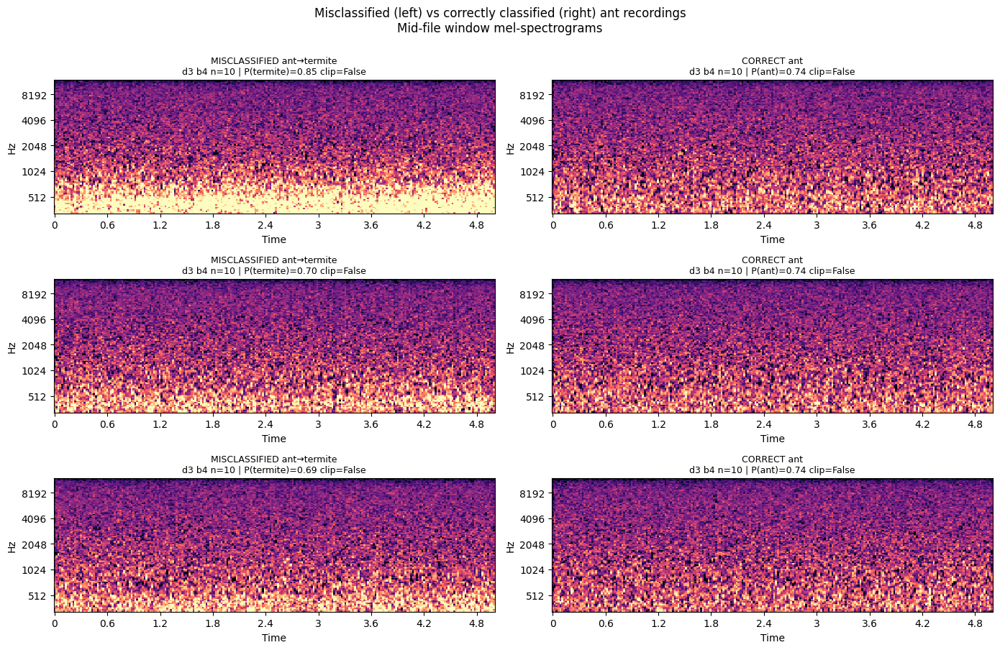

Spectrogram comparison saved.

Compare visually: do the misclassified ant recordings look different from
correct ant recordings? If they look like termites (or have artifacts like
clipping streaks), that supports the recording-condition hypothesis.


In [ ]:
import librosa
import librosa.display
# =============================================================================
# Step 6: Generate comparison spectrograms
# =============================================================================
print("=" * 70)
print("Step 6: Spectrograms — misclassified vs correct ant recordings")
print("=" * 70)

# Pick 3 misclassified ant recordings (most confident errors) and 3 correct ones
mis_ants_sorted = mis_ants.sort_values('prob_termites', ascending=False)
correct_ants_sorted = correct_ants.sort_values('prob_ants', ascending=False)

n_show = 3
show_mis = mis_ants_sorted.head(n_show)
show_cor = correct_ants_sorted.head(n_show)

# Helper to load a representative window's mel-spectrogram from a feature file
def load_mid_window_spec(feature_filename):
    data = np.load(FEATURES_DIR / feature_filename)
    features = data['features']  # (n_windows, 128, 235)
    mid = len(features) // 2
    return features[mid]

# Plot 2 columns (misclassified | correct), 3 rows
fig, axes = plt.subplots(n_show, 2, figsize=(14, 3 * n_show))

for i in range(n_show):
    # Misclassified (left column)
    mis_row = show_mis.iloc[i]
    spec_mis = load_mid_window_spec(mis_row['feature_filename'])
    img = librosa.display.specshow(
        spec_mis, sr=48000, hop_length=1024,
        x_axis='time', y_axis='mel', fmin=200, fmax=12000,
        ax=axes[i, 0], cmap='magma', vmin=-2, vmax=2)
    axes[i, 0].set_title(
        f"MISCLASSIFIED ant→termite\n"
        f"d{mis_row['day']} b{mis_row['batch']} n={mis_row['count']} | "
        f"P(termite)={mis_row['prob_termites']:.2f} clip={mis_row['has_clipping']}",
        fontsize=9)

    # Correct (right column)
    cor_row = show_cor.iloc[i]
    spec_cor = load_mid_window_spec(cor_row['feature_filename'])
    img = librosa.display.specshow(
        spec_cor, sr=48000, hop_length=1024,
        x_axis='time', y_axis='mel', fmin=200, fmax=12000,
        ax=axes[i, 1], cmap='magma', vmin=-2, vmax=2)
    axes[i, 1].set_title(
        f"CORRECT ant\n"
        f"d{cor_row['day']} b{cor_row['batch']} n={cor_row['count']} | "
        f"P(ant)={cor_row['prob_ants']:.2f} clip={cor_row['has_clipping']}",
        fontsize=9)

fig.suptitle('Misclassified (left) vs correctly classified (right) ant recordings\n'
             'Mid-file window mel-spectrograms', fontsize=12, y=1.00)
plt.tight_layout()
save_figure(fig, '21_misclassified_vs_correct_ants')
plt.show()
plt.close(fig)

print("Spectrogram comparison saved.")
print()
print("Compare visually: do the misclassified ant recordings look different from")
print("correct ant recordings? If they look like termites (or have artifacts like")
print("clipping streaks), that supports the recording-condition hypothesis.")

## Block 22: Freeze Custom CNN as Versioned Benchmark

**Purpose:** Lock in the current best custom CNN under a frozen, versioned filename so it cannot be overwritten by future training runs. Record its exact provenance and metrics as the benchmark against which pretrained models will be compared.

**Why this is necessary:** The earlier confusion (Findings 3.10–3.13) arose because `cnn_3class_best.pt` was overwritten when training was re-run after a runtime disconnect. To ensure reproducible comparisons, the benchmark model is saved under a name that subsequent training will not touch, with its metrics frozen in a results file.

**What this block does:**
1. Load the current `cnn_3class_best.pt` and verify its identity (epoch, val_f1)
2. Re-evaluate it on validation to produce a definitive, internally-consistent metrics record (window, recording, and session level)
3. Save the model under a frozen name: `cnn_3class_FINAL_v1.pt`
4. Save a complete metrics record: `cnn_3class_FINAL_v1_metrics.json`

**Note:** This does NOT touch the test set. Test remains sealed for final evaluation after model selection.

In [ ]:
import shutil

# =============================================================================
# Step 1: Load and verify the current best model
# =============================================================================
print("=" * 70)
print("Step 1: Load and verify current best CNN")
print("=" * 70)

CURRENT_BEST = PROJECT_ROOT / 'cnn_3class_best.pt'
checkpoint = torch.load(CURRENT_BEST, map_location=device)
print(f"Current best model:")
print(f"  Epoch: {checkpoint['epoch']}")
print(f"  Val macro-F1: {checkpoint['val_f1']:.4f}")
print(f"  Val accuracy: {checkpoint['val_acc']:.4f}")
print()

model = SpectrogramCNN(n_classes=3).to(device)
model.load_state_dict(checkpoint['model_state_dict'])
model.eval()

# =============================================================================
# Step 2: Definitive validation evaluation (window / recording / session)
# =============================================================================
print("=" * 70)
print("Step 2: Definitive validation evaluation")
print("=" * 70)

session_keys = ['day', 'batch', 'taxon', 'count', 'replicate_id']
val_sessions = splits_3class[splits_3class['split'] == 'val']
val_files = manifest_df.merge(val_sessions[session_keys], on=session_keys, how='inner')

prob_cols = ['prob_ants', 'prob_beetle_larvae', 'prob_termites']
records = []
with torch.no_grad():
    for _, row in tqdm(val_files.iterrows(), total=len(val_files), desc="Inference"):
        data = np.load(FEATURES_DIR / row['feature_filename'])
        features = data['features']
        X = torch.from_numpy(features[:, np.newaxis, :, :].astype(np.float32)).to(device)
        probs = torch.softmax(model(X), dim=1).cpu().numpy()
        preds = probs.argmax(axis=1)
        for w in range(len(features)):
            records.append({
                'recording_id': row['feature_filename'],
                'session_id': f"d{row['day']}_b{row['batch']}_{row['taxon']}_n{row['count']}_rep{row['replicate_id']}",
                'true_label': CLASS_TO_IDX[row['taxon']],
                'pred_label': int(preds[w]),
                'prob_ants': probs[w, 0],
                'prob_beetle_larvae': probs[w, 1],
                'prob_termites': probs[w, 2],
            })
window_df = pd.DataFrame(records)

# Window level
window_acc = accuracy_score(window_df['true_label'], window_df['pred_label'])
window_f1 = f1_score(window_df['true_label'], window_df['pred_label'], average='macro')

# Aggregation helper (mean probability — chosen as primary)
def aggregate_meanprob(window_df, group_col):
    rows = []
    for gid, g in window_df.groupby(group_col):
        mean_probs = g[prob_cols].mean().values
        rows.append({
            'true_label': g['true_label'].iloc[0],
            'pred_label': int(np.argmax(mean_probs)),
        })
    return pd.DataFrame(rows)

rec_agg = aggregate_meanprob(window_df, 'recording_id')
sess_agg = aggregate_meanprob(window_df, 'session_id')

rec_acc = accuracy_score(rec_agg['true_label'], rec_agg['pred_label'])
rec_f1 = f1_score(rec_agg['true_label'], rec_agg['pred_label'], average='macro')
sess_acc = accuracy_score(sess_agg['true_label'], sess_agg['pred_label'])
sess_f1 = f1_score(sess_agg['true_label'], sess_agg['pred_label'], average='macro')

print(f"{'Level':<22} {'Accuracy':>10} {'Macro-F1':>10}")
print("-" * 44)
print(f"{'Window':<22} {window_acc:>10.4f} {window_f1:>10.4f}")
print(f"{'Recording (mean-prob)':<22} {rec_acc:>10.4f} {rec_f1:>10.4f}")
print(f"{'Session (mean-prob)':<22} {sess_acc:>10.4f} {sess_f1:>10.4f}")
print()

# Recording-level per-class and confusion matrix
rec_precision, rec_recall, rec_f1_pc, rec_support = precision_recall_fscore_support(
    rec_agg['true_label'], rec_agg['pred_label'],
    labels=list(range(len(CLASSES_3))), zero_division=0)
rec_per_class = pd.DataFrame({
    'class': CLASSES_3, 'precision': rec_precision, 'recall': rec_recall,
    'f1': rec_f1_pc, 'support': rec_support,
})
print("Recording-level per-class metrics:")
print(rec_per_class.to_string(index=False))
print()

rec_cm = confusion_matrix(rec_agg['true_label'], rec_agg['pred_label'],
                          labels=list(range(len(CLASSES_3))))
rec_cm_df = pd.DataFrame(rec_cm, index=CLASSES_3, columns=CLASSES_3)
rec_cm_df.index.name = 'True'; rec_cm_df.columns.name = 'Predicted'
print("Recording-level confusion matrix (mean-prob):")
print(rec_cm_df)
print()

# =============================================================================
# Step 3: Freeze the model under a versioned name
# =============================================================================
print("=" * 70)
print("Step 3: Freeze model under versioned name")
print("=" * 70)

FROZEN_MODEL_PATH = PROJECT_ROOT / 'cnn_3class_FINAL_v1.pt'
shutil.copy(CURRENT_BEST, FROZEN_MODEL_PATH)
print(f"Copied {CURRENT_BEST.name} → {FROZEN_MODEL_PATH.name}")
print("This frozen copy will NOT be overwritten by future training runs.")
print()

# =============================================================================
# Step 4: Save complete metrics record
# =============================================================================
final_metrics = {
    'model_name': 'Custom CNN (VGG-style) v1',
    'frozen_path': str(FROZEN_MODEL_PATH),
    'source_checkpoint_epoch': int(checkpoint['epoch']),
    'n_parameters': sum(p.numel() for p in model.parameters()),
    'classes': CLASSES_3,
    'window_level': {'accuracy': float(window_acc), 'macro_f1': float(window_f1)},
    'recording_level_meanprob': {'accuracy': float(rec_acc), 'macro_f1': float(rec_f1)},
    'session_level_meanprob': {'accuracy': float(sess_acc), 'macro_f1': float(sess_f1)},
    'recording_per_class': rec_per_class.to_dict(orient='records'),
    'recording_confusion_matrix': rec_cm_df.values.tolist(),
    'aggregation_method': 'mean probability (primary)',
    'evaluation_split': 'validation',
}
metrics_path = PROJECT_ROOT / 'cnn_3class_FINAL_v1_metrics.json'
with open(metrics_path, 'w') as f:
    json.dump(final_metrics, f, indent=2)
print(f"Saved metrics record to: {metrics_path}")
print()
print("=" * 70)
print("BENCHMARK FROZEN")
print("=" * 70)
print(f"Custom CNN v1 — recording-level accuracy {rec_acc:.1%}, macro-F1 {rec_f1:.3f}")
print("This is the benchmark pretrained models will be compared against.")

Step 1: Load and verify current best CNN
Current best model:
  Epoch: 10
  Val macro-F1: 0.6259
  Val accuracy: 0.6311

Step 2: Definitive validation evaluation


Inference: 100%|██████████| 239/239 [00:58<00:00,  4.12it/s]


Level                    Accuracy   Macro-F1
--------------------------------------------
Window                     0.6311     0.6259
Recording (mean-prob)      0.7531     0.7490
Session (mean-prob)        0.8889     0.8667

Recording-level per-class metrics:
        class  precision   recall       f1  support
         ants   0.779412 0.779412 0.779412       68
beetle_larvae   0.886364 0.804124 0.843243       97
     termites   0.590361 0.662162 0.624204       74

Recording-level confusion matrix (mean-prob):
Predicted      ants  beetle_larvae  termites
True                                        
ants             53              0        15
beetle_larvae     0             78        19
termites         15             10        49

Step 3: Freeze model under versioned name
Copied cnn_3class_best.pt → cnn_3class_FINAL_v1.pt
This frozen copy will NOT be overwritten by future training runs.

Saved metrics record to: /content/drive/MyDrive/Invertebrate recordings subset/cnn_3class_FINAL_v1

## Resume Setup (run after any runtime disconnect)

Reloads all saved state from Drive and re-defines functions/classes needed to continue.
Does NOT recompute features or retrain models — those are saved on Drive.
Run this once per session after reconnecting, before continuing with pretrained-model work.

In [ ]:
# =============================================================================
# RESUME SETUP — run after Drive mount, once per session
# =============================================================================
import numpy as np
import pandas as pd
from pathlib import Path
import json, time, shutil
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from sklearn.metrics import (accuracy_score, f1_score,
                              precision_recall_fscore_support, confusion_matrix)

# Paths
PROJECT_ROOT = Path('/content/drive/MyDrive/Invertebrate recordings subset')
FEATURES_DIR = PROJECT_ROOT / 'features'
FIGURES_DIR = PROJECT_ROOT / 'figures'

# Device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# Reload tabular state
inventory_final_df = pd.read_csv(PROJECT_ROOT / 'inventory_final.csv')
manifest_df = pd.read_csv(PROJECT_ROOT / 'features_manifest.csv')
splits_3class = pd.read_csv(PROJECT_ROOT / 'splits_3class.csv')
splits_4class = pd.read_csv(PROJECT_ROOT / 'splits_4class.csv')

with open(PROJECT_ROOT / 'pipeline_params_v3.json') as f:
    pipeline_params = json.load(f)

# Class mappings
CLASSES_3 = ['ants', 'beetle_larvae', 'termites']
CLASS_TO_IDX = {c: i for i, c in enumerate(CLASSES_3)}
IDX_TO_CLASS = {i: c for c, i in CLASS_TO_IDX.items()}

# Plot helpers
sns.set_theme(style='whitegrid', context='notebook', palette='colorblind')
plt.rcParams['savefig.dpi'] = 300
plt.rcParams['savefig.bbox'] = 'tight'
TAXON_LABELS = {'ants': 'Ants', 'beetle_larvae': 'Beetle larvae',
                'termites': 'Termites', 'control': 'Control'}

def save_figure(fig, name):
    fig.savefig(FIGURES_DIR / f"{name}.png")
    fig.savefig(FIGURES_DIR / f"{name}.pdf")
    print(f"  Saved: {name}.png and {name}.pdf")

# Custom CNN class (needed to load the frozen benchmark if we want to compare)
class SpectrogramCNN(nn.Module):
    def __init__(self, n_classes=3, dropout=0.5):
        super().__init__()
        def conv_block(in_ch, out_ch):
            return nn.Sequential(
                nn.Conv2d(in_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
                nn.Conv2d(out_ch, out_ch, 3, padding=1), nn.BatchNorm2d(out_ch), nn.ReLU(inplace=True),
                nn.MaxPool2d(2))
        self.block1 = conv_block(1, 32); self.block2 = conv_block(32, 64)
        self.block3 = conv_block(64, 128); self.block4 = conv_block(128, 256)
        self.global_pool = nn.AdaptiveAvgPool2d(1)
        self.dropout = nn.Dropout(dropout); self.fc = nn.Linear(256, n_classes)
    def forward(self, x):
        x = self.block1(x); x = self.block2(x); x = self.block3(x); x = self.block4(x)
        x = self.global_pool(x).squeeze(-1).squeeze(-1)
        return self.fc(self.dropout(x))

# Load frozen benchmark metrics for comparison
with open(PROJECT_ROOT / 'cnn_3class_FINAL_v1_metrics.json') as f:
    cnn_benchmark = json.load(f)

print(f"\nState reloaded:")
print(f"  inventory: {len(inventory_final_df)} files")
print(f"  manifest: {len(manifest_df)} files")
print(f"  splits_3class: {len(splits_3class)} sessions")
print(f"  CNN benchmark: recording-level {cnn_benchmark['recording_level_meanprob']['accuracy']:.1%} "
      f"acc, {cnn_benchmark['recording_level_meanprob']['macro_f1']:.3f} F1")
print(f"\nReady to continue.")

Device: cuda
GPU: Tesla T4

State reloaded:
  inventory: 1801 files
  manifest: 1801 files
  splits_3class: 62 sessions
  CNN benchmark: recording-level 75.3% acc, 0.749 F1

Ready to continue.


## Block 23a: Install PANNs and Verify on a Single Window

**Purpose:** Install the PANNs inference library, load the CNN14 model pretrained on AudioSet, and verify it runs correctly on a single test recording before committing to full-dataset embedding extraction.

**About PANNs (Kong et al. 2020):** CNN14 is a convolutional network trained on Google's AudioSet (~2M audio clips, 527 sound classes). It accepts raw audio at 32 kHz, computes its own log-mel-spectrogram internally, and produces a 2048-dimensional embedding from its penultimate layer. We use this embedding as a general-purpose audio feature representation (transfer learning by feature extraction).

**Steps:**
1. Install `panns_inference` and dependencies
2. Download/cache the CNN14 checkpoint (cached to Drive to avoid re-downloading)
3. Load the model onto GPU
4. Load one test .wav file, resample 48 kHz → 32 kHz, run through PANNs
5. Verify we get a sensible 2048-dim embedding

**Key format requirements:**
- PANNs expects 32 kHz mono audio (our files are 48 kHz mono → resample needed)
- Input is raw waveform, NOT our precomputed mel-spectrograms
- We extract the embedding, not the AudioSet class predictions

**This block does not process the full dataset** — it only validates the pipeline on one file.

In [ ]:
# =============================================================================
# Step 1: Install PANNs inference library
# =============================================================================
print("Installing panns_inference and torchaudio...")
import subprocess
result = subprocess.run(
    ['pip', 'install', '-q', 'panns_inference', 'torchaudio', 'librosa'],
    capture_output=True, text=True
)
print("Install stdout tail:", result.stdout[-300:] if result.stdout else "(none)")
if result.returncode != 0:
    print("Install stderr:", result.stderr[-800:])
print()

# =============================================================================
# Step 2: Set up checkpoint caching to Drive
# =============================================================================
import os

# PANNs downloads its checkpoint to ~/panns_data by default.
# We point it at a Drive location so it persists across sessions.
PANNS_CACHE_DIR = PROJECT_ROOT / 'panns_checkpoints'
PANNS_CACHE_DIR.mkdir(exist_ok=True)

# The library looks for the checkpoint at a specific path; we set the env/home
CHECKPOINT_NAME = 'Cnn14_mAP=0.431.pth'
drive_checkpoint = PANNS_CACHE_DIR / CHECKPOINT_NAME

print(f"Checkpoint cache dir: {PANNS_CACHE_DIR}")
print(f"Checkpoint cached on Drive: {drive_checkpoint.exists()}")
print()

# =============================================================================
# Step 3: Load PANNs CNN14
# =============================================================================
print("Loading PANNs CNN14 model...")
from panns_inference import AudioTagging

# AudioTagging will download the checkpoint if not present.
# We pass checkpoint_path to use our cached copy (or save there after download).
try:
    if drive_checkpoint.exists():
        print("Using cached checkpoint from Drive.")
        panns_model = AudioTagging(checkpoint_path=str(drive_checkpoint), device=str(device))
    else:
        print("Downloading checkpoint (first run, ~300 MB)...")
        panns_model = AudioTagging(checkpoint_path=None, device=str(device))
        # After download, copy to Drive for future sessions
        default_path = Path.home() / 'panns_data' / CHECKPOINT_NAME
        if default_path.exists():
            shutil.copy(default_path, drive_checkpoint)
            print(f"Cached checkpoint to Drive: {drive_checkpoint}")
except Exception as e:
    print(f"Error loading PANNs: {e}")
    raise

print("PANNs CNN14 loaded successfully.")
print()

Installing panns_inference and torchaudio...
Install stdout tail: (none)

Checkpoint cache dir: /content/drive/MyDrive/Invertebrate recordings subset/panns_checkpoints
Checkpoint cached on Drive: True

Loading PANNs CNN14 model...
Using cached checkpoint from Drive.
Checkpoint path: /content/drive/MyDrive/Invertebrate recordings subset/panns_checkpoints/Cnn14_mAP=0.431.pth
GPU number: 1
PANNs CNN14 loaded successfully.



In [ ]:
# =============================================================================
# Step 4: Test PANNs on a single recording
# =============================================================================
import librosa

print("=" * 70)
print("Step 4: Test PANNs embedding extraction on one recording")
print("=" * 70)

PANNS_SAMPLE_RATE = 32000  # PANNs expects 32 kHz

# Pick one validation ant recording to test
test_row = manifest_df.merge(
    splits_3class[splits_3class['split'] == 'val'][
        ['day', 'batch', 'taxon', 'count', 'replicate_id']],
    on=['day', 'batch', 'taxon', 'count', 'replicate_id'], how='inner'
).iloc[0]

# Find the source .wav path
source_wav = manifest_df[manifest_df['feature_filename'] == test_row['feature_filename']]['source_filepath'].iloc[0]
print(f"Test file: {Path(source_wav).name}")
print(f"  Taxon: {test_row['taxon']}, count: {test_row['count']}")
print()

# Load and resample 48 kHz → 32 kHz
print("Loading and resampling audio (48 kHz → 32 kHz)...")
audio_48k, sr = librosa.load(source_wav, sr=None, mono=True)
audio_32k = librosa.resample(audio_48k, orig_sr=sr, target_sr=PANNS_SAMPLE_RATE)
print(f"  Original: {len(audio_48k)} samples @ {sr} Hz ({len(audio_48k)/sr:.1f}s)")
print(f"  Resampled: {len(audio_32k)} samples @ {PANNS_SAMPLE_RATE} Hz")
print()

# PANNs expects a batch dimension: (batch, samples)
# Test on a single 5-second window to match our window scheme
window_samples_32k = int(5.0 * PANNS_SAMPLE_RATE)  # 5 seconds at 32 kHz
test_window = audio_32k[:window_samples_32k]
test_window_batched = test_window[np.newaxis, :]  # (1, samples)

print(f"Test window: {len(test_window)} samples ({len(test_window)/PANNS_SAMPLE_RATE:.1f}s)")
print("Running through PANNs...")

# inference returns (clipwise_output, embedding)
clipwise_output, embedding = panns_model.inference(test_window_batched)

print()
print("PANNs output:")
print(f"  Clipwise output shape: {clipwise_output.shape} (527 AudioSet classes)")
print(f"  Embedding shape: {embedding.shape}")
print(f"  Embedding dtype: {embedding.dtype}")
print(f"  Embedding stats: mean={embedding.mean():.4f}, std={embedding.std():.4f}, "
      f"min={embedding.min():.4f}, max={embedding.max():.4f}")
print()

# Sanity check: embedding should be 2048-dim, finite, non-degenerate
emb = embedding[0]  # remove batch dim
checks = {
    'Embedding is 2048-dim': emb.shape[0] == 2048,
    'All values finite': np.all(np.isfinite(emb)),
    'Non-zero variance': emb.std() > 1e-6,
}
print("Sanity checks:")
for check, passed in checks.items():
    print(f"  {'✓' if passed else '✗'} {check}")
print()

if all(checks.values()):
    print("=" * 70)
    print("PANNs pipeline verified. Ready for full embedding extraction (Block 23b).")
    print("=" * 70)
else:
    print("⚠️  Some checks failed — investigate before proceeding.")

# Show top AudioSet predictions for curiosity (what does PANNs "hear"?)
print()
print("Out of curiosity — top 5 AudioSet classes PANNs predicts for this ant recording:")
try:
    from panns_inference.config import labels as audioset_labels
    top5 = np.argsort(clipwise_output[0])[-5:][::-1]
    for idx in top5:
        print(f"  {audioset_labels[idx]}: {clipwise_output[0][idx]:.4f}")
except Exception as e:
    print(f"  (Could not load AudioSet labels: {e})")

Step 4: Test PANNs embedding extraction on one recording
Test file: 20240730_110000.WAV
  Taxon: termites, count: 30

Loading and resampling audio (48 kHz → 32 kHz)...
  Original: 14160000 samples @ 48000 Hz (295.0s)
  Resampled: 9440000 samples @ 32000 Hz

Test window: 160000 samples (5.0s)
Running through PANNs...

PANNs output:
  Clipwise output shape: (1, 527) (527 AudioSet classes)
  Embedding shape: (1, 2048)
  Embedding dtype: float32
  Embedding stats: mean=0.0900, std=0.2231, min=0.0000, max=1.5868

Sanity checks:
  ✓ Embedding is 2048-dim
  ✓ All values finite
  ✓ Non-zero variance

PANNs pipeline verified. Ready for full embedding extraction (Block 23b).

Out of curiosity — top 5 AudioSet classes PANNs predicts for this ant recording:
  Silence: 0.1329
  White noise: 0.0963
  Music: 0.0403
  Inside, small room: 0.0401
  Vehicle: 0.0348


## Block 23b: Extract PANNs Embeddings for All Recordings

**Purpose:** Run every recording through frozen PANNs CNN14 to produce a 2048-dimensional embedding per window, using the same 5-second / 50%-overlap windowing as the custom CNN features. This enables a controlled comparison: same windows, same splits, only the feature representation differs.

**Process per recording:**
1. Load source .wav (48 kHz), resample to 32 kHz (PANNs requirement)
2. Cut into 5-second windows with 50% overlap (matching custom-CNN scheme)
3. Batch windows through frozen PANNs → 2048-dim embedding each
4. Save embeddings + window metadata as one .npz per recording

**Storage:** ~210k windows × 2048 floats × 4 bytes ≈ 1.7 GB total (far smaller than the 21 GB spectrogram features).

**Checkpointing:** A manifest CSV tracks completed recordings. Re-running after a disconnect skips already-processed recordings.

**Runtime:** Roughly 1-2 hours (GPU inference through an 80M-parameter network for all windows). Batched inference keeps it as fast as practical.

**Output:**
- `panns_embeddings/` directory with one .npz per recording
- `panns_embeddings_manifest.csv` tracking progress

In [ ]:
import librosa

# =============================================================================
# Setup
# =============================================================================
PANNS_SAMPLE_RATE = 32000
WINDOW_LENGTH_S = 5.0
WINDOW_SAMPLES_32K = int(WINDOW_LENGTH_S * PANNS_SAMPLE_RATE)  # 160000
HOP_SAMPLES_32K = int(WINDOW_SAMPLES_32K * 0.5)  # 50% overlap → 80000
PANNS_BATCH_SIZE = 32  # windows per PANNs forward pass

EMBEDDINGS_DIR = PROJECT_ROOT / 'panns_embeddings'
EMBEDDINGS_DIR.mkdir(exist_ok=True)
PANNS_MANIFEST_PATH = PROJECT_ROOT / 'panns_embeddings_manifest.csv'

print(f"Embeddings directory: {EMBEDDINGS_DIR}")
print(f"Window: {WINDOW_SAMPLES_32K} samples (5s @ 32kHz), hop: {HOP_SAMPLES_32K} (50% overlap)")
print(f"PANNs batch size: {PANNS_BATCH_SIZE} windows/forward pass")
print()

# =============================================================================
# Build the full file list (all recordings, all splits)
# =============================================================================
# We extract embeddings for ALL recordings (train/val/test) so they're ready
# for any downstream use. The split assignment is applied later in 23c.
all_files = manifest_df.copy()
print(f"Total recordings to process: {len(all_files)}")

# =============================================================================
# Load existing manifest for resumption
# =============================================================================
if PANNS_MANIFEST_PATH.exists():
    panns_manifest = pd.read_csv(PANNS_MANIFEST_PATH)
    done_recordings = set(panns_manifest['feature_filename'].tolist())
    print(f"Resuming: {len(done_recordings)} recordings already done")
else:
    panns_manifest = pd.DataFrame(columns=[
        'feature_filename', 'embedding_filename', 'n_windows', 'source_filepath'])
    done_recordings = set()
    print("Starting fresh.")

to_process = all_files[~all_files['feature_filename'].isin(done_recordings)].reset_index(drop=True)
print(f"To process this run: {len(to_process)}")
print()

# =============================================================================
# Helper: cut windows from audio (matching our scheme)
# =============================================================================
def cut_windows_32k(audio):
    """Cut 5s/50%-overlap windows. Drop trailing partial window."""
    windows = []
    start = 0
    n = len(audio)
    while start + WINDOW_SAMPLES_32K <= n:
        windows.append(audio[start:start + WINDOW_SAMPLES_32K])
        start += HOP_SAMPLES_32K
    return windows

# =============================================================================
# Main extraction loop
# =============================================================================
if len(to_process) == 0:
    print("All recordings already processed.")
else:
    print(f"Extracting embeddings (est. ~{len(to_process) * 3 / 60:.0f}-{len(to_process)*5/60:.0f} min)...")
    print()

    new_manifest_rows = []
    failed = []
    save_every = 50

    for i, row in tqdm(to_process.iterrows(), total=len(to_process), desc="Recordings"):
        try:
            source_wav = row['source_filepath']

            # Load + resample
            audio_48k, sr = librosa.load(source_wav, sr=None, mono=True)
            audio_32k = librosa.resample(audio_48k, orig_sr=sr, target_sr=PANNS_SAMPLE_RATE)

            # Cut windows
            windows = cut_windows_32k(audio_32k)
            if len(windows) == 0:
                failed.append({'file': source_wav, 'reason': 'no windows'})
                continue

            # Batch through PANNs
            embeddings = []
            for b in range(0, len(windows), PANNS_BATCH_SIZE):
                batch = np.stack(windows[b:b + PANNS_BATCH_SIZE]).astype(np.float32)
                _, emb = panns_model.inference(batch)  # emb: (batch, 2048)
                embeddings.append(emb)
            embeddings = np.concatenate(embeddings, axis=0).astype(np.float32)  # (n_windows, 2048)

            # Save
            emb_filename = row['feature_filename'].replace('.npz', '_panns.npz')
            np.savez_compressed(EMBEDDINGS_DIR / emb_filename, embeddings=embeddings)

            new_manifest_rows.append({
                'feature_filename': row['feature_filename'],
                'embedding_filename': emb_filename,
                'n_windows': len(windows),
                'source_filepath': source_wav,
            })

            # Periodic manifest save
            if len(new_manifest_rows) >= save_every:
                panns_manifest = pd.concat([panns_manifest, pd.DataFrame(new_manifest_rows)],
                                            ignore_index=True)
                panns_manifest.to_csv(PANNS_MANIFEST_PATH, index=False)
                new_manifest_rows = []

        except Exception as e:
            failed.append({'file': row.get('source_filepath', '?'), 'reason': str(e)})
            continue

    # Final manifest save
    if new_manifest_rows:
        panns_manifest = pd.concat([panns_manifest, pd.DataFrame(new_manifest_rows)],
                                    ignore_index=True)
        panns_manifest.to_csv(PANNS_MANIFEST_PATH, index=False)

    print()
    print("=" * 70)
    print("EXTRACTION COMPLETE")
    print("=" * 70)
    print(f"Processed this run: {len(to_process) - len(failed)}")
    print(f"Failed: {len(failed)}")
    if failed:
        for f in failed[:10]:
            print(f"  - {Path(f['file']).name}: {f['reason']}")

# =============================================================================
# Verify
# =============================================================================
print()
print("=" * 70)
print("VERIFICATION")
print("=" * 70)
emb_files = list(EMBEDDINGS_DIR.glob('*_panns.npz'))
total_size_mb = sum(f.stat().st_size for f in emb_files) / (1024*1024)
print(f"Embedding files saved: {len(emb_files)}")
print(f"Total size: {total_size_mb:.1f} MB ({total_size_mb/1024:.2f} GB)")
print(f"Manifest entries: {len(panns_manifest)}")

# Cross-check window counts against the original feature manifest
if len(panns_manifest) > 0:
    merged = panns_manifest.merge(
        manifest_df[['feature_filename', 'n_windows']],
        on='feature_filename', suffixes=('_panns', '_orig'))
    mismatches = merged[merged['n_windows_panns'] != merged['n_windows_orig']]
    print(f"Window-count matches with original features: "
          f"{len(merged) - len(mismatches)}/{len(merged)}")
    if len(mismatches) > 0:
        print(f"  ⚠️  {len(mismatches)} recordings have window-count mismatch:")
        print(mismatches[['feature_filename', 'n_windows_panns', 'n_windows_orig']].head().to_string(index=False))

# Sanity check one embedding file
if emb_files:
    sample = np.load(emb_files[0])
    print(f"\nSanity check on {emb_files[0].name}:")
    print(f"  embeddings shape: {sample['embeddings'].shape}")
    print(f"  dtype: {sample['embeddings'].dtype}")
    print(f"  finite: {np.all(np.isfinite(sample['embeddings']))}")

Embeddings directory: /content/drive/MyDrive/Invertebrate recordings subset/panns_embeddings
Window: 160000 samples (5s @ 32kHz), hop: 80000 (50% overlap)
PANNs batch size: 32 windows/forward pass

Total recordings to process: 1801
Resuming: 1801 recordings already done
To process this run: 0

All recordings already processed.

VERIFICATION
Embedding files saved: 1801
Total size: 463.6 MB (0.45 GB)
Manifest entries: 1801
Window-count matches with original features: 1801/1801

Sanity check on d3_b4_ants_n10_rep1_20240806_132000_panns.npz:
  embeddings shape: (117, 2048)
  dtype: float32
  finite: True


## Block 23c: Classify PANNs Embeddings and Compare to Custom CNN

**Purpose:** Train a classifier on the frozen PANNs embeddings and evaluate whether AudioSet-pretrained features outperform the domain-trained custom CNN (recording-level 75.3%, macro-F1 0.749).

**Method (standard transfer-learning-by-feature-extraction):**
1. Load PANNs embeddings, attach labels and split assignments (same splits as custom CNN)
2. Train two classifier heads on the 2048-dim embeddings:
   - **Logistic regression** — simplest linear probe; tests whether classes are linearly separable in PANNs feature space
   - **MLP** (2 hidden layers) — tests whether a small nonlinear head extracts more
3. Evaluate at window AND recording level (mean-probability aggregation), matching the custom CNN evaluation exactly
4. Compare directly to the frozen custom-CNN benchmark

**Why both heads:** If logistic regression already matches the CNN, PANNs features are highly informative. If only the MLP helps, the information is there but nonlinear. If neither beats the CNN, AudioSet features transfer poorly to this domain — itself a finding.

**Controlled comparison:** Same windows, same train/val/test splits, same aggregation, same evaluation. The only difference from the custom CNN is the feature representation (PANNs embeddings vs learned mel-spectrogram features).

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
import warnings
warnings.filterwarnings('ignore')

PANNS_EMB_DIR = PROJECT_ROOT / 'panns_embeddings'
panns_manifest = pd.read_csv(PROJECT_ROOT / 'panns_embeddings_manifest.csv')

# =============================================================================
# Step 1: Load embeddings for a given split (3-class)
# =============================================================================
def load_panns_split(split_name):
    """Load PANNs embeddings + labels + recording IDs for a split (3-class only)."""
    session_keys = ['day', 'batch', 'taxon', 'count', 'replicate_id']
    split_sessions = splits_3class[splits_3class['split'] == split_name]
    split_files = panns_manifest.merge(
        manifest_df[['feature_filename'] + session_keys],
        on='feature_filename', how='inner'
    ).merge(split_sessions[session_keys], on=session_keys, how='inner')

    X_list, y_list, rec_ids = [], [], []
    for _, row in tqdm(split_files.iterrows(), total=len(split_files),
                        desc=f"  {split_name}", leave=False):
        data = np.load(PANNS_EMB_DIR / row['embedding_filename'])
        emb = data['embeddings']  # (n_windows, 2048)
        X_list.append(emb)
        y_list.append([CLASS_TO_IDX[row['taxon']]] * len(emb))
        rec_ids.append([row['feature_filename']] * len(emb))

    X = np.concatenate(X_list, axis=0)
    y = np.array(sum(y_list, []))
    rids = np.array(sum(rec_ids, []))
    return X, y, rids

print("=" * 70)
print("Step 1: Load PANNs embeddings by split")
print("=" * 70)
X_train, y_train, _ = load_panns_split('train')
X_val, y_val, rid_val = load_panns_split('val')
print(f"Train: {X_train.shape}, Val: {X_val.shape}")
print()

# =============================================================================
# Step 2: Evaluation helpers (window + recording level)
# =============================================================================
def recording_level_eval(probs, y_true, rec_ids, class_names):
    """Aggregate window probs to recording level via mean-prob, return metrics."""
    df = pd.DataFrame({
        'rec_id': rec_ids, 'true': y_true,
    })
    for i in range(probs.shape[1]):
        df[f'p{i}'] = probs[:, i]

    rows = []
    pcols = [f'p{i}' for i in range(probs.shape[1])]
    for rid, g in df.groupby('rec_id'):
        mean_p = g[pcols].mean().values
        rows.append({'true': g['true'].iloc[0], 'pred': int(np.argmax(mean_p))})
    rec = pd.DataFrame(rows)
    acc = accuracy_score(rec['true'], rec['pred'])
    f1 = f1_score(rec['true'], rec['pred'], average='macro')
    cm = confusion_matrix(rec['true'], rec['pred'], labels=list(range(len(class_names))))
    return acc, f1, rec, cm

# =============================================================================
# Step 3: Logistic regression head
# =============================================================================
print("=" * 70)
print("Step 3: Logistic regression on PANNs embeddings")
print("=" * 70)

lr_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', LogisticRegression(max_iter=2000, random_state=42, n_jobs=-1)),
])
t0 = time.time()
lr_pipe.fit(X_train, y_train)
print(f"  Trained in {time.time()-t0:.1f}s")

# Window-level
lr_val_pred = lr_pipe.predict(X_val)
lr_win_acc = accuracy_score(y_val, lr_val_pred)
lr_win_f1 = f1_score(y_val, lr_val_pred, average='macro')

# Recording-level
lr_val_probs = lr_pipe.predict_proba(X_val)
lr_rec_acc, lr_rec_f1, lr_rec, lr_cm = recording_level_eval(lr_val_probs, y_val, rid_val, CLASSES_3)

print(f"  Window-level:    acc={lr_win_acc:.4f}, macro-F1={lr_win_f1:.4f}")
print(f"  Recording-level: acc={lr_rec_acc:.4f}, macro-F1={lr_rec_f1:.4f}")
print()

# =============================================================================
# Step 4: MLP head
# =============================================================================
print("=" * 70)
print("Step 4: MLP on PANNs embeddings")
print("=" * 70)

mlp_pipe = Pipeline([
    ('scaler', StandardScaler()),
    ('clf', MLPClassifier(hidden_layer_sizes=(512, 128), max_iter=100,
                           early_stopping=True, random_state=42)),
])
t0 = time.time()
mlp_pipe.fit(X_train, y_train)
print(f"  Trained in {time.time()-t0:.1f}s")

mlp_val_pred = mlp_pipe.predict(X_val)
mlp_win_acc = accuracy_score(y_val, mlp_val_pred)
mlp_win_f1 = f1_score(y_val, mlp_val_pred, average='macro')

mlp_val_probs = mlp_pipe.predict_proba(X_val)
mlp_rec_acc, mlp_rec_f1, mlp_rec, mlp_cm = recording_level_eval(
    mlp_val_probs, y_val, rid_val, CLASSES_3)

print(f"  Window-level:    acc={mlp_win_acc:.4f}, macro-F1={mlp_win_f1:.4f}")
print(f"  Recording-level: acc={mlp_rec_acc:.4f}, macro-F1={mlp_rec_f1:.4f}")
print()

# =============================================================================
# Step 5: Recording-level confusion matrices and per-class
# =============================================================================
print("=" * 70)
print("Step 5: Recording-level detail (best PANNs head)")
print("=" * 70)

# Pick the better head by recording-level macro-F1
if mlp_rec_f1 >= lr_rec_f1:
    best_name, best_cm, best_rec = 'MLP', mlp_cm, mlp_rec
    best_rec_acc, best_rec_f1 = mlp_rec_acc, mlp_rec_f1
else:
    best_name, best_cm, best_rec = 'Logistic Regression', lr_cm, lr_rec
    best_rec_acc, best_rec_f1 = lr_rec_acc, lr_rec_f1

print(f"Better PANNs head: {best_name}")
cm_df = pd.DataFrame(best_cm, index=CLASSES_3, columns=CLASSES_3)
cm_df.index.name = 'True'; cm_df.columns.name = 'Predicted'
print("Recording-level confusion matrix:")
print(cm_df)
print()

prec, rec_, f1_, sup = precision_recall_fscore_support(
    best_rec['true'], best_rec['pred'], labels=list(range(len(CLASSES_3))), zero_division=0)
print("Recording-level per-class:")
print(pd.DataFrame({'class': CLASSES_3, 'precision': prec, 'recall': rec_,
                    'f1': f1_, 'support': sup}).to_string(index=False))
print()

# =============================================================================
# Step 6: Head-to-head comparison
# =============================================================================
print("=" * 70)
print("Step 6: PANNs vs Custom CNN — recording level (validation)")
print("=" * 70)

cnn_rec_acc = cnn_benchmark['recording_level_meanprob']['accuracy']
cnn_rec_f1 = cnn_benchmark['recording_level_meanprob']['macro_f1']

comp = pd.DataFrame({
    'Model': ['Custom CNN (benchmark)', 'PANNs + LogReg', 'PANNs + MLP'],
    'Rec. Accuracy': [cnn_rec_acc, lr_rec_acc, mlp_rec_acc],
    'Rec. Macro-F1': [cnn_rec_f1, lr_rec_f1, mlp_rec_f1],
})
print(comp.to_string(index=False))
print()

best_panns_f1 = max(lr_rec_f1, mlp_rec_f1)
delta = best_panns_f1 - cnn_rec_f1
print(f"Best PANNs recording-level macro-F1: {best_panns_f1:.4f}")
print(f"Custom CNN recording-level macro-F1: {cnn_rec_f1:.4f}")
print(f"Difference (PANNs - CNN): {delta:+.4f}")
if delta > 0.02:
    print("→ PANNs transfer learning meaningfully OUTPERFORMS the custom CNN.")
elif delta < -0.02:
    print("→ Custom CNN OUTPERFORMS PANNs transfer learning.")
else:
    print("→ PANNs and custom CNN perform comparably.")
print()

# Save results
panns_results = {
    'logreg': {'window_acc': float(lr_win_acc), 'window_f1': float(lr_win_f1),
               'rec_acc': float(lr_rec_acc), 'rec_f1': float(lr_rec_f1)},
    'mlp': {'window_acc': float(mlp_win_acc), 'window_f1': float(mlp_win_f1),
            'rec_acc': float(mlp_rec_acc), 'rec_f1': float(mlp_rec_f1)},
    'custom_cnn_benchmark': {'rec_acc': cnn_rec_acc, 'rec_f1': cnn_rec_f1},
    'best_panns_head': best_name,
    'best_panns_rec_f1': float(best_panns_f1),
    'delta_vs_cnn': float(delta),
}
with open(PROJECT_ROOT / 'panns_results.json', 'w') as f:
    json.dump(panns_results, f, indent=2)
print(f"Saved to: {PROJECT_ROOT / 'panns_results.json'}")

Step 1: Load PANNs embeddings by split


Train: (118042, 2048), Val: (27953, 2048)

Step 3: Logistic regression on PANNs embeddings
  Trained in 517.9s
  Window-level:    acc=0.5221, macro-F1=0.5155
  Recording-level: acc=0.6025, macro-F1=0.5952

Step 4: MLP on PANNs embeddings
  Trained in 462.5s
  Window-level:    acc=0.5024, macro-F1=0.4852
  Recording-level: acc=0.5439, macro-F1=0.5162

Step 5: Recording-level detail (best PANNs head)
Better PANNs head: Logistic Regression
Recording-level confusion matrix:
Predicted      ants  beetle_larvae  termites
True                                        
ants             33              3        32
beetle_larvae     2             70        25
termites         33              0        41

Recording-level per-class:
        class  precision   recall       f1  support
         ants   0.485294 0.485294 0.485294       68
beetle_larvae   0.958904 0.721649 0.823529       97
     termites   0.418367 0.554054 0.476744       74

Step 6: PANNs vs Custom CNN — recording level (validation)
    